#  About dataset

Classifying customers based on their purchase history, this dataset contains 18 features and 8950 rows. The meanings of the features are given below.

طبقه بندی مشتریان بر اساس سوابق خریدشان، این دیتاست شامل ۱۸ ویژگی و ۸۹۵۰ سطر است. معانی فیچرها در زیر آورده شده است

In [5]:
#CUST_ID : شناسه مشتری

#BALANCE :  مقار خرید انجام شده یا تعادل خرید
#BALANCE_FREQUENCY : دفعات تعادل خرید

#PURCHASES : خریدها
#ONEOFF_PURCHASES : خریدهای یکباره
#INSTALLMENTS_PURCHASES : خریدهای اقساطی
#PURCHASES_FREQUENCY : دفعات خرید
#ONEOFF_PURCHASES_FREQUENCY : دفعات خرید یکباره
#PURCHASES_INSTALLMENTS_FREQUENCY : دفعات خرید اقساطی

#CASH_ADVANCE : پیش پرداخت نقدی
#CASH_ADVANCE_FREQUENCY : تعداد پیش پرداخت نقدی
#CASH_ADVANCE_TRX : TRX پیش پرداخت
#PURCHASES_TRX : TRX خرید

#CREDIT_LIMIT : محدودیت اعتبار

#PAYMENTS : مبلغ پرداختی
#MINIMUM_PAYMENTS : حداقل پرداختی
#PRC_FULL_PAYMENT : پرداخت کامل کمیسیون

#TENURE : نگهداری حساب ازمنظر بازرسی حساب کتاب

#cluster : ?

In [6]:
#import library
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

from sklearn.cluster import KMeans

In [7]:
#load data
df = pd.read_csv('Customer_Data.csv')
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [8]:
#info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [9]:
#The first 10 rows of data
df.head(10)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
5,C10006,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
6,C10007,627.260806,1.000000,7091.01,6402.63,688.38,0.000000,1.000000,1.000000,1.000000,0.000000,0,64,13500.0,6354.314328,198.065894,1.000000,12
7,C10008,1823.652743,1.000000,436.20,0.00,436.20,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,2300.0,679.065082,532.033990,0.000000,12
8,C10009,1014.926473,1.000000,861.49,661.49,200.00,0.000000,0.333333,0.083333,0.250000,0.000000,0,5,7000.0,688.278568,311.963409,0.000000,12
9,C10010,152.225975,0.545455,1281.60,1281.60,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,3,11000.0,1164.770591,100.302262,0.000000,12


In [10]:
#The last 10 rows of data
df.tail(10)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
8940,C19181,130.838554,1.000000,591.24,0.00,591.24,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,475.523262,82.771320,1.00,6
8941,C19182,5967.475270,0.833333,214.55,0.00,214.55,8555.409326,0.833333,0.000000,0.666667,0.666667,13,5,9000.0,966.202912,861.949906,0.00,6
8942,C19183,40.829749,1.000000,113.28,0.00,113.28,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,94.488828,86.283101,0.25,6
8943,C19184,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.00,6
8944,C19185,193.571722,0.833333,1012.73,1012.73,0.00,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,4000.0,0.000000,NaN,0.00,6
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.50,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.00,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.25,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.25,6
8949,C19190,372.708075,0.666667,1093.25,1093.25,0.00,127.040008,0.666667,0.666667,0.000000,0.333333,2,23,1200.0,63.165404,88.288956,0.00,6


In [11]:
# dropping CUST_ID column
df.drop('CUST_ID',axis=1,inplace = True)
df

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [12]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


# noise detection plots

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8950 non-null   float64
 1   BALANCE_FREQUENCY                 8950 non-null   float64
 2   PURCHASES                         8950 non-null   float64
 3   ONEOFF_PURCHASES                  8950 non-null   float64
 4   INSTALLMENTS_PURCHASES            8950 non-null   float64
 5   CASH_ADVANCE                      8950 non-null   float64
 6   PURCHASES_FREQUENCY               8950 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 10  CASH_ADVANCE_TRX                  8950 non-null   int64  
 11  PURCHASES_TRX                     8950 non-null   int64  
 12  CREDIT

*   The dataset has 14 float features and 3 integer features

In [14]:
# check duplicate entries in the dataset
df.duplicated().sum()

0

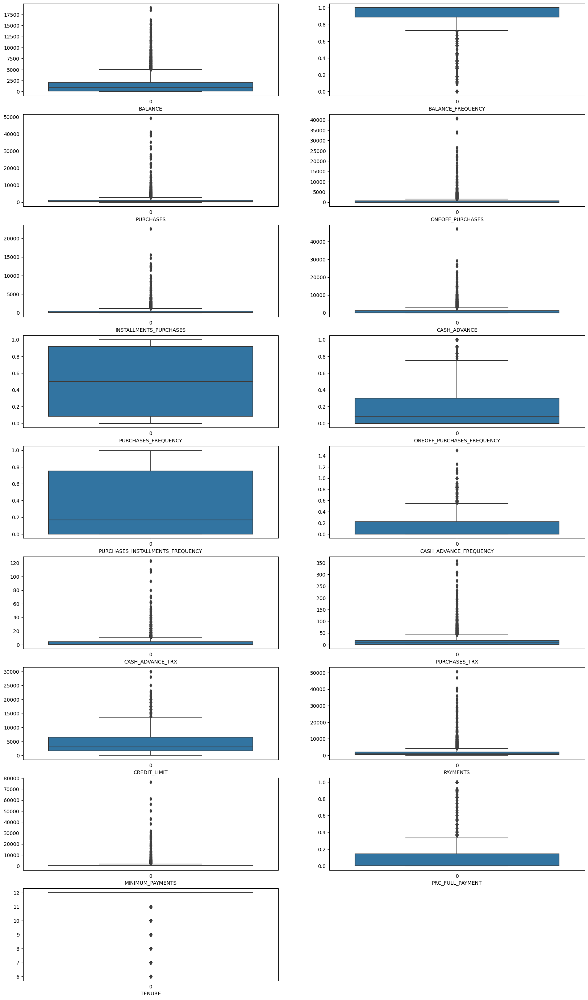

In [15]:
plt.figure(figsize=(20,35))
for i, col in enumerate(df.columns):
    ax = plt.subplot(9, 2, i+1)
    sns.boxplot(df[col])
    plt.xlabel(col)

plt.show()

*   Check noise and outer layer

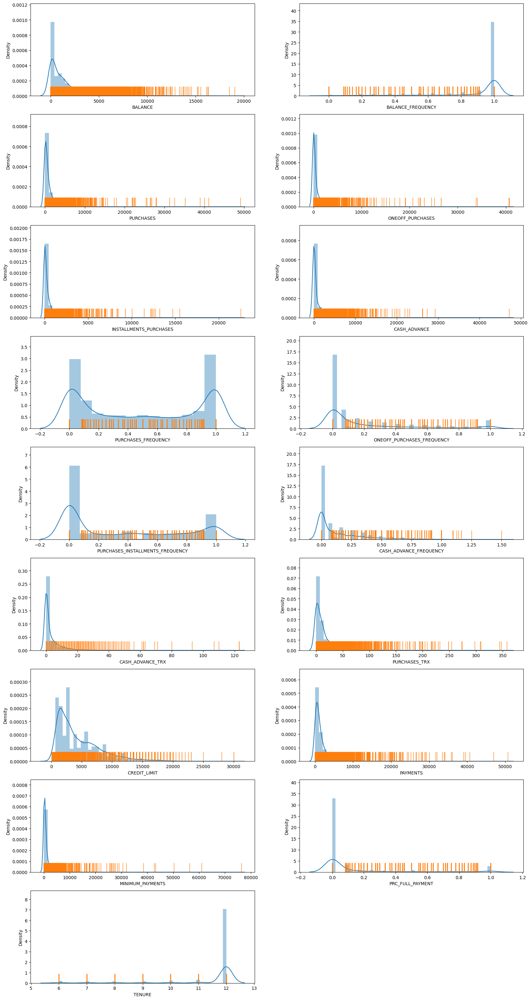

In [16]:
#Examining the normal distribution of features
i=1
plt.figure(figsize= (20,40))
for col in df.columns:
    plt.subplot(9,2,i)
    sns.distplot(df[col])#This function combines the matplotlib hist function with the seaborn kdeplot()
    sns.rugplot(df[col], height=.1)#This function is intended to complement other plots by showing the location of individual observations
    i=i+1
plt.show()

*  The distribution is not normal and the slope is drawn to one side

*  توزیع نرمال نیست و شیب به یک سمت کشیده شده

# missing values

In [17]:
df.isnull().sum()

BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [18]:
def show_null(data):
    sum_null = data.isnull().sum().sort_values(ascending = False)
    count_percent = (data.isnull().sum() / data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([sum_null, count_percent], axis=1, keys = ['sum_null', 'count_percent'])

In [19]:
show_null(df).style.background_gradient(cmap = 'Spectral')

,sum_null,count_percent
MINIMUM_PAYMENTS,313,3.497207
CREDIT_LIMIT,1,0.011173
BALANCE,0,0.000000
CASH_ADVANCE_FREQUENCY,0,0.000000
PRC_FULL_PAYMENT,0,0.000000
PAYMENTS,0,0.000000
PURCHASES_TRX,0,0.000000
CASH_ADVANCE_TRX,0,0.000000
PURCHASES_INSTALLMENTS_FREQUENCY,0,0.000000
BALANCE_FREQUENCY,0,0.000000


In [20]:
# missing values aren't alot, so i drop them.
df.dropna(inplace = True)
df.reset_index( inplace = True)
df.drop('index',axis=1,inplace = True)
df

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6
8632,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8633,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8634,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [21]:
def summary(x):
    x_min = df[x].min()     # mohasebeye minimum
    x_max = df[x].max()     # mohasebeye maximum
    Q1 = df[x].quantile(0.25)   #25%    (darvaghe haman dataye describe ra mikhahim namayesh dahim.)
    Q2 = df[x].quantile(0.50)   #50%
    Q3 = df[x].quantile(0.75)   #75%
    print(f'5 Point Summary of {x.capitalize()} Attribute:\n'
          f'{x.capitalize()}(min) : {x_min}\n'
          f'Q1                    : {Q1}\n'
          f'Q2(Median)            : {Q2}\n'
          f'Q3                    : {Q3}\n'
          f'{x.capitalize()}(max) : {x_max}')

    fig = plt.figure(figsize=(16, 10))
    plt.subplots_adjust(hspace = 0.6)
    sns.set_palette('pastel')

    plt.subplot(441)    # in adade dakhele parantez : size plathara kuchak va bozorg mikonad. bayad 3 raghami bashad.
# harche in adad be satmte kamtar masalan 221 beravad size plot bozorgtar va harche be samte bishtar 551 beravad size plot kuchetar mishavad.
    ax1 = sns.distplot(df[x], color = 'r')   # namayesh plot be surate distplot
    plt.title(f'{x.capitalize()} Density Distribution')   #titre plot: Density Distribution

    plt.subplot(442)
    ax2 = sns.violinplot(x = df[x], palette = 'Accent', split = True)
    plt.title(f'{x.capitalize()} Violinplot')

    plt.subplot(443)
    ax2 = sns.boxplot(x=df[x], palette = 'cool', width=0.7, linewidth=0.6)
    plt.title(f'{x.capitalize()} Boxplot')

    plt.subplot(444)
    ax3 = sns.kdeplot(df[x], cumulative=True)
    plt.title(f'{x.capitalize()} Cumulative Density Distribution')

    plt.show()

5 Point Summary of Balance Attribute:
Balance(min) : 0.0
Q1                    : 148.095189
Q2(Median)            : 916.855459
Q3                    : 2105.195853
Balance(max) : 19043.13856


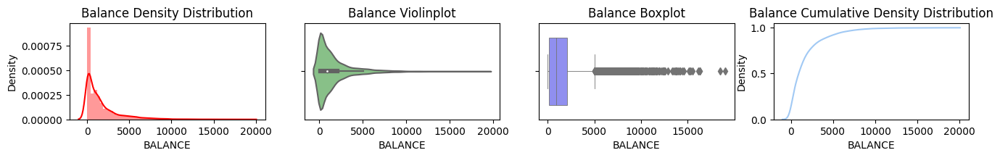

In [22]:
summary('BALANCE')    #تعادل خرید(مبلغ موجودی در حساب آنها برای خرید باقی مانده است)

In [23]:
#کمترین مبلغ موجودی حساب برای خرید(0)یعنی موجودی ندارد
#بیشترین مبلغ موجودی حساب برای خرید (19043)دلار است
#بطور میانگین 916 دلار همیشه موجودی حساب دارد
#موجودی حسابش تا 5000دلار بصورت صعودی افزایش می یابد

5 Point Summary of Balance_frequency Attribute:
Balance_frequency(min) : 0.0
Q1                    : 0.909091
Q2(Median)            : 1.0
Q3                    : 1.0
Balance_frequency(max) : 1.0


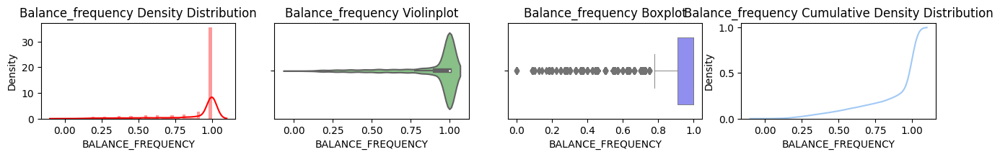

In [24]:
summary('BALANCE_FREQUENCY') #تعداد دفعات به روزرسانی موجودی، امتیاز بین 0 تا 1 (1 = اغلب به روزرسانی میشود، 0 = اغلب به روزرسانی نمیشود)

5 Point Summary of Purchases Attribute:
Purchases(min) : 0.0
Q1                    : 43.3675
Q2(Median)            : 375.405
Q3                    : 1145.98
Purchases(max) : 49039.57


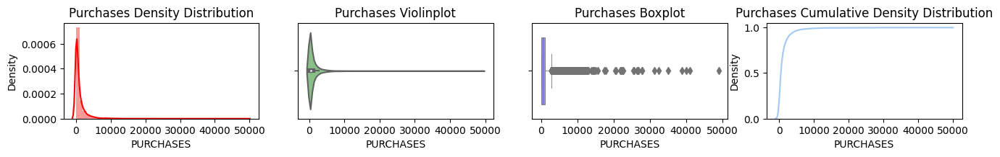

In [25]:
summary('PURCHASES')    #مقدار خریدهای انجام شده از حساب

In [26]:
# کمترین میزانخرید انجام شده از حساب صفر یعنی خریدی انجام نشده
# بیشترین میزان خرید از حساب49039 دلار است
# قبلا مشاهده کردیم که مبلغ موجودی حساب حدودا 20000 دلار بود، پس چطور مبلغ ماکزیمم خرید 49039 شده است؟!!!
# احتمالا نویز دارد
# بطور معمول بین 43 دلار تا 1145 دلار خرید انجام شده است

5 Point Summary of Oneoff_purchases Attribute:
Oneoff_purchases(min) : 0.0
Q1                    : 0.0
Q2(Median)            : 44.995000000000005
Q3                    : 599.1
Oneoff_purchases(max) : 40761.25


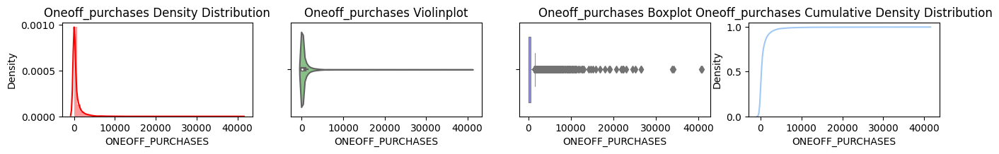

In [27]:
summary('ONEOFF_PURCHASES')  #حداکثر مقدار خرید یکباره انجام می شود

In [28]:
# حداکثر مقدار خرید یکباره انجام می شود بین کمترین (0) و بیترین (40761) است
# بطور معمول مبلغ مقدار خریدی که بصورت یکباره انجام شده (599) دلار است

5 Point Summary of Installments_purchases Attribute:
Installments_purchases(min) : 0.0
Q1                    : 0.0
Q2(Median)            : 94.785
Q3                    : 484.14750000000004
Installments_purchases(max) : 22500.0


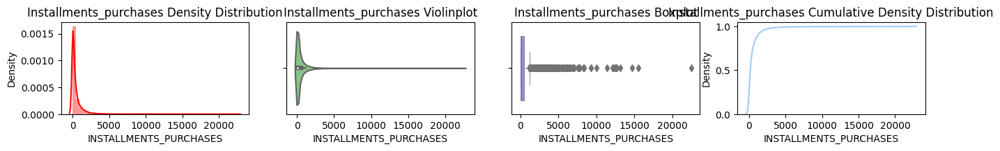

In [29]:
summary('INSTALLMENTS_PURCHASES')   #مبلغ خرید به صورت اقساطی انجام شده است

In [30]:
#مبلغ خریدی که بصورت اقساطی انجام شده بین بازه 0 تا 22500 دلار است
#که بطور معمول 484دلار و بطور میانگین 94 دلار بصورت اقساطی خرید انجام شده است

5 Point Summary of Purchases_frequency Attribute:
Purchases_frequency(min) : 0.0
Q1                    : 0.083333
Q2(Median)            : 0.5
Q3                    : 0.916667
Purchases_frequency(max) : 1.0


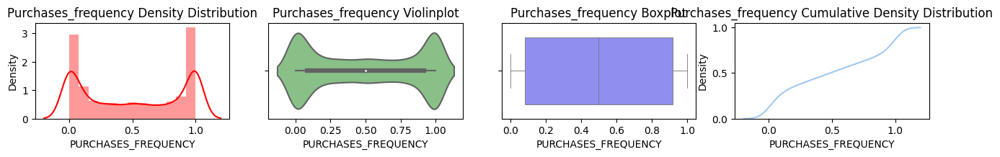

In [31]:
summary('PURCHASES_FREQUENCY') # دفعات خرید
#تعداد دفعاتی که خریدها انجام می شوند، بین 0 تا 1 امتیاز در نظر بگیرید (1 = اغلب خریداری می شود، 0 = اغلب خریداری نمی شود)

In [32]:
# احتمال اینکه خرید انجام شود از احتمال اینکه خرید انجام نشود بیشتر است

5 Point Summary of Oneoff_purchases_frequency Attribute:
Oneoff_purchases_frequency(min) : 0.0
Q1                    : 0.0
Q2(Median)            : 0.083333
Q3                    : 0.333333
Oneoff_purchases_frequency(max) : 1.0


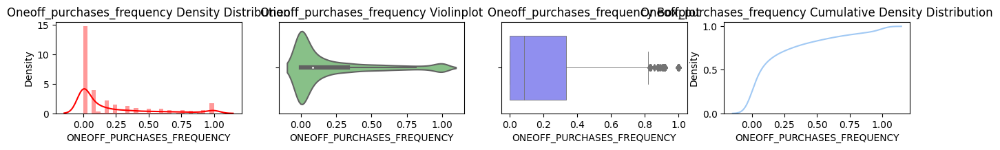

In [33]:
summary('ONEOFF_PURCHASES_FREQUENCY')    #تعداد دفعاتی که خریدها یکباره انجام می شوند

In [34]:
#تعداد دفعاتی که خریدها یکباره انجام می شوند (1 = اغلب خریداری می شود، 0 = اغلب خریداری نمی شود)
# تعداد دفعاتی که خرید یکباره انجام نمیشود خیلی بیشتر از تعداد دفعاتی که خرید یکباره انجام میشود است

5 Point Summary of Purchases_installments_frequency Attribute:
Purchases_installments_frequency(min) : 0.0
Q1                    : 0.0
Q2(Median)            : 0.166667
Q3                    : 0.75
Purchases_installments_frequency(max) : 1.0


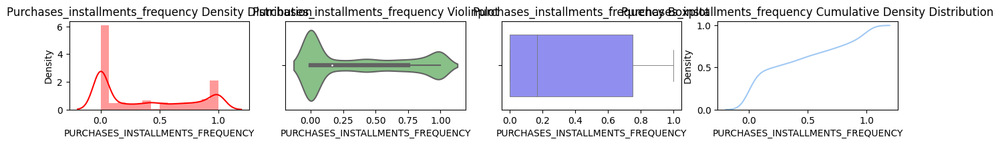

In [35]:
summary('PURCHASES_INSTALLMENTS_FREQUENCY')    #تعداد دفعات خرید اقساطی انجام می شود

In [36]:
#تعداد دفعات خرید اقساطی انجام می شود (1 = اغلب انجام می شود، 0 = اغلب انجام نمی شود)
#تعداد دفعاتی که خرید اقساطی انجام نمیشود خیلی بیشتر از تعداد دفعاتی که خرید اقساطی انجام میشود است

5 Point Summary of Cash_advance Attribute:
Cash_advance(min) : 0.0
Q1                    : 0.0
Q2(Median)            : 0.0
Q3                    : 1132.38549
Cash_advance(max) : 47137.21176


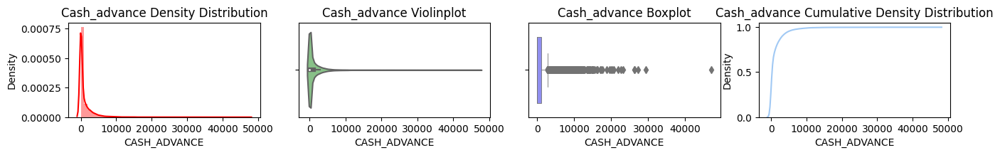

In [37]:
summary('CASH_ADVANCE')   #پیش پرداخت نقدی توسط کابر

In [38]:
#پیش پرداخت نقدی توسط کابر ماکزیمم 47137 دلار و بطور معمول 1132 دلار است

5 Point Summary of Cash_advance_frequency Attribute:
Cash_advance_frequency(min) : 0.0
Q1                    : 0.0
Q2(Median)            : 0.0
Q3                    : 0.25
Cash_advance_frequency(max) : 1.5


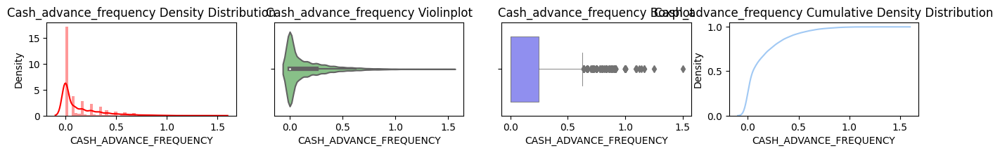

In [39]:
summary('CASH_ADVANCE_FREQUENCY') #تعداد پیش پرداخت نقدی

5 Point Summary of Cash_advance_trx Attribute:
Cash_advance_trx(min) : 0
Q1                    : 0.0
Q2(Median)            : 0.0
Q3                    : 4.0
Cash_advance_trx(max) : 123


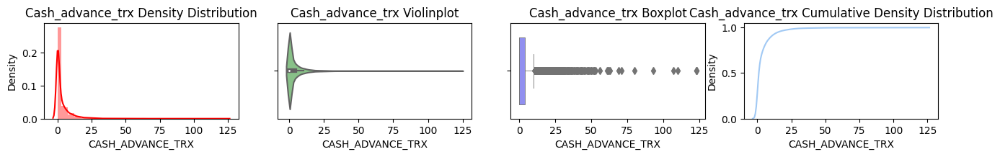

In [40]:
summary('CASH_ADVANCE_TRX')   #تعداد تراکنش های انجام شده با پول نقد

5 Point Summary of Purchases_trx Attribute:
Purchases_trx(min) : 0
Q1                    : 1.0
Q2(Median)            : 7.0
Q3                    : 18.0
Purchases_trx(max) : 358


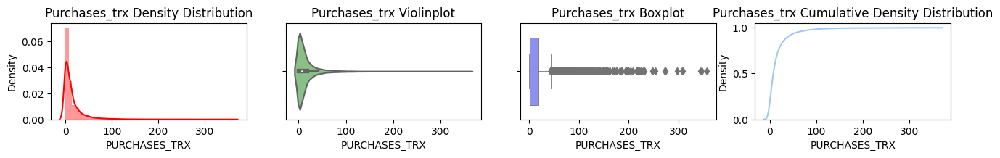

In [41]:
summary('PURCHASES_TRX')  #تعداد معاملات خرید انجام شده

5 Point Summary of Credit_limit Attribute:
Credit_limit(min) : 50.0
Q1                    : 1600.0
Q2(Median)            : 3000.0
Q3                    : 6500.0
Credit_limit(max) : 30000.0


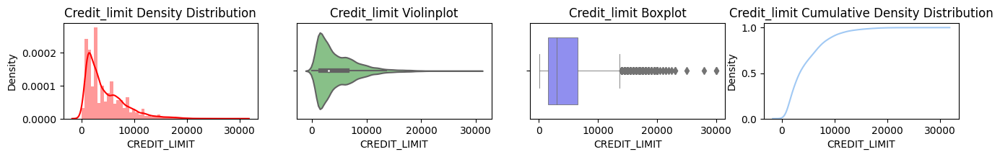

In [42]:
summary('CREDIT_LIMIT')  #محدودیت کارت اعتباری برای کاربر

5 Point Summary of Payments Attribute:
Payments(min) : 0.049513
Q1                    : 418.55923725
Q2(Median)            : 896.675701
Q3                    : 1951.1420905
Payments(max) : 50721.48336


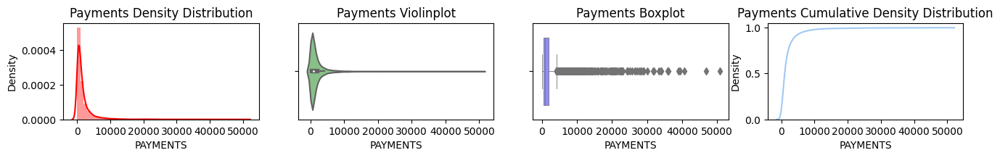

In [43]:
summary('PAYMENTS')    #میزان پرداخت انجام شده توسط کاربر

In [44]:
#میزان پرداخت انجام شده توسط کاربر مینیمم ناچیز 0.04 و ماکزیمم 50721 دلار و بصورت مینگین 896دلار بوده است

5 Point Summary of Minimum_payments Attribute:
Minimum_payments(min) : 0.019163
Q1                    : 169.1635455
Q2(Median)            : 312.4522915
Q3                    : 825.49646275
Minimum_payments(max) : 76406.20752


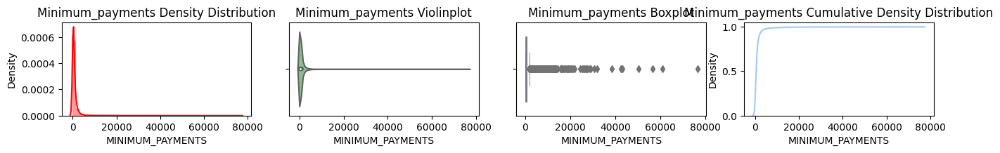

In [45]:
summary('MINIMUM_PAYMENTS')    #حداقل مبلغ پرداختی توسط کاربر

In [46]:
#حداقل مبلغ پرداختی توسط کاربر مینیمم 0.01 دلارو ماکزیمم 76406 دلار بوده است و میانگین 312 دلار

5 Point Summary of Prc_full_payment Attribute:
Prc_full_payment(min) : 0.0
Q1                    : 0.0
Q2(Median)            : 0.0
Q3                    : 0.166667
Prc_full_payment(max) : 1.0


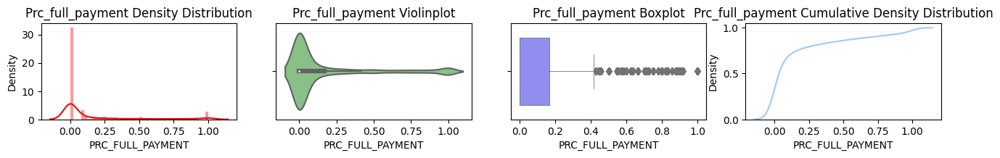

In [47]:
summary('PRC_FULL_PAYMENT')    #درصد پرداخت کامل توسط کاربر

In [48]:
#درصد پرداخت کامل توسط کاربر تقریبا اکثر مواقع صفر بوده و کاربر بصورت کامل کمیسیونی پرداخت نکرده است

5 Point Summary of Tenure Attribute:
Tenure(min) : 6
Q1                    : 12.0
Q2(Median)            : 12.0
Q3                    : 12.0
Tenure(max) : 12


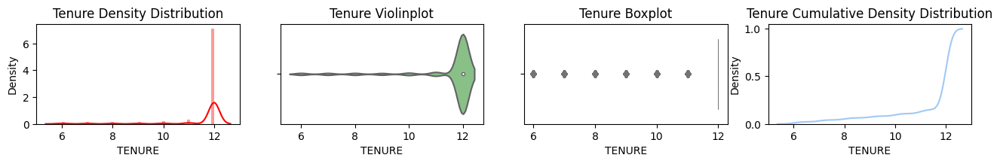

In [49]:
summary('TENURE')   #مدت زمان خدمت کارت اعتباری برای کاربر

In [50]:
#مدت زمان خدمت کارت اعتباری برای کاربر اکثرا 12 ماه بوده است

In [51]:
import plotly.graph_objects as go

In [52]:
trace0 = go.Box(y=df["BALANCE"], name="BALANCE", boxmean=True)
trace1 = go.Box(y=df["PURCHASES"], name="PURCHASES", boxmean=True)
trace2 = go.Box(y=df["ONEOFF_PURCHASES"], name="ONEOFF_PURCHASES", boxmean=True)
trace3 = go.Box(y=df["INSTALLMENTS_PURCHASES"], name="INSTALLMENTS_PURCHASES", boxmean=True)
trace4 = go.Box(y=df["CASH_ADVANCE"], name="CASH_ADVANCE", boxmean=True)
traces = [trace0, trace1, trace2, trace3, trace4]
layout = go.Layout(title="BoxPlot for Data")
fig_go = go.Figure(data=traces, layout=layout)
fig_go.show()

In [53]:
# BALANCE : مبلغ موجودی در حساب آنها برای خرید باقی مانده است
# PURCHASES : مقدار خریدهای انجام شده از حساب
# ONEOFF_PURCHASES : حداکثر مقدار خرید یکباره انجام می شود
# INSTALLMENTS_PURCHASES : مبلغ خرید به صورت اقساطی انجام شده است
# CASH_ADVANCE : پیش پرداخت نقدی توسط کابر
# PURCHASES > ONEOFF_PURCHASES > CASH_ADVANCE > INSTALLMENTS_PURCHASES > BALANCE
# موجودی حساب < خرید اقساطی < پیش پرداخت نقدی < مقدار خرید انجام شده

In [54]:
trace0 = go.Box(y=df["BALANCE_FREQUENCY"], name="BALANCE_FREQUENCY", boxmean=True)
trace1 = go.Box(y=df["PURCHASES_FREQUENCY"], name="PURCHASES_FREQUENCY", boxmean=True)
trace2 = go.Box(y=df["PURCHASES_INSTALLMENTS_FREQUENCY"], name="PURCHASES_INSTALLMENTS_FREQUENCY", boxmean=True)
trace3 = go.Box(y=df["CASH_ADVANCE_FREQUENCY"], name="CASH_ADVANCE_FREQUENCY", boxmean=True)
trace4 = go.Box(y=df["PRC_FULL_PAYMENT"], name="PRC_FULL_PAYMENT", boxmean=True)
traces = [trace0, trace1, trace2, trace3, trace4]
layout = go.Layout(title="BoxPlot for Data")
fig_go = go.Figure(data=traces, layout=layout)
fig_go.show()

In [55]:
# BALANCE_FREQUENCY : تعداد دفعات به روزرسانی موجودی
# امتیاز بین 0 تا 1 (1 = اغلب به روزرسانی میشود، 0 = اغلب به روزرسانی نمیشود)
# PURCHASES_FREQUENCY :  تعداد دفعات خرید
# تعداد دفعاتی که خریدها انجام می شوند، بین 0 تا 1 امتیاز در نظر بگیرید (1 = اغلب خریداری می شود، 0 = اغلب خریداری نمی شود)
# PURCHASES_INSTALLMENTS_FREQUENCY : تعداد دفعات خرید اقساطی انجام می شود
# تعداد دفعات خرید اقساطی انجام می شود (1 = اغلب انجام می شود، 0 = اغلب انجام نمی شود)
# CASH_ADVANCE_FREQUENCY : تعداد پیش پرداخت نقدی
# PRC_FULL_PAYMENT : درصد پرداخت کامل توسط کاربر
# BALANCE_FREQUENCY > PURCHASES_FREQUENCY > PURCHASES_INSTALLMENTS_FREQUENCY > CASH_ADVANCE_FREQUENCY > PRC_FULL_PAYMENT
# درصد پرداخت کامل توسط کاربر < تعداد پیش پرداخت نقدی < تعداد دفعات خرید اقساطی < تعداد دفعات خرید < تعداد دفعات به روزرسانی موجودی

In [56]:
trace0 = go.Box(y=df["CASH_ADVANCE_TRX"], name="CASH_ADVANCE_TRX", boxmean=True)
trace1 = go.Box(y=df["PURCHASES_TRX"], name="PURCHASES_TRX", boxmean=True)
trace2 = go.Box(y=df["TENURE"], name="TENURE", boxmean=True)
traces = [trace0, trace1, trace2]
layout = go.Layout(title="BoxPlot for Data")
fig_go = go.Figure(data=traces, layout=layout)
fig_go.show()

In [57]:
# CASH_ADVANCE_TRX : تعداد تراکنش های انجام شده با پول نقد
# PURCHASES_TRX : تعداد معاملات خرید انجام شده
# TENURE : مدت زمان خدمت کارت اعتباری برای کاربر
# PURCHASES_TRX > TENURE > CASH_ADVANCE_TRX
# تعداد تراکنش های انجام شده < مدت زمان خدمت کارت اعتباری < تعداد معاملات خرید

In [58]:
trace0 = go.Box(y=df["CREDIT_LIMIT"], name="CREDIT_LIMIT", boxmean=True)
trace1 = go.Box(y=df["PAYMENTS"], name="PAYMENTS", boxmean=True)
trace2 = go.Box(y=df["MINIMUM_PAYMENTS"], name="MINIMUM_PAYMENTS", boxmean=True)
traces = [trace0, trace1, trace2]
layout = go.Layout(title="BoxPlot for Data")
fig_go = go.Figure(data=traces, layout=layout)
fig_go.show()

In [59]:
# CREDIT_LIMIT : محدودیت کارت اعتباری برای کاربر
# PAYMENTS : میزان پرداخت انجام شده توسط کاربر
# MINIMUM_PAYMENTS : حداقل مبلغ پرداختی توسط کاربر
# CREDIT_LIMIT > PAYMENTS > MINIMUM_PAYMENTS
# حداقل مبلغ پرداختی < میزان پرداخت انجام شده < محدودیت کارت اعتباری
# 3000 $ > 896 $ > 312 $

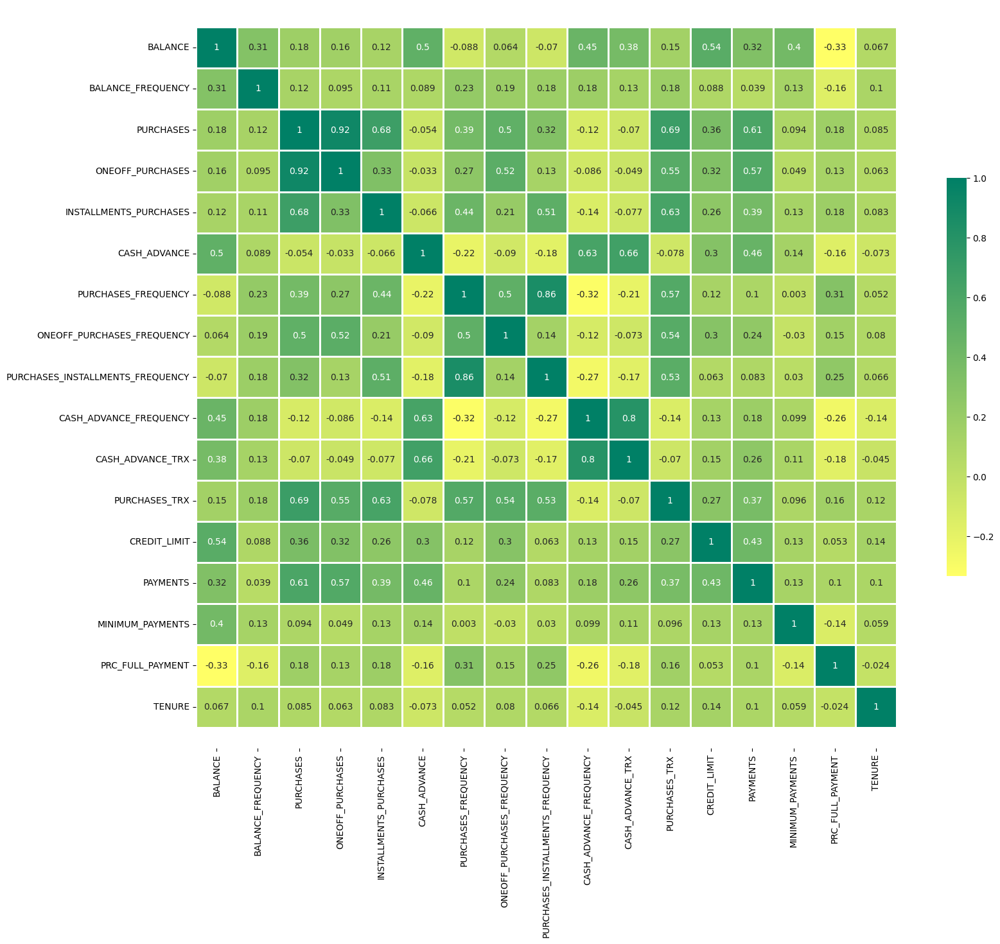

In [60]:
# barresi correlatin features
corr = df.corr()
plt.figure(figsize=(20, 15))
g = sns.heatmap(corr, annot=True, cmap = 'summer_r', square=True, linewidth=1, cbar_kws={'fraction' : 0.02})
g.set_yticklabels(g.get_yticklabels(), rotation=0, horizontalalignment='right')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
plt.show()

In [61]:
# PURCHASES(مقدار خریدهای انجام شده) va ONEOFF_PURCHASES(خریدهای یکباره) 92% corrolation darand.(بیشترین میزان کرولیشن)
# PURCHASES_FREQUENCY(دفعات خرید) va PURCHASES_INSTALLMENTS_FREQUENCY(دفعات خرید اقساطی) 86% corrolation darand.
# CASH_ADVANCE_FREQUENCY(تعداد تراکنشهای انجام شده در پیش پرداخت) va CASH_ADVANCE_TRX(فراوانی پیش پرداخت نقدی بانک) 80% corrolation darand.
# PURCHASES_TRX(فراوانی مقدار خرید بانک) va PURCHASES(مقدار خریدهای انجام شده) 69% corrolation darand.
# PURCHASES(مقدار خریدهای انجام شده) va INSTALLMENTS_PURCHASES(خریدهای اقساطی) 68% corrolation darand.
#CASH_ADVANCE_TRX(فراوانی پیش پرداخت نقدی بانک) va CASH_ADVANCE(پیش پرداخت نقدی) 66% corrolation darand.

In [62]:
print(df['TENURE'].value_counts())

12    7346
11     356
10     226
6      184
8      183
7      177
9      164
Name: TENURE, dtype: int64


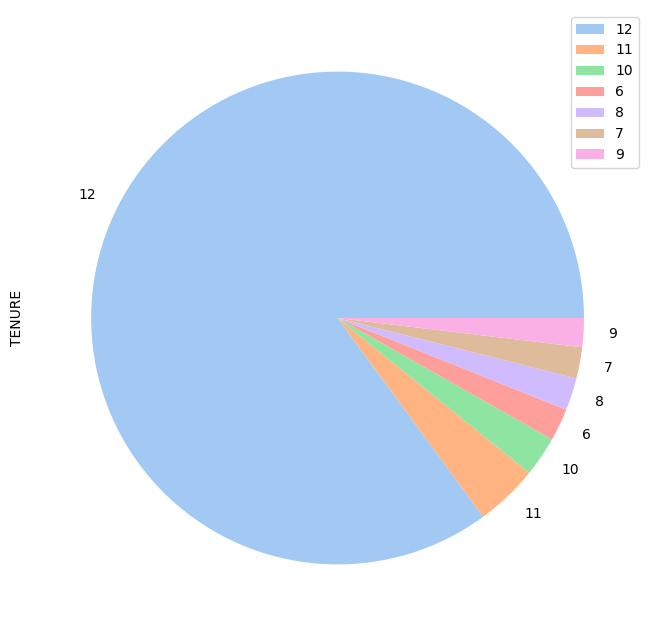

In [63]:
df_TENURE=pd.DataFrame(df['TENURE'].value_counts())
plot = df_TENURE.plot.pie(y='TENURE', figsize=(8, 8))

#بیشترین میزان انتخاب زمان سرویس دهی کارت ، توسط کاربران 12ماه است

<Axes: xlabel='TENURE', ylabel='CREDIT_LIMIT'>

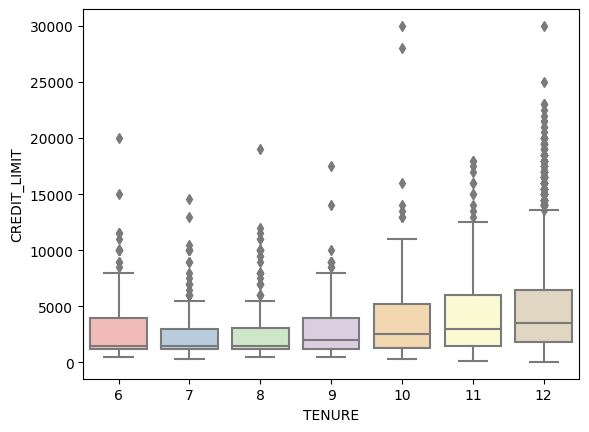

In [64]:
sns.boxplot(x = 'TENURE', y = 'CREDIT_LIMIT', data = df,palette='Pastel1')

#محدودیت اعتبار کارت با هر بازه سرویس بیشتر بین صفر تا 5000 قرار دارد

<Axes: xlabel='TENURE', ylabel='BALANCE_FREQUENCY'>

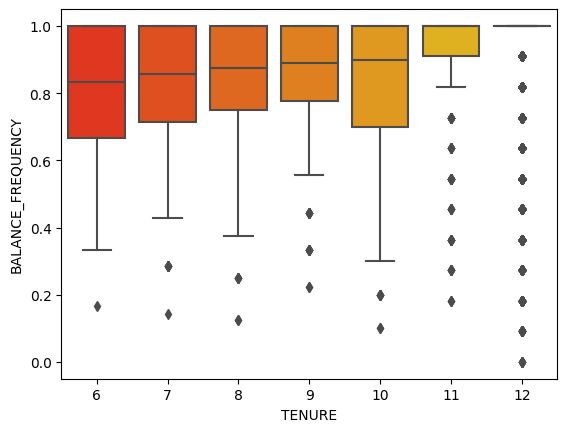

In [65]:
sns.boxplot(x = 'TENURE', y = 'BALANCE_FREQUENCY', data = df,palette='autumn')

#کاربرانی که شش ماه سرویس دهی را انتخاب می کنند بیشترین میزان آپدیت شدن موجودی مانده حساب خود را دارند
#کاربرانی که دوازده  ماه سرویس دهی را انتخاب می کنند کمترین میزان آپدیت شدن موجودی مانده حساب خود را دارند

<Axes: xlabel='CREDIT_LIMIT', ylabel='PRC_FULL_PAYMENT'>

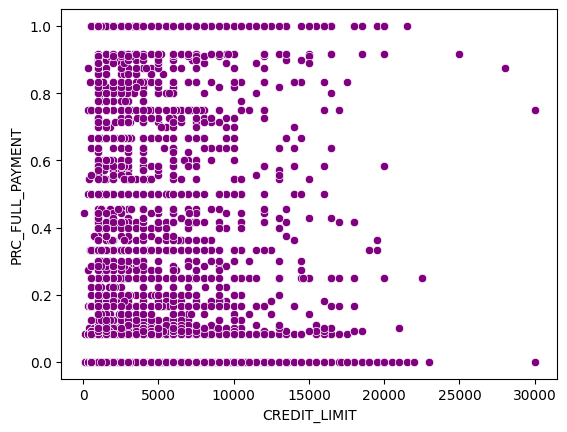

In [66]:
sns.scatterplot(x='CREDIT_LIMIT', y='PRC_FULL_PAYMENT', data=df,color='purple')

#کاربرانی که تاریخ اعتبار کارت آنها کمتر است بیشتر پرداختهایشان را بصورت کامل انجام می دهند

<Axes: xlabel='BALANCE', ylabel='PURCHASES'>

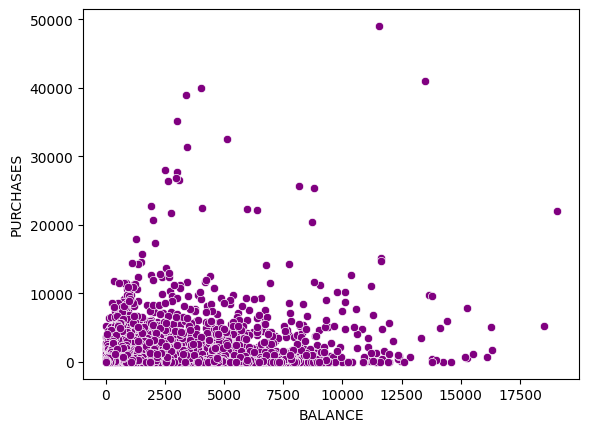

In [67]:
sns.scatterplot(x='BALANCE', y='PURCHASES', data=df,color='purple')

#تقریبا افرادی که مانده حساب کمتری دارند از بقیه ولخرج تر هستند و خرید بیشتری انجام دادند
#اشخاص دارای موجودی بین 0 تا 3000 دلار

In [68]:
#normalize all features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df)

# K-Mean
#K-means clustering tries to minimize distances within a cluster and maximize the distance between different clusters.
#این خوشه بندی تلاش می کند تا فواصل درون یک خوشه را به حداقل، و فاصله بین خوشه های مختلف را به حداکثر برساند

In [70]:
!pip install kneed

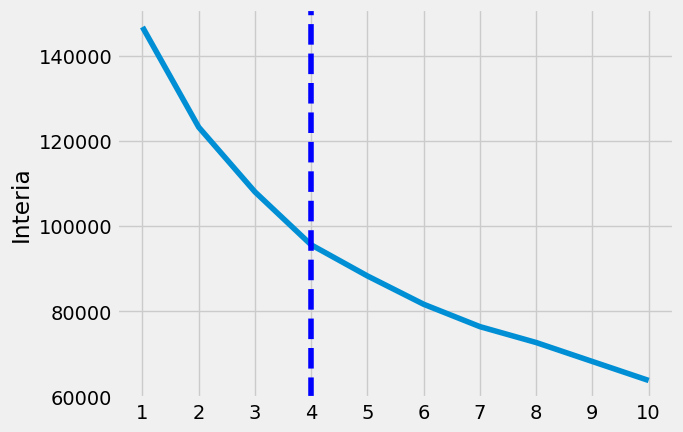

In [72]:
# ye liste khali dorost mikonim, mikhaym bebinim beyne "k" [1 ta 11] kodumesh behtarine.
List = []
for k in range(1,11):#this range is optional
    kmeans = KMeans(n_clusters=k, init= "random",max_iter = 300, random_state = 1, n_init = 10)
    kmeans.fit(scaled_features)
    List.append(kmeans.inertia_)
from kneed import KneeLocator
kl = KneeLocator(range(1,11), List, curve='convex', direction='decreasing')
kl.elbow
plt.style.use("fivethirtyeight")
plt.plot(range(1,11),List)
plt.xticks(range(1,11))
plt.ylabel("Interia")
plt.axvline(x=kl.elbow, color='b', label='axvline - full height', ls='--')
plt.show()

In [73]:
# moshahede mikonim k harche tedade cluster kamtar bashad, inertia bishtar ast.
#masalan tedade cluster = 1, inertia = 60 shode,cluster = 2 ,inertia = 23 shode, ....
# harchi tedade cluster (k) bishtar mishavad, inertia (darsade khata) kamtar mishavad.

In [74]:
# method haye daruni kmeans : {"init":"random","n_init":10, "max_iter":300, "random_state":42}
#kmeans_set = {"init":"random", "n_init":10, "max_iter":300, "random_state":42}
#mitavan be in shekl ham nevesht: kmeans = KMeans(n_clusters=k, **kmeans_set)
# (n_clusters=k) : tedade clusterha ra neshan midahad. mitavanad dasti taiin shavad.
# (**) : code dictionari ra baraye ma open mikonad.
# (.inertia_) : site www.codecademy.com/learn/machine_learning/modules/dspath_clustering/cheatsheet-cheatsheet-page-heading
#inertia : neshan midahad k modele ma cheghdr daghigh ast, dar vaghe modele ma cheghadr ruye datasete ma khub kar karde ast.
# mohasebate 'inertiya' : bar hasbe fasele beye har kodam az centroid(markaze) haye cluterhaye un dataet ast.
# (modeli)clusteringi az nazare behine budane tedade cluster va deghat khube : ke ham 'inertiya' un paiin bashad va ham tedade clusterha kam bashad.

In [75]:
from kneed import KneeLocator
k1 = KneeLocator(range(1, 11), List, curve="convex", direction="decreasing")
k1.elbow

4

In [76]:
# x = range(1, 11) , hamun tedade cluster
# y = List
# miyad x va y ra migirad sepas taghire shive ra barresi mikonad.

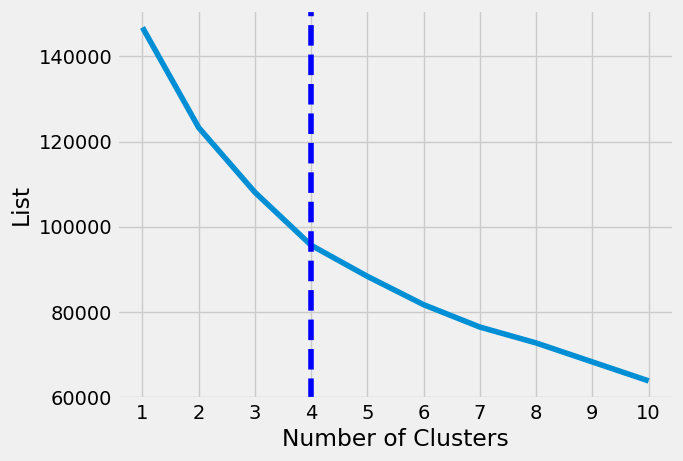

In [77]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), List)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("List")
plt.axvline(x=k1.elbow, color='b', label='axvline-full height', ls='--')
plt.show()

In [78]:
# pas motevaje shodim clustering ma chaharom behtare.

In [79]:
# dar metrics adade balatar yani behtar
#biyaym range k ro bedim be metricha,agar balatarin adad ba in k1.elbow nazdik budan yani bedune shak behinetar ast.

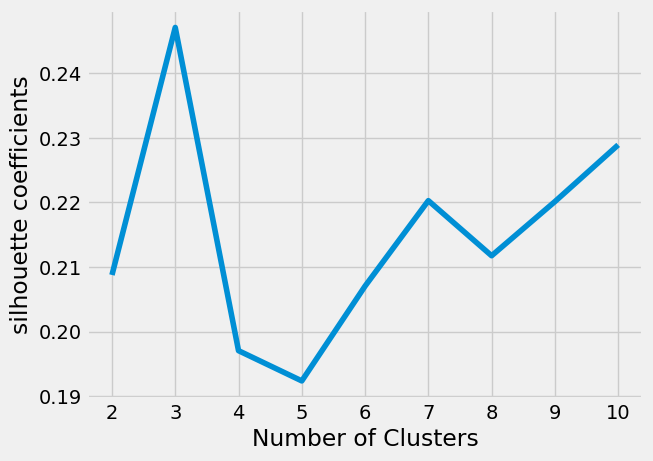

In [80]:
from sklearn.metrics import silhouette_score
silhouette_coefficients = []
for k in range (2,11):
    kmeans = KMeans(n_clusters=k,init= "random", random_state = 1)
    kmeans.fit(scaled_features)
    score = silhouette_score(scaled_features, kmeans.labels_)
    silhouette_coefficients.append(score)
plt.style.use("fivethirtyeight")
plt.plot(range(2,11), silhouette_coefficients)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show()

In [81]:
# moshahede mikonim : k=3, k=6, k=8, k=9, k=10
# elbow = 4 : ghablan bedast avardim
# modele behtar : elbow(inertia=low), k=low
#pas k=3 ra be onvane parametre behine entekhab mikonim.
# natije : k=4 ham dar elbow va ham dar silhouette be ma be onvane parametre behine neshan dade shod.
#pas k=4 gharar dade va modeleman ra misazim.

In [82]:
max(silhouette_coefficients)

0.24709726016009056

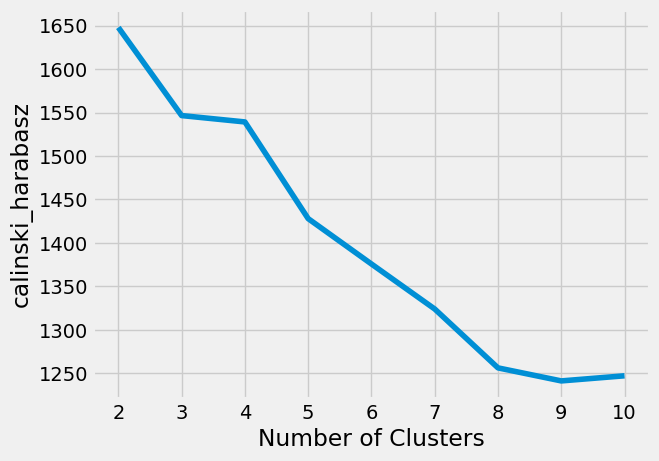

In [83]:
from sklearn import metrics
from sklearn.metrics import calinski_harabasz_score
calinski_harabaz = []
for k in range (2,11):
    kmeans = KMeans(n_clusters=k,init= "random", random_state = 1)
    kmeans.fit(scaled_features)
    metrics.calinski_harabasz_score(scaled_features, kmeans.labels_)
    calinski_harabaz.append(metrics.calinski_harabasz_score(scaled_features, kmeans.labels_))
plt.style.use("fivethirtyeight")
plt.plot(range(2,11), calinski_harabaz)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("calinski_harabasz")
plt.show()

In [84]:
max(calinski_harabaz)

1647.931477221298

In [85]:
#شاخص کالینسکی-هاراباسز به عنوان معیار نسبت واریانس شناخته میشود - میتواند برای ارزیابی مدل استفاده شود
#جایی که مقدار کالینسکی-هاراباسز بالاتر مربوط به مدلی با خوشه های تعریف شده بهتر
#شاخص نسبت مجموع پراکندگی بین خوشه ها و پراکندگی درون خوشه ای برای همه خوشه ها است
#(که در آن پراکندگی به عنوان مجموع فواصل مجذور تعریف می شود)

#banabarin 3 cluster ba silhouette score = 0.24771296656343036, behtrin halat baraye modelsazi kmeans ast.

In [86]:
kmeans = KMeans(n_clusters=3,init= "random", random_state = 1)
kmeans.fit(scaled_features)
labels = kmeans.labels_

In [87]:
#مشاهده سنترویدهای کلاستر (سنتروید عادی، در اینجا اعداد منفی وجود دارد)
# view cluster centers (normalized centers, here ther are negative numbers)
cluster_centers = pd.DataFrame(data = kmeans.cluster_centers_, columns = [df.columns])
cluster_centers

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,1.145171,0.312521,-0.296682,-0.212560,-0.310883,1.360100,-0.656780,-0.317302,-0.563171,1.539607,1.323633,-0.374920,0.593281,0.438286,0.399018,-0.424843,-0.136670
1,-0.370274,-0.170479,-0.233299,-0.204393,-0.175853,-0.312871,-0.058510,-0.232819,-0.047603,-0.337233,-0.301960,-0.244794,-0.342769,-0.287986,-0.139703,0.016660,-0.024476
2,0.308067,0.419872,1.512495,1.263769,1.253044,-0.247855,1.133379,1.536870,0.959426,-0.362451,-0.253407,1.669393,0.889624,0.825350,0.159024,0.469511,0.295338


In [88]:
# مشاهده مراکز واقعی (اکنون اعداد منفی را نمی بینیم)
# viewing real centers (now we dont see negative number)
cluster_centers = scaler.inverse_transform(cluster_centers)
cluster_centers = pd.DataFrame(data = cluster_centers, columns = [df.columns])
cluster_centers

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,4000.872625,0.959941,382.530089,246.904994,135.703967,3879.404880,0.232467,0.110707,0.144639,0.448266,12.463010,5.593112,6692.923817,3059.733262,1810.947120,0.033442,11.355230
1,825.333664,0.859629,519.878185,260.660761,259.552571,330.471258,0.472523,0.136055,0.349871,0.069557,1.226737,8.869558,3267.888610,946.543163,532.870304,0.164239,11.502305
2,2246.763523,0.982236,4302.983675,2733.354013,1570.125120,468.392079,0.950768,0.667025,0.750739,0.064469,1.562345,57.066887,7777.250206,4185.951945,1241.578059,0.298398,11.921552


In [89]:
#افزودن ستون کلاستر به دیتافریم
#adding cluster column to dataframe
df_cluster_with_kmean = pd.concat([df, pd.DataFrame({'cluster': labels})], axis = 1)
df_cluster_with_kmean

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,1
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6,1
8632,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,1
8633,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,1
8634,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,1


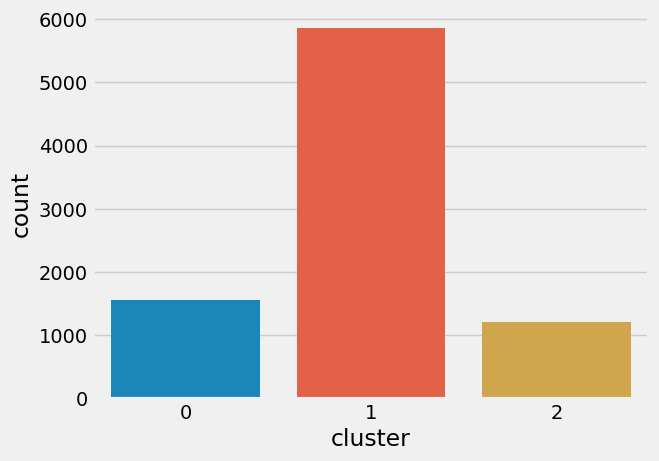

In [90]:
# شمارش تعداد کلاسترها
# counting number of clusters
sns.countplot(x=df_cluster_with_kmean.cluster)
plt.show()

#most of people are grouped in cluster 2

#بیشتر افراد در کلاستر 2 گروه بندی می شوند

In [91]:
#sepas:
#az derakhte tasmim baraye taiine mahdude feature haye mohem dar clusterbandi estefade mikonim
#in mahdude ra dar yek dataframe neshan dade va az un baraye tafsire class ha estefade mikonim

In [92]:
## تفسیر خوشه ها با درخت تصمیم
# interpreting clusters with decision tree
from sklearn.tree import _tree, DecisionTreeClassifier
from IPython.display import display, HTML

def pretty_print(df):
    return display( HTML( df.to_html().replace("\\n","<br>") ) )

def get_class_rules(tree: DecisionTreeClassifier, feature_names: list):
  inner_tree: _tree.Tree = tree.tree_
  classes = tree.classes_
  class_rules_dict = dict()

  def tree_dfs(node_id=0, current_rule=[]):
    # feature[i] holds the feature to split on, for the internal node i.
    split_feature = inner_tree.feature[node_id]
    if split_feature != _tree.TREE_UNDEFINED: # internal node
      name = feature_names[split_feature]
      threshold = inner_tree.threshold[node_id]
      # left child
      left_rule = current_rule + ["({} <= {})".format(name, threshold)]
      tree_dfs(inner_tree.children_left[node_id], left_rule)
      # right child
      right_rule = current_rule + ["({} > {})".format(name, threshold)]
      tree_dfs(inner_tree.children_right[node_id], right_rule)
    else: # leaf
      dist = inner_tree.value[node_id][0]
      dist = dist/dist.sum()
      max_idx = dist.argmax()
      if len(current_rule) == 0:
        rule_string = "ALL"
      else:
        rule_string = " and ".join(current_rule)
      # register new rule to dictionary
      selected_class = classes[max_idx]
      class_probability = dist[max_idx]
      class_rules = class_rules_dict.get(selected_class, [])
      class_rules.append((rule_string, class_probability))
      class_rules_dict[selected_class] = class_rules

  tree_dfs() # start from root, node_id = 0
  return class_rules_dict

def cluster_report(data: pd.DataFrame, clusters, min_samples_leaf=50, pruning_level=0.01):
    # Create Model
    tree = DecisionTreeClassifier(min_samples_leaf=min_samples_leaf, ccp_alpha=pruning_level)
    tree.fit(data, clusters)

    # Generate Report
    feature_names = data.columns
    class_rule_dict = get_class_rules(tree, feature_names)

    report_class_list = []
    for class_name in class_rule_dict.keys():
        rule_list = class_rule_dict[class_name]
        combined_string = ""
        for rule in rule_list:
            combined_string += "[{}] {}\n\n".format(rule[1], rule[0])
        report_class_list.append((class_name, combined_string))

    cluster_instance_df = pd.Series(clusters).value_counts().reset_index()
    cluster_instance_df.columns = ['class_name', 'instance_count']
    report_df = pd.DataFrame(report_class_list, columns=['class_name', 'rule_list'])
    report_df = pd.merge(cluster_instance_df, report_df, on='class_name', how='left')
    pretty_print(report_df.sort_values(by='class_name')[['class_name', 'instance_count', 'rule_list']])

cluster_report(df,df_cluster_with_kmean.cluster,min_samples_leaf=20,pruning_level=0.05)

,class_name,instance_count,rule_list
1,0,1567,[0.7862595419847328] (CASH_ADVANCE > 1983.13330078125)
0,1,5857,[0.8970418112708644] (CASH_ADVANCE <= 1983.13330078125) and (PURCHASES <= 1902.1699829101562)
2,2,1212,[0.7972027972027972] (CASH_ADVANCE <= 1983.13330078125) and (PURCHASES > 1902.1699829101562)


In [93]:
#در این قسمت من مستقیما درخت تصمیم را رسم می کنم و آن را بر روی دیتای کلاستر بندی شده اعمال می کنم
#تا بتوانم با اهمیت ترین فیچرها را بیابم. اگر درخت با عمق دو را رسم کنم و تست سایز را خیلی کم انتخاب کنم
#با اهمیت ترین فیچر در ریشه و بعد از آن فیچرهای فرزندان در ترتیب اهمیت قرار دارند
#فیچرهای با اهمیت برای ترسیم مناسب هستند و همچنین برای تفسیر کلاسترها به ما کمک می کنند

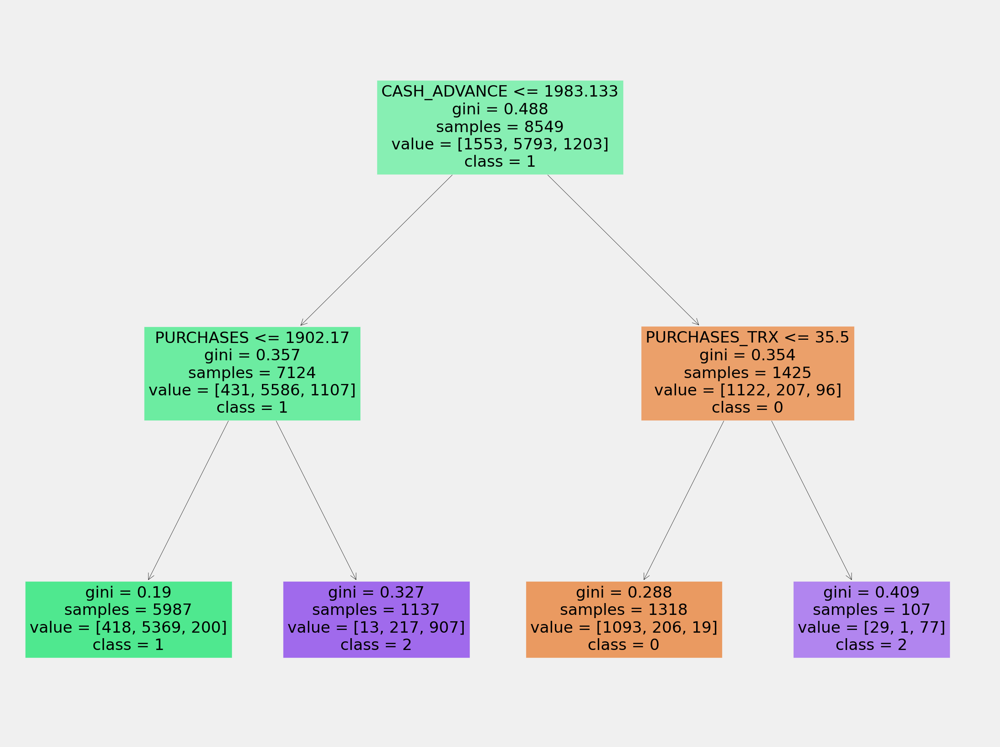

In [94]:
##visualization desision tree to find features to interpret classes
from sklearn import tree
from sklearn.model_selection  import train_test_split
X = df_cluster_with_kmean. drop('cluster', axis =1)
y = df_cluster_with_kmean['cluster']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.01,random_state=1)
clf = DecisionTreeClassifier(max_depth=2)
clf = clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
feature_names = ['BALANCE','BALANCE_FREQUENCY','PURCHASES','ONEOFF_PURCHASES','INSTALLMENTS_PURCHASES','CASH_ADVANCE','PURCHASES_FREQUENCY',
                'ONEOFF_PURCHASES_FREQUENCY','PURCHASES_INSTALLMENTS_FREQUENCY','CASH_ADVANCE_FREQUENCY','CASH_ADVANCE_TRX','PURCHASES_TRX',
                'CREDIT_LIMIT','PAYMENTS','MINIMUM_PAYMENTS','PRC_FULL_PAYMENT','TENURE']
target_names =['0','1','2']
fig = plt.figure(figsize=(25,20))
plot = tree.plot_tree(clf,
                     feature_names = feature_names,
                     class_names = target_names,
                     filled = True)
fig.savefig("Tree1.png")

تفسیر کلاسها با توجه به درخت تصمیم و جدولی که قبل از درخت تصمیم نشان دادیم
افراد بیشتر در کلاس دو طبقه بندی می شوند

class 0:CASH_ADVANCE > 1983 and CASH_ADVANCE_FREQUENCY <= 0.261
کلاس صفر شامل 1543 نفر است که این افراد مقدار پول نقدی که به عنوان وام از حساب برداشت می کنند بیشتر از1983 است و تعداد
این وامها از 0.236 کمتر است

class 1:(CASH_ADVANCE <= 1983) and (PURCHASES > 1902)
کلاس یک شامل 1221 نفر است که این افراد پول نقدی که به عنوان وام از حساب کارت خود برداشت می کنند کمتر از 1983 است و همچنین مقدار خریدهای انجام شده از حساب آنها از 1902 بیشتر است.

class 2:(CASH_ADVANCE <= 1983) and (PURCHASES <= 1902)
کلاس 2 شامل 5872 نفر است که این افراد پول نقدی که به عنوان وام از حساب کارت خود برداشت می کنند از 1983 کمتر است و مقدار خریدهای انجام شده آنها از حساب  از 1902 کمتر است.

#visualizing clusters by inversing results

[[4.00087262e+03 9.59940895e-01 3.82530089e+02 2.46904994e+02
  1.35703967e+02 3.87940488e+03 2.32467442e-01 1.10706643e-01
  1.44639001e-01 4.48265681e-01 1.24630102e+01 5.59311224e+00
  6.69292382e+03 3.05973326e+03 1.81094712e+03 3.34421601e-02
  1.13552296e+01]
 [8.25333664e+02 8.59629163e-01 5.19878185e+02 2.60660761e+02
  2.59552571e+02 3.30471258e+02 4.72523047e-01 1.36054641e-01
  3.49870882e-01 6.95573451e-02 1.22673724e+00 8.86955779e+00
  3.26788861e+03 9.46543163e+02 5.32870304e+02 1.64239183e-01
  1.15023049e+01]
 [2.24676352e+03 9.82236080e-01 4.30298367e+03 2.73335401e+03
  1.57012512e+03 4.68392079e+02 9.50767602e-01 6.67025462e-01
  7.50738891e-01 6.44689926e-02 1.56234517e+00 5.70668869e+01
  7.77725021e+03 4.18595194e+03 1.24157806e+03 2.98397939e-01
  1.19215524e+01]]


Text(52.16122685185185, 0.5, 'PURCHASES')

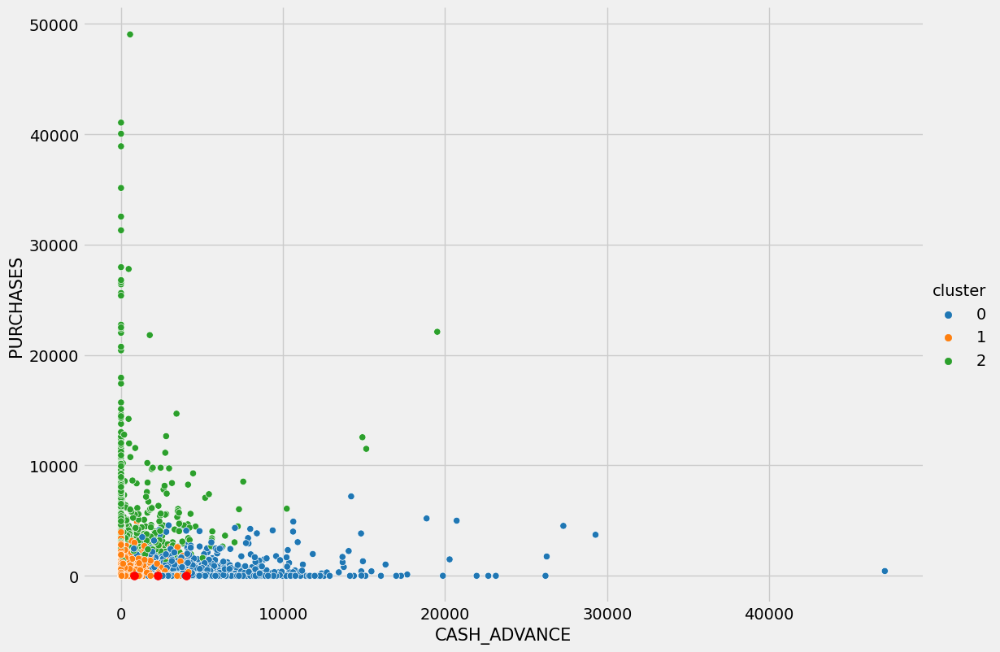

In [95]:
centroids = kmeans.cluster_centers_
centroids = scaler.inverse_transform(centroids)
print(centroids)


sns.relplot(data = df_cluster_with_kmean ,x='CASH_ADVANCE' , y  ='PURCHASES', hue='cluster', palette='tab10' ,kind='scatter', height=8.27, aspect = 11.7/8.27)
plt.scatter(centroids[:, 0], centroids[:,1], c='red', s=50)
plt.xlabel("CASH_ADVANCE",fontsize=15)
plt.ylabel("PURCHASES",fontsize=15)

### visualizing clusters on original data
#تجسم خوشه ها بر روی داده های اصلی

[[3.45950505e+03 9.46724692e-01 1.59957463e+03 9.95575645e+02
  6.04322800e+02 2.15068567e+03 5.42336193e-01 3.18129818e-01
  3.89146486e-01 2.14576848e-01 5.85391226e+00 2.24337404e+01
  9.04866782e+03 2.96161549e+03 1.59656244e+03 1.33819784e-01
  1.17372230e+01]
 [8.81480399e+02 8.76420436e-01 6.22436620e+02 3.23163177e+02
  2.99582954e+02 5.02024330e+02 4.74368635e-01 1.58352379e-01
  3.56765199e-01 1.08715102e-01 2.29987294e+00 1.09626747e+01
  2.76931760e+03 1.03821911e+03 5.73070513e+02 1.64610694e-01
  1.14569568e+01]
 [4.87916214e+03 9.17611326e-01 1.08536936e+04 7.65950163e+03
  3.19436248e+03 5.19215982e+03 7.57564000e-01 6.03537062e-01
  6.08805682e-01 2.28296233e-01 9.27131783e+00 8.68604651e+01
  1.24848837e+04 1.80309572e+04 2.52779839e+03 3.37066930e-01
  1.18372093e+01]]


Text(52.16122685185185, 0.5, 'PURCHASES')

<Figure size 1500x800 with 0 Axes>

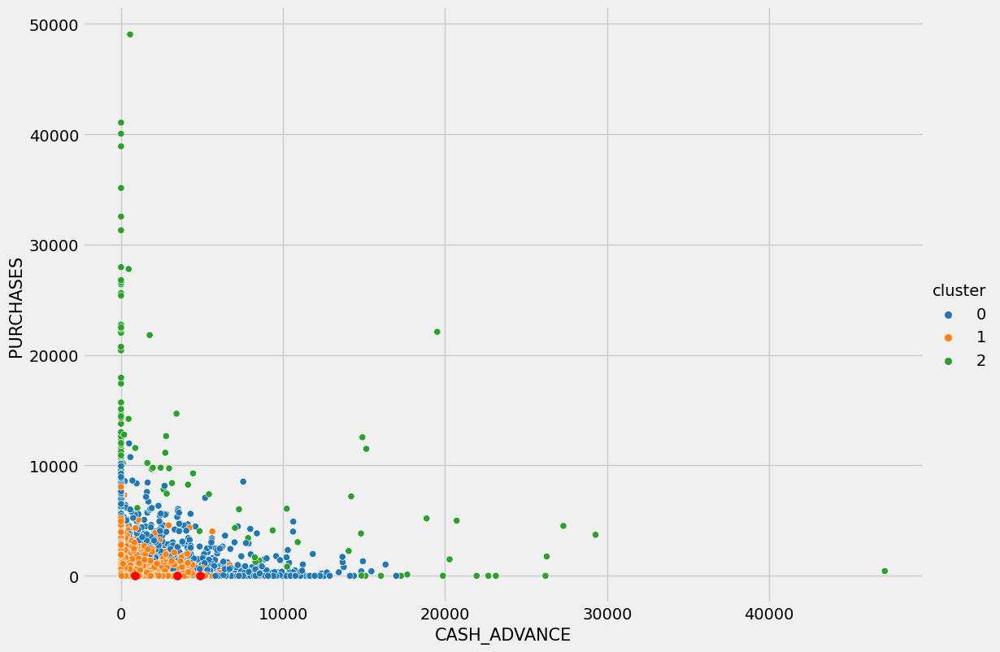

In [96]:
kmeans = KMeans(n_clusters=3,init= "random", random_state = 1).fit(df)
centroids = kmeans.cluster_centers_
print(centroids)
plt.figure(figsize=(15,8))

df_kmean = df.copy()
df_kmean['cluster'] = kmeans.labels_
sns.relplot(data = df_kmean ,x='CASH_ADVANCE' , y  ='PURCHASES', hue='cluster', palette='tab10' ,kind='scatter', height=8.27, aspect = 11.7/8.27)
plt.scatter(centroids[:, 0], centroids[:,1], c='red', s=50)
plt.xlabel("CASH_ADVANCE",fontsize=15)
plt.ylabel("PURCHASES",fontsize=15)

In [97]:
# agar tedade cluster = 3 bashad bayad 3ta rang dar data dashte bashim.
# inja umadam cluster = 4 gharar dadam didam k centroid ha 2tashun ruye ham miyoftand,
# pas un 2ta ra mitavan ye centroid dar nazar gereft va cluster ha ham 3ta dar nazar begirim.

In [98]:
# dataye unseen jadidi k mizarim, faselash az centroidha barresi mishavad.
# l1 < L2 < L3  ,pas dataye jadid dar nahayat be ma L1 ra neshan midahad va dar clustere L1 gharar migirad.

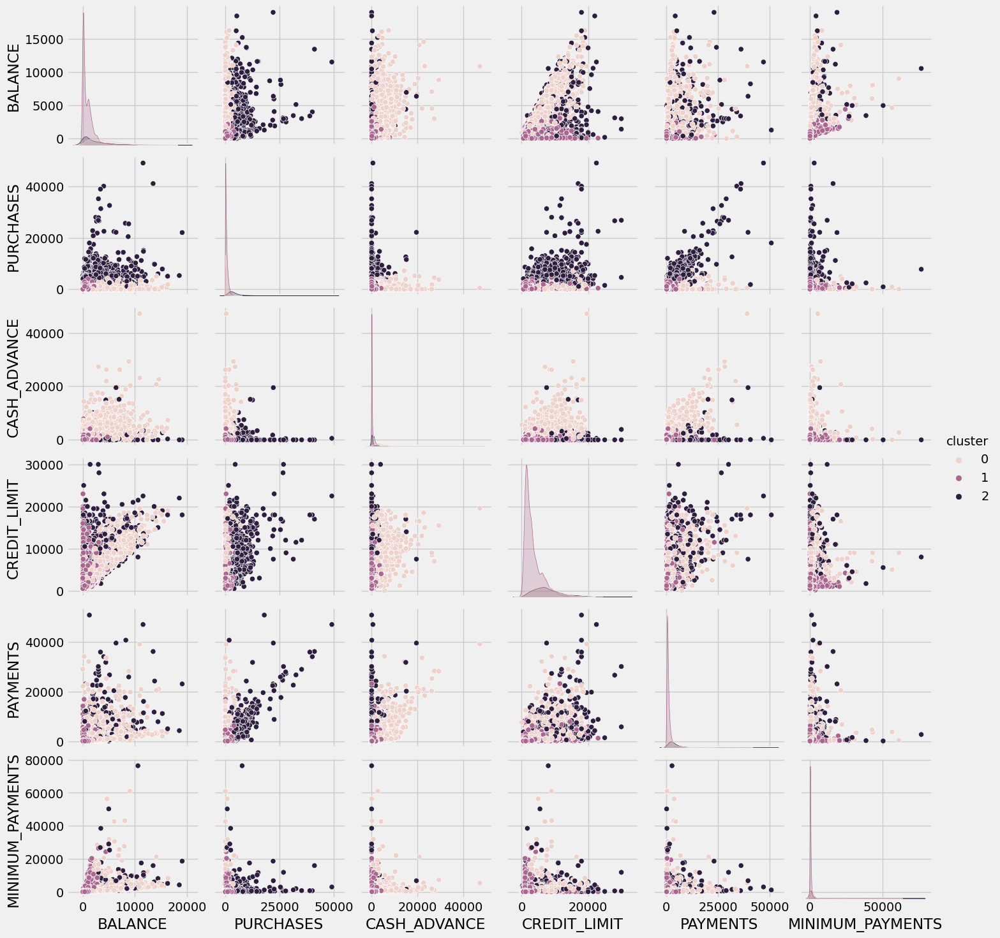

In [99]:
#در این قسمت چندین فیجر که پیوسته هستند را انتخاب می کنم تا نحوه ی کلاستربندی آنها را نیز مشاهده کنم
best_cols = ["BALANCE", "PURCHASES", "CASH_ADVANCE","CREDIT_LIMIT", "PAYMENTS", "MINIMUM_PAYMENTS","cluster"]
sns.pairplot( df_cluster_with_kmean[ best_cols ], hue="cluster")

#
clusteval library ( i just want to inroduce this library)
clusteval is Python package for unsupervised cluster evaluation. Three evaluation methods are implemented that can be used to evalute clusterings; silhouette, dbindex, and derivative
#Four clustering methods can be used: agglomerative, kmeans, dbscan and hdbscan.


In [100]:
pip install clusteval

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 1.1 MB/s eta 0:00:00


[clusteval] >INFO> Saving data in memory.
[clusteval] >INFO> Fit with method=[agglomerative], metric=[euclidean], linkage=[ward]
[clusteval] >INFO> Evaluate using silhouette.
[clusteval] >INFO: 100%|██████████| 23/23 [00:24<00:00,  1.08s/it]
[clusteval] >INFO> Compute dendrogram threshold.
[clusteval] >INFO> Optimal number clusters detected: [10].
[clusteval] >INFO> Fin.


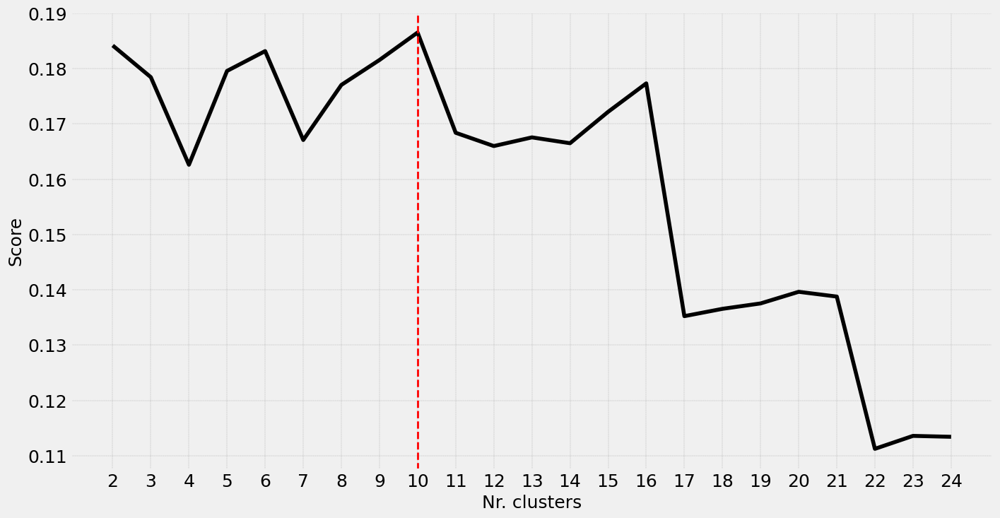

[clusteval] >INFO> Coordinates (x, y) are set based on the first two features.
[clusteval] >INFO> Set alpha based on density because of the parameter: [opaque]
[clusteval] >INFO> Create scatterplot


(<Figure size 2500x1500 with 1 Axes>, <Axes: xlabel='x-axis', ylabel='y-axis'>)

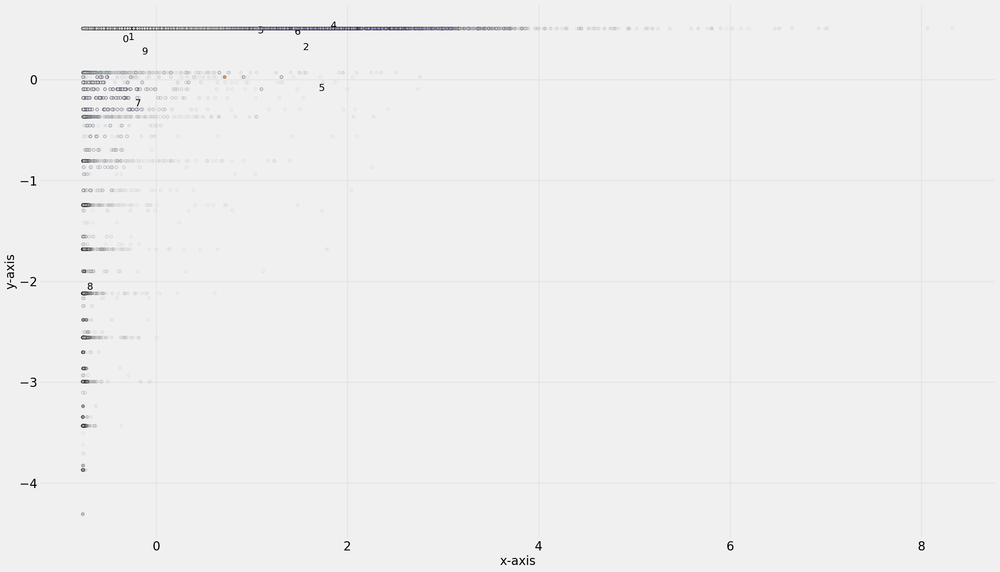

In [101]:
from clusteval import clusteval
ce = clusteval(evaluate = 'silhouette')
ce.fit(scaled_features)
ce.plot()
ce.scatter(scaled_features)

#
#
## K-Medoids(a custring algorithm, more robust to outliers)
The k-medoids algorithm is a clustering algorithm related to the k-means algorithm.   

K-Means selects the average of a cluster’s points as its centre (which may or may not be one of the data points) while the k-medoids algorithm always picks the actual data points from the clusters as their centres

average of the data points is a measure that gets highly affected by the outlier points. So in K-Means algorithm, if the data has outliers, the centroid may get shifted to a wrong position and caused incorrect clustering. On the contrary, a medoid in the K-Medoids algorithm is the most central element of the cluster, such that its distance from other points is minimum. Since medoids do not get influenced by outliers, the K-Medoids algorithm is more robust to outliers and noise than K-Means algorithm.The following figure explains how mean’s and medoid’s positions can vary in the presence of an outlier:
![image.png](attachment:image.png)
Both the k-means and k-medoids algorithms are partitional (breaking the dataset up into groups). K-means attempts to minimize the total squared error, while k-medoids minimizes the sum of dissimilarities between points labeled to be in a cluster and a point designated as the center of that cluster.

K-Medoids (also called as Partitioning Around Medoid) algorithm was proposed in 1987 by Kaufman and Rousseeuw. A medoid can be defined as the point in the cluster, whose dissimilarities with all the other points in the cluster is minimum.

The dissimilarity of the medoid(Ci) and object(Pi) is calculated by using E = |Pi - Ci|

The cost in K-Medoids algorithm is given as:![image-3.png](attachment:image-3.png)



Algorithm:

1. Initialize: select k random points out of the n data points as the medoids.
2. Associate each data point to the closest medoid by using any common distance metric methods.
3. While the cost decreases:
    
    For each medoid m, for each data o point which is not a medoid:
    1. Swap m and o, associate each data point to the closest medoid, recompute the cost.
    2. If the total cost is more than that in the previous step, undo the swap.

In [102]:
#کی_مینز میانگین نقاط یک خوشه را به عنوان مرکز آن انتخاب می کند (که ممکن است یکی از نقاط داده باشد یا نباشد)
#در حالی که الگوریتم کی_مدوید همیشه نقاط داده واقعی را از خوشه ها به عنوان مراکز آنها انتخاب می کند
#میانگین نقاط داده معیاری است که به شدت تحت تأثیر نقاط پرت قرار می گیرد
#بنابراین در الگوریتم کی_مینز، اگر داده ها دارای نقاط پرت باشند، مرکز ممکن است به موقعیت اشتباهی منتقل شود و باعث خوشه بندی نادرست شود
#در مقابل، مدوید در الگوریتم کی_مدوید مرکزی ترین عنصر خوشه است، به طوری که فاصله آن از سایر نقاط حداقل است
#از آنجایی که کی_مدوید تحت تأثیر عوامل پرت قرار نمیگیرد، الگوریتم کی_مدوید نسبت به الگوریتم کی_مینز در برابر نویزها و نویزها قویتر است
#هر دو الگوریتم کی_مینز و کی_مدوید پارتیشنی هستند (تقسیم مجموعه داده ها به گروه ها)
#کی_مینز تلاش می کند تا خطای مجذور کل را به حداقل برساند
#در حالی که کی_مدوید مجموع تفاوت های بین نقاط برچسب گذاری شده در یک خوشه و نقطه تعیین شده به عنوان مرکز آن خوشه را به حداقل می رساند
#مدوید را می توان به عنوان نقطه ای در خوشه تعریف کرد که تفاوت آن با سایر نقاط خوشه حداقل است

In [103]:
!pip install scikit-learn-extra

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 20.0 MB/s eta 0:00:00


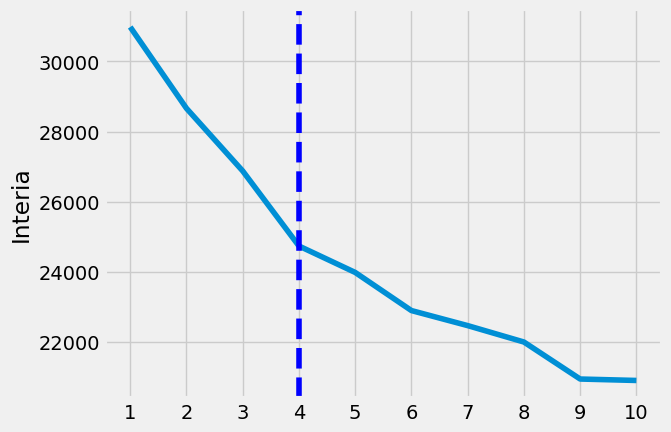

In [104]:
from sklearn_extra.cluster import KMedoids
List = []
for k in range(1,11):#this range is optional
    kmedoids = KMedoids(n_clusters=k,init= "random", random_state =5 )
    kmedoids.fit(scaled_features)
    List.append( kmedoids.inertia_)

from kneed import KneeLocator
kl = KneeLocator(range(1,11), List, curve='convex', direction='decreasing')
kl.elbow
plt.style.use("fivethirtyeight")
plt.plot(range(1,11),List)
plt.xticks(range(1,11))
plt.ylabel("Interia")
plt.axvline(x=kl.elbow, color='b', label='axvline - full height', ls='--')
plt.show()

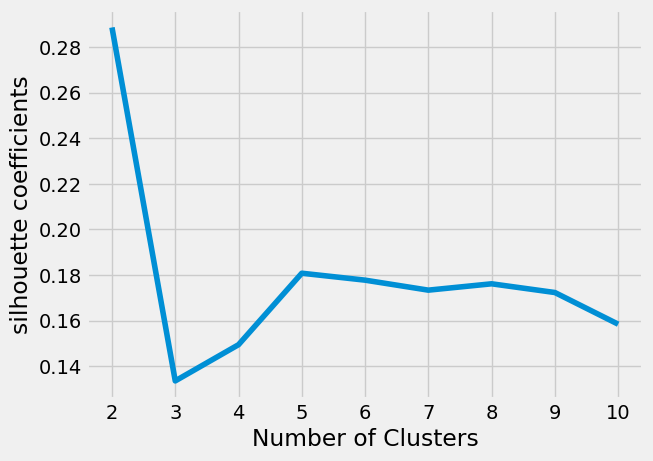

In [105]:
from sklearn_extra.cluster import KMedoids
silhouette_coefficients = []
for k in range (2,11):
    kmedoids = KMedoids(n_clusters=k,init= "random", random_state = 5)
    kmedoids.fit(scaled_features)
    score = silhouette_score(scaled_features, kmedoids.labels_)
    silhouette_coefficients.append(score)

plt.style.use("fivethirtyeight")
plt.plot(range(2,11), silhouette_coefficients)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show()

In [106]:
max(silhouette_coefficients)

0.2886451888261335

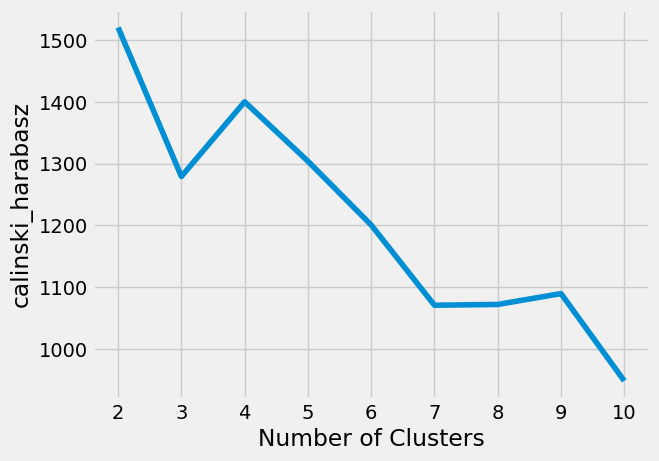

In [107]:
from sklearn import metrics
from sklearn.metrics import calinski_harabasz_score
calinski_harabaz = []
for k in range (2,11):
    kmedoids = KMedoids(n_clusters=k,init= "random", random_state = 5)
    kmedoids.fit(scaled_features)
    metrics.calinski_harabasz_score(scaled_features, kmedoids.labels_)
    calinski_harabaz.append(metrics.calinski_harabasz_score(scaled_features, kmedoids.labels_))
plt.style.use("fivethirtyeight")
plt.plot(range(2,11), calinski_harabaz)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("calinski_harabasz")
plt.show()

In [108]:
max(calinski_harabaz)

1520.4301060768387

In [109]:
#pas k=2 ba silhouette = 0.2886451888261335 behtarin cluster baraye modelsazi k-medoids ast.

In [110]:
# view normal cluster centers
kmediods = KMedoids(n_clusters=2,init= "random", random_state = 5)
kmediods.fit(scaled_features)
labels = kmediods.labels_
cluster_centers = pd.DataFrame(data = kmediods.cluster_centers_, columns = [df.columns])
cluster_centers

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.029901,0.505405,1.304550,1.233272,0.817208,-0.468655,1.256077,1.813419,0.957570,-0.681953,-0.479437,0.792993,0.403907,0.550734,-0.198486,0.382859,0.355181
1,-0.437736,0.067679,-0.337536,-0.273067,-0.296387,-0.335876,0.009969,-0.408536,0.120197,0.144032,-0.190089,-0.319045,-0.279334,-0.070835,-0.290617,-0.200178,0.355181


In [111]:
# viewing real centers
cluster_centers = scaler.inverse_transform(cluster_centers)
cluster_centers = pd.DataFrame(data = cluster_centers, columns = [df.columns])
cluster_centers

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,1538.569369,1.000000,3852.37,2681.99,1170.38,0.000000,1.0,0.750000,0.750000,0.000000,0.0,35.0,6000.0,3386.915692,393.411779,0.272727,12.0
1,683.971012,0.909091,294.00,145.00,149.00,281.669381,0.5,0.083333,0.416667,0.166667,2.0,7.0,3500.0,1578.374440,174.836120,0.100000,12.0


In [112]:
#adding cluster column to dataframe
df_cluster_with_kmediods = pd.concat([df, pd.DataFrame({'cluster': labels})], axis = 1)
df_cluster_with_kmediods

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,1
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6,1
8632,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,1
8633,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,1
8634,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,1


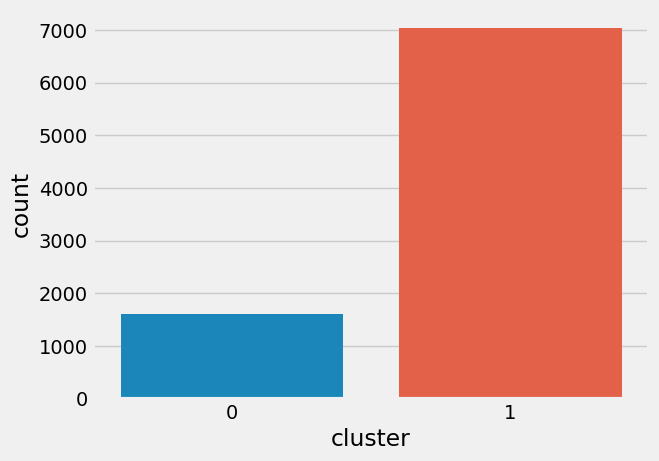

In [113]:
# counting number of clusters
sns.countplot(x=df_cluster_with_kmediods.cluster)
plt.show()

#so most o people are grouped in cluster 0

#interpreting part for( clustering with kmediods)

In [114]:
cluster_report(df,df_cluster_with_kmediods.cluster,min_samples_leaf=20,pruning_level=0.05)

,class_name,instance_count,rule_list
1,0,1607,[0.7905405405405406] (PURCHASES > 1537.1200561523438)
0,1,7029,[0.954337899543379] (PURCHASES <= 1537.1200561523438)


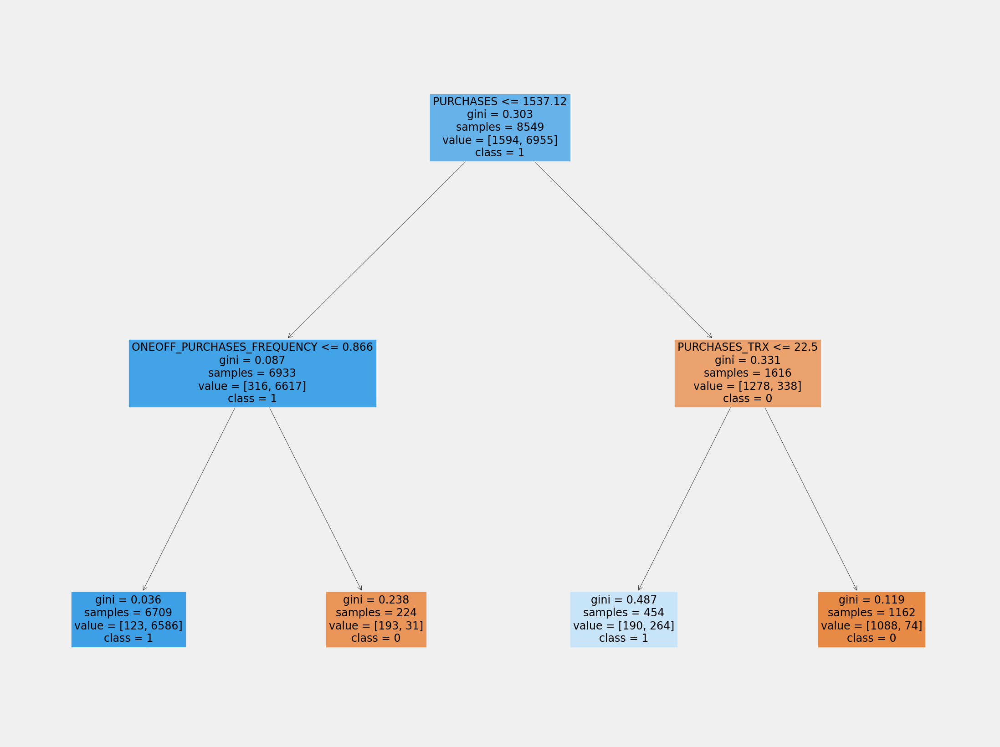

In [115]:
##visualization desision tree to find features that efect on decision
from sklearn import tree
from sklearn.model_selection  import train_test_split
X = df_cluster_with_kmediods. drop('cluster', axis =1)
y = df_cluster_with_kmediods['cluster']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.01,random_state=1)
clf = DecisionTreeClassifier(max_depth=2)
clf = clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
feature_names = ['BALANCE','BALANCE_FREQUENCY','PURCHASES','ONEOFF_PURCHASES','INSTALLMENTS_PURCHASES','CASH_ADVANCE','PURCHASES_FREQUENCY',
                'ONEOFF_PURCHASES_FREQUENCY','PURCHASES_INSTALLMENTS_FREQUENCY','CASH_ADVANCE_FREQUENCY','CASH_ADVANCE_TRX','PURCHASES_TRX',
                'CREDIT_LIMIT','PAYMENTS','MINIMUM_PAYMENTS','PRC_FULL_PAYMENT','TENURE']
target_names =['0','1']
fig = plt.figure(figsize=(25,20))
plot = tree.plot_tree(clf,
                     feature_names = feature_names,
                     class_names = target_names,
                     filled = True)
fig.savefig("Tree1.png")

### تفسیر کلاسها با توجه به درخت تصمیم و جدولی که قبل از درخت تصمیم نشان دادیم
افراد بیشتر در کلاس دو طبقه بندی می شوند

class 0:ONEOFF_PURCHASES_FREQUENCY <= 0.866 and PURCHASES <= 1537

کلاس صفر شامل 7029 نفر است که این افراد مقدار خریدهای انجام شده از حساب کمتر از 1537  است و تعداد دفعات خرید یکباره
 از 0.866 کمتر است

class 1:(PURCHASES_TRX <= 22.5) and (PURCHASES > 1537)

کلاس یک شامل 1607 نفر است که این افراد مقدار خریدهای انجام شده از حساب بیشتر از1664 است و همچنین تعداد تراکنشهای خرید کمتر از 22.5 است



### visualizing clusters by inversing results

[[1.53856937e+03 1.00000000e+00 3.85237000e+03 2.68199000e+03
  1.17038000e+03 0.00000000e+00 1.00000000e+00 7.50000000e-01
  7.50000000e-01 0.00000000e+00 0.00000000e+00 3.50000000e+01
  6.00000000e+03 3.38691569e+03 3.93411779e+02 2.72727000e-01
  1.20000000e+01]
 [6.83971012e+02 9.09091000e-01 2.94000000e+02 1.45000000e+02
  1.49000000e+02 2.81669381e+02 5.00000000e-01 8.33330000e-02
  4.16667000e-01 1.66667000e-01 2.00000000e+00 7.00000000e+00
  3.50000000e+03 1.57837444e+03 1.74836120e+02 1.00000000e-01
  1.20000000e+01]]


Text(50.44508101851852, 0.5, 'PURCHASES_TRX')

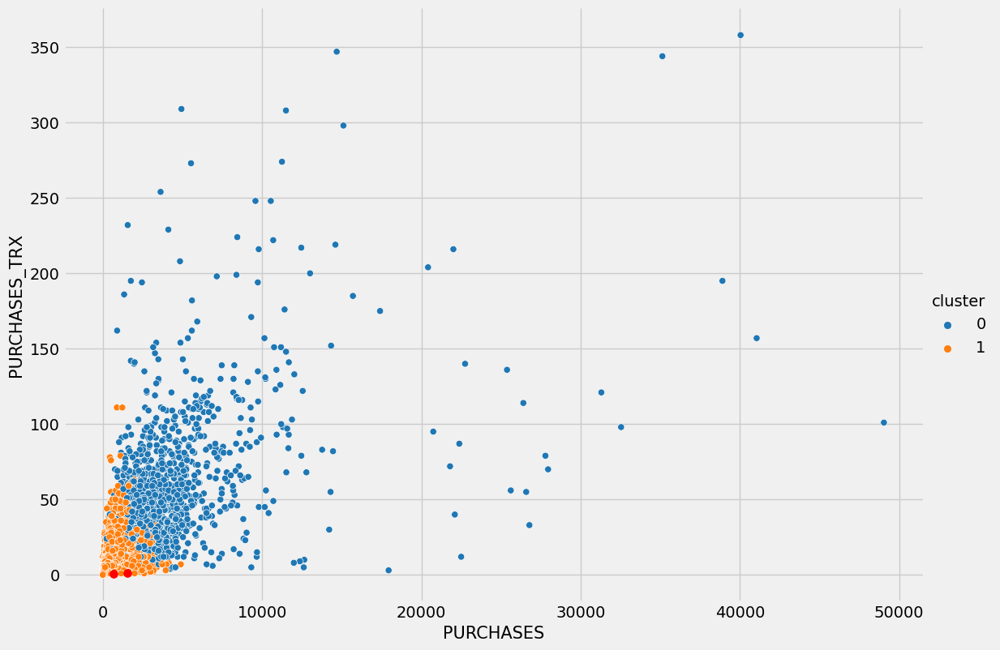

In [116]:
centroids = kmediods.cluster_centers_
centroids = scaler.inverse_transform(centroids)
print(centroids)

sns.relplot(data = df_cluster_with_kmediods,x='PURCHASES' , y  ='PURCHASES_TRX', hue='cluster', palette='tab10' ,kind='scatter', height=8.27, aspect = 11.7/8.27)
plt.scatter(centroids[:, 0], centroids[:,1], c='red', s=50)
plt.xlabel("PURCHASES",fontsize=15)
plt.ylabel("PURCHASES_TRX",fontsize=15)


### visualizing clusters on original data

In [117]:
df_kmedoid = df.copy()

[[2.99037059e+03 1.00000000e+00 1.36800000e+03 2.08000000e+02
  1.16000000e+03 1.43623824e+03 1.00000000e+00 8.33330000e-02
  1.00000000e+00 5.83333000e-01 1.40000000e+01 2.20000000e+01
  8.00000000e+03 1.68074827e+03 7.91063136e+02 0.00000000e+00
  1.20000000e+01]
 [9.69139152e+02 1.00000000e+00 2.69340000e+02 7.80000000e+01
  1.91340000e+02 7.83126600e+01 6.66667000e-01 8.33330000e-02
  5.83333000e-01 8.33330000e-02 1.00000000e+00 1.10000000e+01
  2.00000000e+03 6.41186755e+02 3.83080045e+02 0.00000000e+00
  1.20000000e+01]]


Text(50.44508101851852, 0.5, 'PURCHASES_TRX')

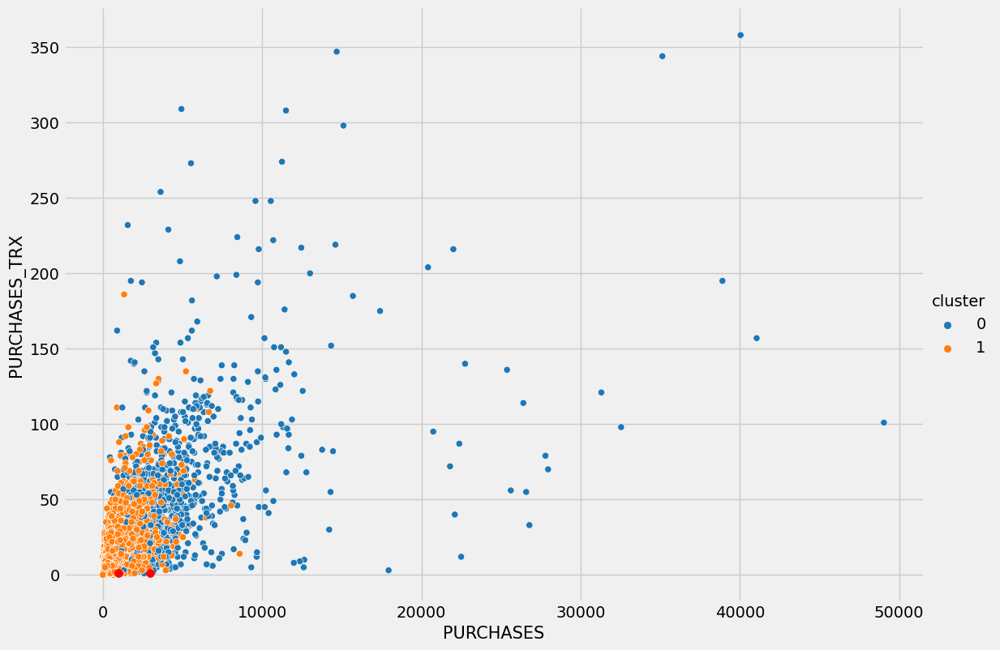

In [118]:
kmediods = KMedoids(n_clusters=2,init= "random", random_state = 5).fit(df)
centroids = kmediods.cluster_centers_
df_kmedoid['cluster'] = kmediods.labels_
print(centroids)

sns.relplot(data = df_kmedoid , x='PURCHASES' , y  ='PURCHASES_TRX', hue='cluster', palette='tab10' ,kind='scatter', height=8.27, aspect = 11.7/8.27)
plt.scatter(centroids[:, 0], centroids[:,1], c='red', s=50)
plt.xlabel("PURCHASES",fontsize=15)
plt.ylabel("PURCHASES_TRX",fontsize=15)

یک تفاوت کوچک در دو شکل بالا مشاهده می شود
به نظر می آید روش اول بهتر داده ها را جدا می کندل

#
#
## Gaussian mixture model
As the name implies, a Gaussian mixture model involves the mixture of multiple Gaussian distributions.
![image-2.png](attachment:image-2.png)
#### comparison with k-means:
First , k-means does not account for variance. By variance, we are referring to the width of the bell shape curve.

k-means groups data points using distance from the cluster centroid but gmm uses probabilistic assignment of data points to clusters.Each cluster is described by a separate gaussian distribution. So k-means performs hard classification whereas the Gaussian mixtureperforms soft classification, by providing probabilities a given data point belongs to each of the possible clusters.


In calling the predict function, the model will assign every data point to one of the clusters.

On the other hand, we can call the predict_proba function to return the probabilities that a data point belongs to each of the K clusters.

In [119]:
#یک مدل مخلوط گاوسی شامل مخلوطی از چندین توزیع گاوسی است
#مقایسه با کی-مینز:
#اول اینکه، کی-مینز واریانس را در نظر نمی گیرد. منظور ما از واریانس عرض منحنی شکل زنگ است
#کی-مینز نقاط داده را با استفاده از فاصله از مرکز خوشه گروه بندی میکند
#اما جی-ام-ام(گوسین میکسچر مدل) از تخصیص احتمالی نقاط داده به خوشه ها استفاده میکند
#هر خوشه با توزیع گاوسی جداگانه توصیف میشود
#بنابراین کی-مینز طبقه بندی سخت را انجام می دهد در حالی که مخلوط گاوسی طبقه بندی نرم را انجام می دهد
#با ارائه احتمالات، یک نقطه داده معین، متعلق به هر یک از خوشه های ممکن است
#در فراخوانی تابع پیش بینی، مدل هر نقطه داده را به یکی از خوشه ها اختصاص می دهد
#از سوی دیگر، میتوانیم تابع "پرِدیکت-پِرُبا" را فراخوانی کنیم تا احتمالات مربوط به یک نقطه داده به هر یک از خوشه های "کا" را برگردانیم

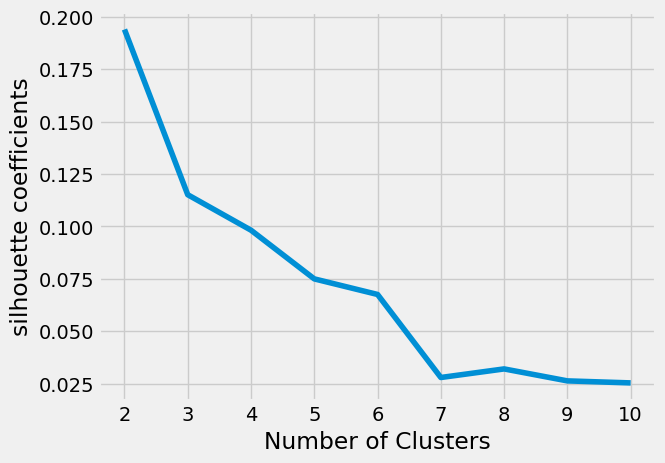

In [120]:
from sklearn.mixture import GaussianMixture
sil_gmm = []
for k in range(2,11):#this range is optional
    gmm = GaussianMixture(n_components=k, random_state=1 )#each gaussian in your mixture is one component
    gmm.fit(scaled_features)
    score = silhouette_score(scaled_features, gmm.predict(scaled_features),metric='euclidean',random_state=5)
    sil_gmm.append(score)
plt.style.use("fivethirtyeight")
plt.plot(range(2,11), sil_gmm)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show()

In [121]:
max(sil_gmm)

0.19396703417813158

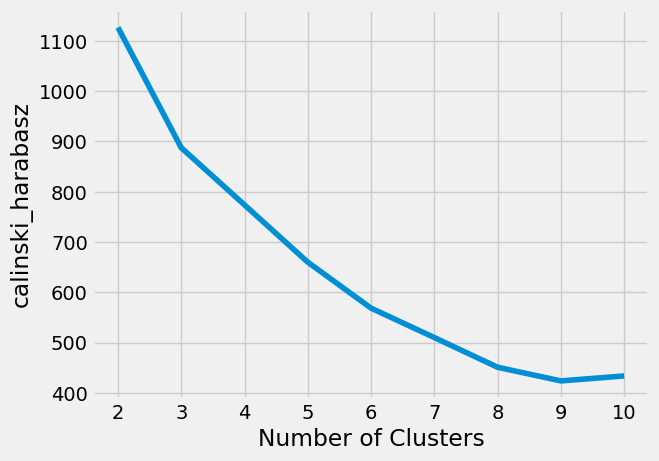

In [122]:
from sklearn import metrics
from sklearn.metrics import calinski_harabasz_score
calinski_harabasz = []
for k in range (2,11):
    gmm = GaussianMixture(n_components=k, random_state=1 )#each gaussian in your mixture is one component
    gmm.fit(scaled_features)
    metrics.calinski_harabasz_score(scaled_features, gmm.predict(scaled_features))
    calinski_harabasz.append(metrics.calinski_harabasz_score(scaled_features, gmm.predict(scaled_features)))
plt.style.use("fivethirtyeight")
plt.plot(range(2,11), calinski_harabasz)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("calinski_harabasz")
plt.show()

In [123]:
max(calinski_harabasz)

1126.6074226180508

#### So 2 cluster with silhouette=0.18353676992495227, is the best for gaussian mixture modeling

In [124]:
# In gaussian method, we don't have centers, we have mean for each cluster
# view normal cordinates means of clusters(in gaussian we can show mean, instead center)
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=2, random_state=1 )
gmm.fit(scaled_features)
labels = gmm.predict(scaled_features)
cluster_means = pd.DataFrame(data = gmm.means_, columns = [df.columns])
cluster_means

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.343339,0.310932,0.632536,0.522483,0.535672,0.146721,0.669942,0.808218,0.462140,-0.070432,0.013304,0.714165,0.475124,0.544817,0.333071,0.141668,0.200428
1,-0.181042,-0.163954,-0.333536,-0.275505,-0.282459,-0.077366,-0.353260,-0.426173,-0.243686,0.037139,-0.007015,-0.376579,-0.250532,-0.287282,-0.175628,-0.074701,-0.105685


In [125]:
# view real cordinates means of clusters(in gaussian we can show mean, instead center)
cluster_means = scaler.inverse_transform(cluster_means)
cluster_means = pd.DataFrame(data = cluster_means, columns = [df.columns])
cluster_means

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,2320.674499,0.959611,2396.129367,1484.872746,912.157698,1305.419684,0.764814,0.448403,0.552784,0.123393,3.405880,33.015203,6260.583245,3369.701410,1654.491120,0.201273,11.797133
1,1221.859758,0.860984,302.667366,140.893353,161.774013,830.056755,0.354255,0.078041,0.271816,0.145098,3.265427,5.551356,3605.385637,948.591264,447.640478,0.137173,11.395847


In [126]:
#adding cluster column to dataframe
df_cluster_with_gmm = pd.concat([df, pd.DataFrame({'cluster': labels})], axis = 1)
df_cluster_with_gmm

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,1
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6,1
8632,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,1
8633,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,1
8634,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,1


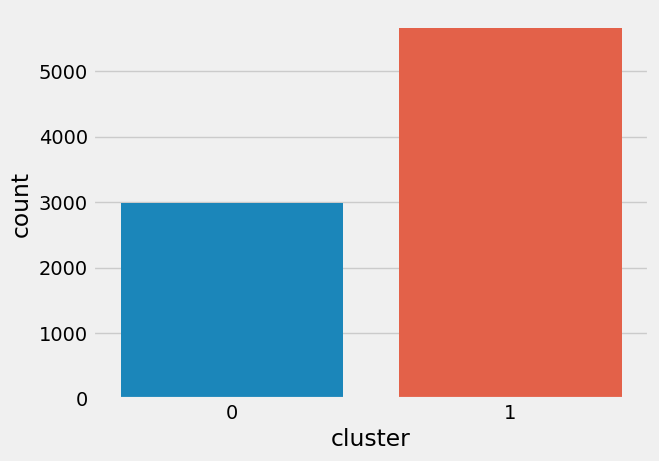

In [127]:
# counting number of clusters
sns.countplot(x=df_cluster_with_gmm.cluster)
plt.show()

#### cluster 0 is almost two times bigger than cluster 1

In [128]:
# interpreting clustering with gaussin model
cluster_report(df,df_cluster_with_gmm.cluster,min_samples_leaf=20,pruning_level=0.05)

,class_name,instance_count,rule_list
1,0,2982,[0.9374045801526718] (PURCHASES > 1270.85498046875)
0,1,5654,[0.8291110777994304] (PURCHASES <= 1270.85498046875)


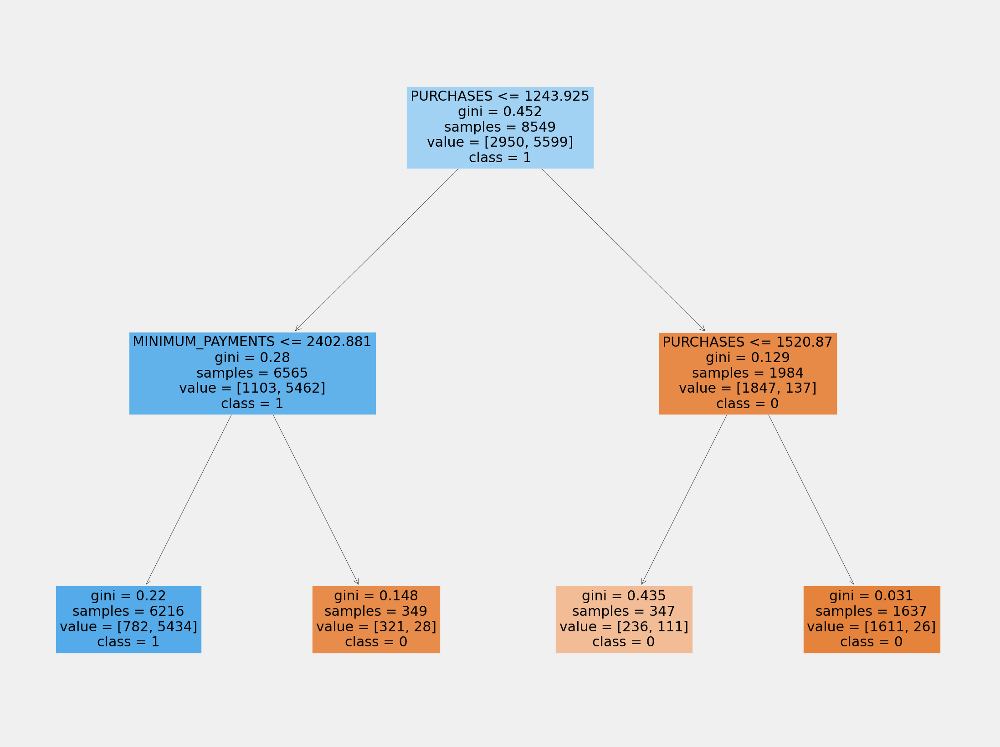

In [129]:
##visualization desision tree to find features that efect on decision
from sklearn import tree
from sklearn.model_selection  import train_test_split
X = df_cluster_with_gmm. drop('cluster', axis =1)
y = df_cluster_with_gmm['cluster']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.01,random_state=1)
clf = DecisionTreeClassifier(max_depth=2)
clf = clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
feature_names = ['BALANCE','BALANCE_FREQUENCY','PURCHASES','ONEOFF_PURCHASES','INSTALLMENTS_PURCHASES','CASH_ADVANCE','PURCHASES_FREQUENCY',
                'ONEOFF_PURCHASES_FREQUENCY','PURCHASES_INSTALLMENTS_FREQUENCY','CASH_ADVANCE_FREQUENCY','CASH_ADVANCE_TRX','PURCHASES_TRX',
                'CREDIT_LIMIT','PAYMENTS','MINIMUM_PAYMENTS','PRC_FULL_PAYMENT','TENURE']
target_names =['0','1']
fig = plt.figure(figsize=(25,20))
plot = tree.plot_tree(clf,
                     feature_names = feature_names,
                     class_names = target_names,
                     filled = True)
fig.savefig("Tree1.png")

### visualizing clusters by inversing results

cluster means:
 [[2.32067450e+03 9.59611042e-01 2.39612937e+03 1.48487275e+03
  9.12157698e+02 1.30541968e+03 7.64813769e-01 4.48403459e-01
  5.52784326e-01 1.23392522e-01 3.40587966e+00 3.30152032e+01
  6.26058325e+03 3.36970141e+03 1.65449112e+03 2.01273340e-01
  1.17971331e+01]
 [1.22185976e+03 8.60984281e-01 3.02667366e+02 1.40893353e+02
  1.61774013e+02 8.30056755e+02 3.54254740e-01 7.80414928e-02
  2.71816303e-01 1.45098012e-01 3.26542743e+00 5.55135617e+00
  3.60538564e+03 9.48591264e+02 4.47640478e+02 1.37173031e-01
  1.13958472e+01]]


Text(50.44508101851852, 0.5, 'PURCHASES_TRX')

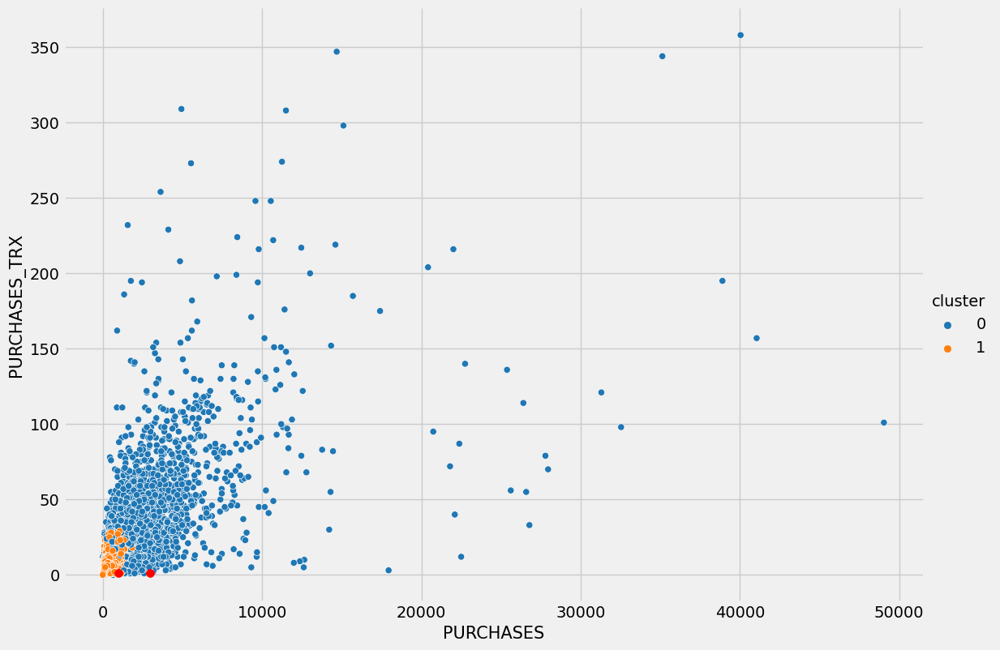

In [130]:
cluster_means = gmm.means_#for gaussian, we don't have centers,we have mean
cluster_means = scaler.inverse_transform(cluster_means)
print("cluster means:\n",cluster_means)

sns.relplot(data = df_cluster_with_gmm,x='PURCHASES' , y  ='PURCHASES_TRX', hue='cluster', palette='tab10' ,kind='scatter', height=8.27, aspect = 11.7/8.27)
plt.scatter(centroids[:, 0], centroids[:,1], c='red', s=50)
plt.xlabel("PURCHASES",fontsize=15)
plt.ylabel("PURCHASES_TRX",fontsize=15)

به نظرم روش بالایی که نتایج نرمال را اینورس می کنیم ،جواب صحیحتری دارد چون نقاط را بهتر جدا کرده است



```
# This is formatted as code
```

### visualising without normalize

cluster means without normalize:
 [[3.60152149e+03 9.60904694e-01 3.26585505e+03 2.00300126e+03
  1.26515045e+03 2.68247577e+03 6.29572119e-01 3.33868961e-01
  5.18081978e-01 2.27337311e-01 8.55188715e+00 4.13901512e+01
  7.23016827e+03 5.41442492e+03 3.26833255e+03 1.54980713e-01
  1.17464576e+01]
 [1.28782050e+03 8.84714734e-01 6.74407014e+02 3.85848612e+02
  2.88558402e+02 7.29654395e+02 4.75072060e-01 1.85860067e-01
  3.45434188e-01 1.23544914e-01 2.49323899e+00 1.09036584e+01
  4.09779230e+03 1.21574180e+03 4.87644396e+02 1.59980934e-01
  1.15011645e+01]]


Text(50.44508101851852, 0.5, 'PURCHASES_TRX')

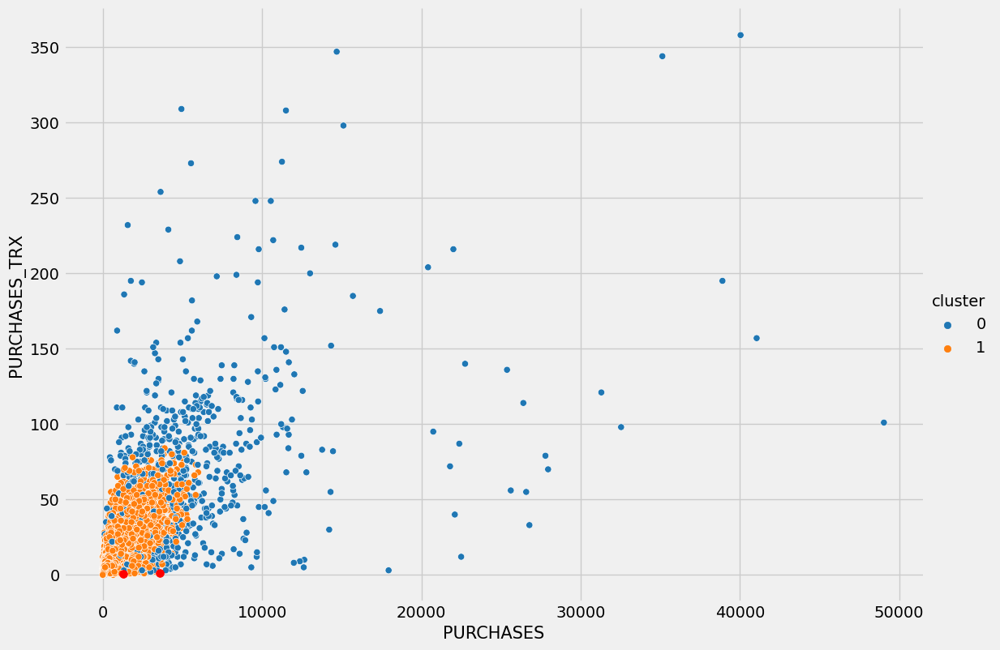

In [131]:
df_gmm = df.copy()
gmm = GaussianMixture(n_components=2, random_state=1).fit(df)
cluster_means = gmm.means_
df_gmm['cluster'] = gmm.predict(df)
print("cluster means without normalize:\n",cluster_means)

sns.relplot(data = df_gmm , x='PURCHASES' , y  ='PURCHASES_TRX', hue='cluster', palette='tab10' ,kind='scatter', height=8.27, aspect = 11.7/8.27)
plt.scatter(cluster_means[:, 0], cluster_means[:,1], c='red', s=50)
plt.xlabel("PURCHASES",fontsize=15)
plt.ylabel("PURCHASES_TRX",fontsize=15)



به نظرم این روش نمایش نقاط را به خوبی جدا نکرده است

# Hierarchical Clustering(merging or spiliting clusters)

#یک روش خوشه بندی سلسله مراتبی از طریق گروه‌بندی داده‌ها در درختی از خوشه ها کار می کند

#خوشه بندی سلسله مراتبی با در نظر گرفتن هر نقطه داده به عنوان یک خوشه جداگانه آغاز می شود. سپس چندین بار مراحل بعدی را اجرا می کند

#1.دو خوشه را که می توانند به هم نزدیکتر باشند شناسایی کنید

#2.حداکثر 2 خوشه قابل مقایسه را ادغام کنید. باید این مراحل را تا زمانی که همه خوشه ها با هم ادغام شوند ادامه دهیم

#در خوشه بندی سلسله مراتبی، هدف تولید یک سری سلسله مراتبی از خوشه های تودرتو است

#نموداری به نام دندروگرام (دندروگرام نمودار درخت مانندی است که توالی ادغام ها یا تقسیم ها را آمار می دهد) به صورت گرافیکی این سلسله مراتب را نشان می دهد

#یک درخت وارونه است که ترتیب ادغام عوامل (نمای پایین به بالا) یا شکسته شدن خوشه ها را توصیف می کند. بالا (نمایش از بالا به پایین)

#دو روش اصلی برای ایجاد خوشه بندی سلسله مراتبی است:

#1.	Agglomerative            2.Divisive

#1.Agglomerative:خوشه بندی سلسله مراتبی تجمعی

#ابتدا هر نقطه داده را به عنوان یک کلاستر در نظر بگیرید و در هر مرحله، نزدیکترین جفت های خوشه را ادغام کنید. (روش از پایین به بالا است)

#ابتدا، هر مجموعه داده به عنوان یک موجودیت یا خوشه فردی در نظر گرفته می شود.در هر تکرار، خوشه ها با خوشه های مختلف ادغام می شوند تا زمانی که یک خوشه تشکیل شود

#الگوریتم برای خوشه بندی سلسله مراتبی تجمعی به شرح زیر است:

#الف. شباهت یک خوشه با همه خوشه های دیگر را محاسبه کنید (محاسبه ماتریس مجاورت)

#ب. هر نقطه داده را به عنوان یک خوشه مجزا در نظر بگیرید

#پ. خوشه هایی را که بسیار شبیه یا نزدیک به یکدیگر هستند ادغام کنید

#ت. ماتریس مجاورت را برای هر خوشه دوباره محاسبه کنید

#ج. مراحل 3 و 4 را تکرار کنید تا تنها یک خوشه باقی بماند

#فرض کنید شش نقطه داده A، B، C، D، E و F داریم:

#شکل - خوشه بندی سلسله مراتبی تجمعی

![image-6.png](attachment:image-6.png)

#Divisive:خوشه بندی سلسله مراتبی تقسیمی

#خوشه بندی سلسله مراتبی تقسیمی دقیقاً برعکس خوشه بندی سلسله مراتبی انبوهی است

#در خوشه بندی سلسله مراتبی تقسیمی، ما تمام نقاط داده را به عنوان یک خوشه در نظر می گیریم

#در هر تکرار، نقاط داده را از خوشه هایی که قابل مقایسه نیستند جدا می کنیم. در نهایت با "اِن" خوشه باقی می مانیم.

![image-7.png](attachment:image-7.png)

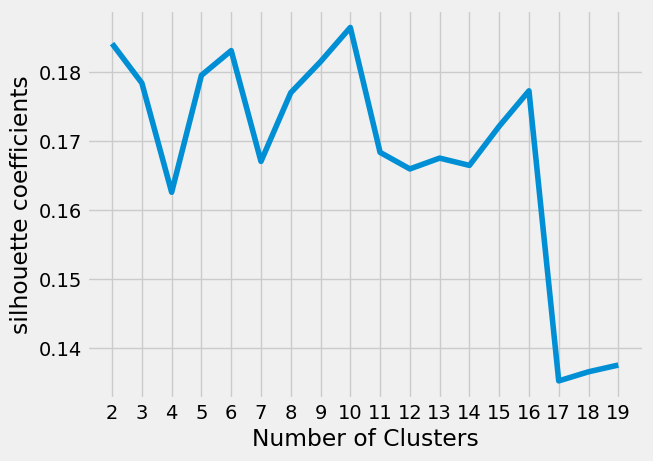

In [132]:
from sklearn.cluster import AgglomerativeClustering
sil_Hierarch = []
for k in range(2,20):#this range is optional
    Hierarch = AgglomerativeClustering(n_clusters = k,linkage='ward')#linkage determines which distance to use between sets of observstion.alghorithm minimize this distance
    score = silhouette_score(scaled_features, Hierarch.fit_predict(scaled_features),metric='euclidean')
    sil_Hierarch.append(score)
plt.style.use("fivethirtyeight")
plt.plot(range(2,20), sil_Hierarch)
plt.xticks(range(2,20))
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show()

In [133]:
print("max silhouette score for Agglomerative method is:",max(sil_Hierarch))

max silhouette score for Agglomerative method is: 0.1865256797594413


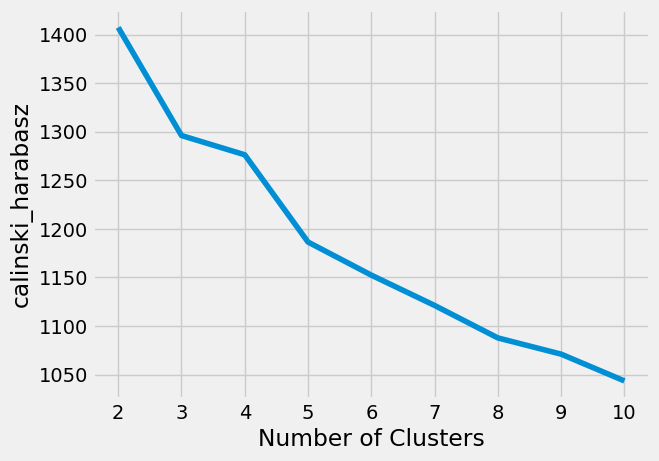

In [134]:
from sklearn import metrics
from sklearn.metrics import calinski_harabasz_score
calinski_harabaz = []
for k in range (2,11):
    Hierarch = AgglomerativeClustering(n_clusters = k, linkage='ward')
    score = metrics.calinski_harabasz_score(scaled_features, Hierarch.fit_predict(scaled_features))
    calinski_harabaz.append(score)
plt.style.use("fivethirtyeight")
plt.plot(range(2,11), calinski_harabaz)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("calinski_harabasz")
plt.show()

In [135]:
print("max calinski_harabasz sore for Agglomerative method is:",max(calinski_harabaz))

max calinski_harabasz sore for Agglomerative method is: 1407.277445469343


#### So 2 cluster , is the best, for Agglomerative modeling
####   
#### this algorithm dosn't have any attribute to find centers
#

In [136]:
Hierarch = AgglomerativeClustering(n_clusters =2,linkage='ward')
Hierarch.fit(scaled_features)
score = silhouette_score(scaled_features, Hierarch.fit_predict(scaled_features))
print("silhouette_score",score)

silhouette_score 0.18418454528547495


In [137]:
#adding cluster column to dataframe
labels = Hierarch.labels_
df_cluster_with_Hierarch = pd.concat([df, pd.DataFrame({'cluster': labels})], axis = 1)
df_cluster_with_Hierarch

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,1
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,0
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6,0
8632,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,0
8633,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,0
8634,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,0


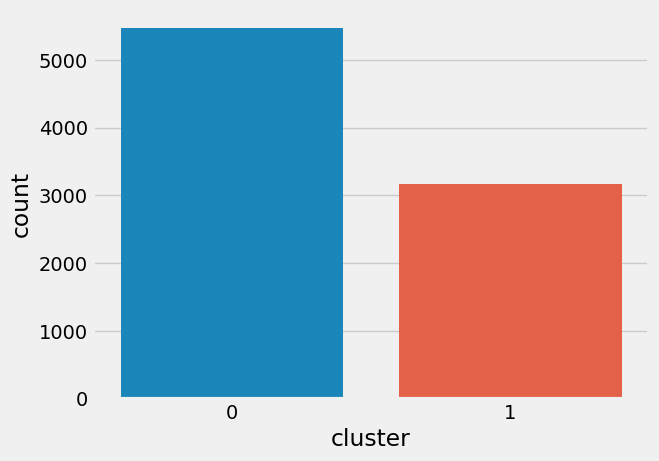

In [138]:
# counting number of clusters
sns.countplot(x=df_cluster_with_Hierarch.cluster)
plt.show()

#### cluster 0 is almost two times bigger than cluster 1

In [139]:
# interpreting clustering by Hierarchical Clustering model
cluster_report(df,df_cluster_with_Hierarch.cluster,min_samples_leaf=20,pruning_level=0.05)

,class_name,instance_count,rule_list
0,0,5468,[0.9556541019955654] (PURCHASES_FREQUENCY <= 0.6515154838562012)
1,1,3168,[0.8021768707482994] (PURCHASES_FREQUENCY > 0.6515154838562012)


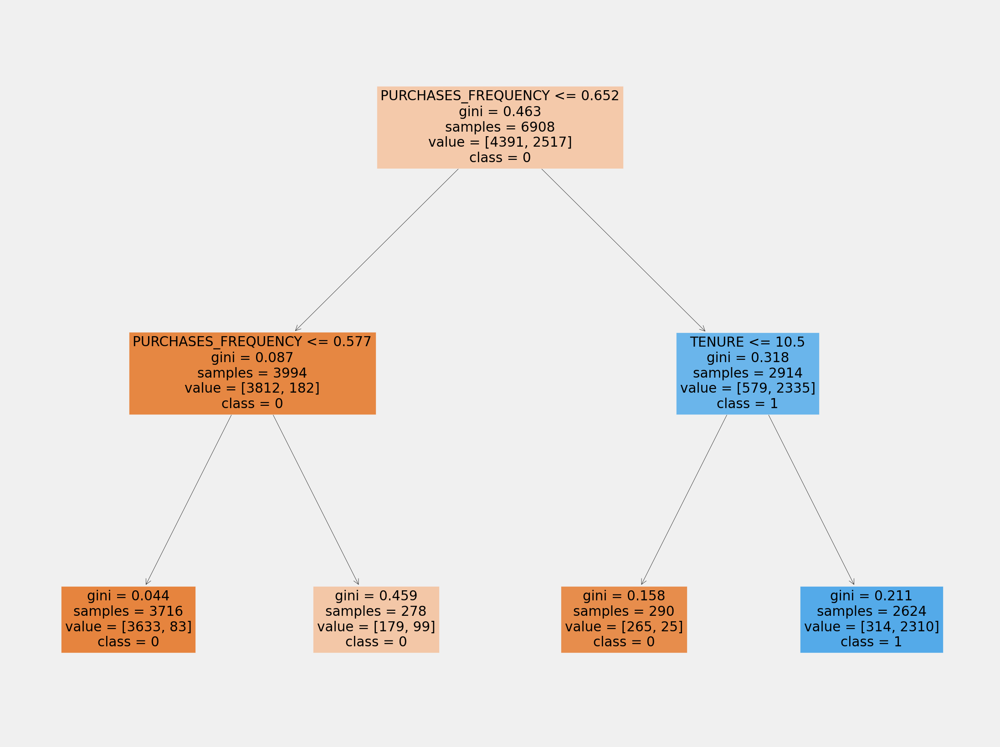

In [140]:
##visualization desision tree to find features that efect on decision
from sklearn import tree
from sklearn.model_selection  import train_test_split
X = df_cluster_with_Hierarch. drop('cluster', axis =1)
y = df_cluster_with_Hierarch['cluster']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=1)
clf = DecisionTreeClassifier(max_depth=2)
clf = clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
feature_names = ['BALANCE','BALANCE_FREQUENCY','PURCHASES','ONEOFF_PURCHASES','INSTALLMENTS_PURCHASES','CASH_ADVANCE','PURCHASES_FREQUENCY',
                'ONEOFF_PURCHASES_FREQUENCY','PURCHASES_INSTALLMENTS_FREQUENCY','CASH_ADVANCE_FREQUENCY','CASH_ADVANCE_TRX','PURCHASES_TRX',
                'CREDIT_LIMIT','PAYMENTS','MINIMUM_PAYMENTS','PRC_FULL_PAYMENT','TENURE']
target_names =['0','1']
fig = plt.figure(figsize=(25,20))
plot = tree.plot_tree(clf,
                     feature_names = feature_names,
                     class_names = target_names,
                     filled = True)


Text(50.44508101851852, 0.5, 'PURCHASES_TRX')

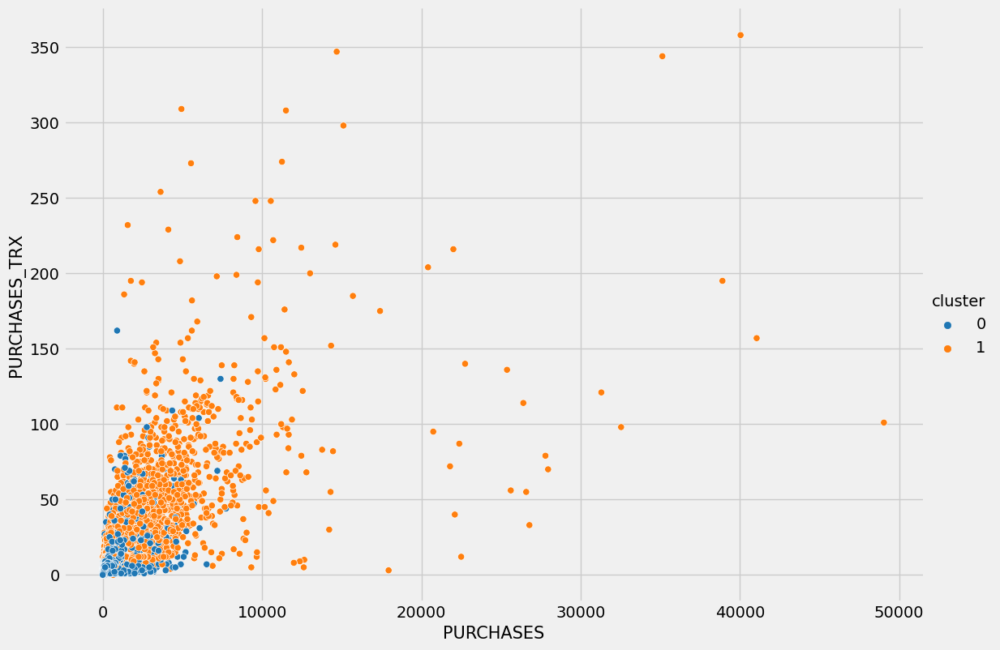

In [141]:
sns.relplot(data = df_cluster_with_Hierarch,x='PURCHASES' , y  ='PURCHASES_TRX', hue='cluster', palette='tab10' ,kind='scatter', height=8.27, aspect = 11.7/8.27)
plt.xlabel("PURCHASES",fontsize=15)
plt.ylabel("PURCHASES_TRX",fontsize=15)

In [142]:
score = silhouette_score(scaled_features, Hierarch.labels_)
score

0.18418454528547495

Text(50.44508101851852, 0.5, 'PURCHASES_TRX')

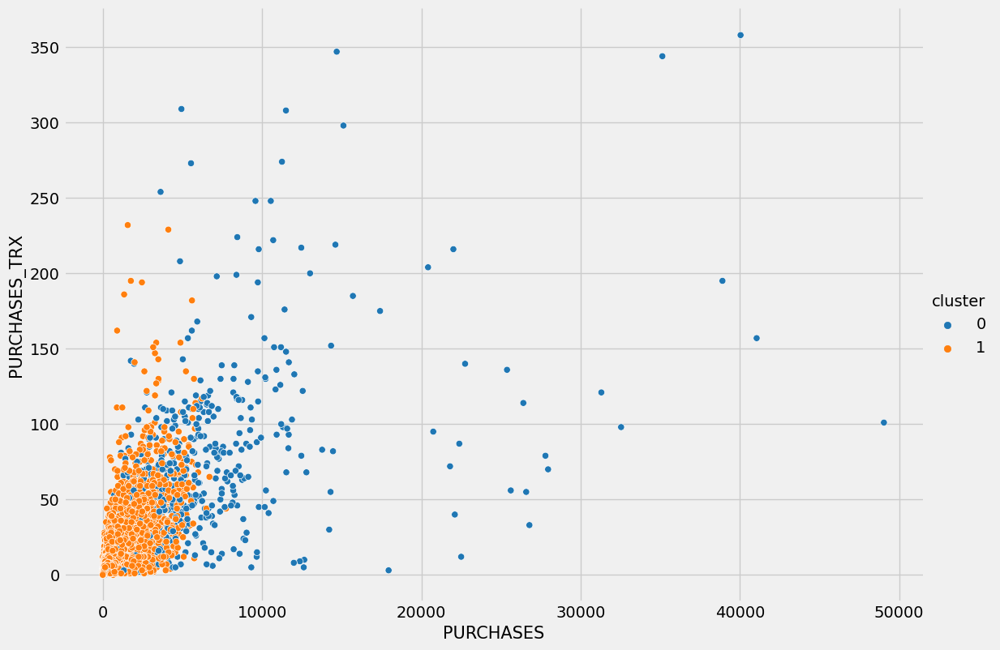

In [143]:
Hierarch = AgglomerativeClustering(n_clusters = 2).fit(df)

df_Hierarch = df.copy()
df_Hierarch['cluster'] = Hierarch.labels_

sns.relplot(data = df_Hierarch ,x='PURCHASES' , y  ='PURCHASES_TRX', hue='cluster', palette='tab10' ,kind='scatter', height=8.27, aspect = 11.7/8.27)
plt.xlabel("PURCHASES",fontsize=15)
plt.ylabel("PURCHASES_TRX",fontsize=15)

In [144]:
score = silhouette_score(df, Hierarch.labels_)
score

0.49972485265477606

In [145]:
#upon to silouette score, it seems that the second  visualization is better

#  MiniBatchKMeans
Mini-batch means you only take a subset of all your data during one iteration.The MiniBatchKMeans is a variant of the KMeans algorithm which uses mini-batches to reduce the computation time, while still attempting to optimise the same objective function

#مینی دسته به این معنی است که شما فقط زیرمجموعه ای از تمام داده های خود را در طول یک تکرار می گیرید

#مینی_بچ_کی_مینز گونه ای از الگوریتم کی_مینز است که از مینی دسته ها برای کاهش زمان محاسبه استفاده می کند

#در حالی که همچنان تلاش می کند همان تابع هدف را بهینه کند

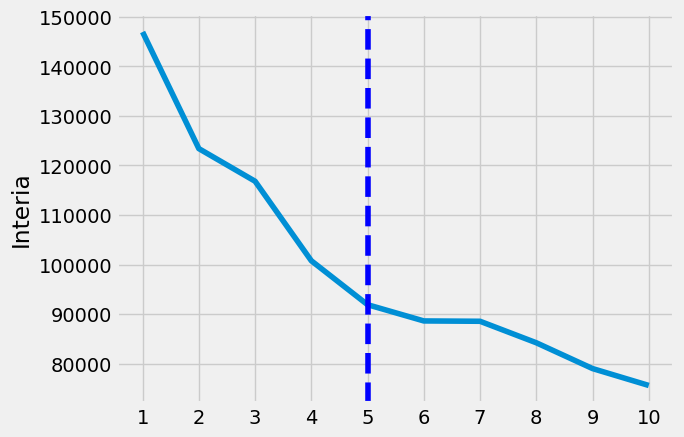

In [146]:
from sklearn.cluster import MiniBatchKMeans
List = []
for k in range(1,11):#this range is optional
    minibatch = MiniBatchKMeans(n_clusters=k , random_state =42, batch_size=50)
    minibatch.fit(scaled_features)
    List.append(minibatch.inertia_)
from kneed import KneeLocator
kl = KneeLocator(range(1,11), List, curve='convex', direction='decreasing')
kl.elbow
plt.style.use("fivethirtyeight")
plt.plot(range(1,11),List)
plt.xticks(range(1,11))
plt.ylabel("Interia")
plt.axvline(x=kl.elbow, color='b', label='axvline - full height', ls='--')
plt.show()

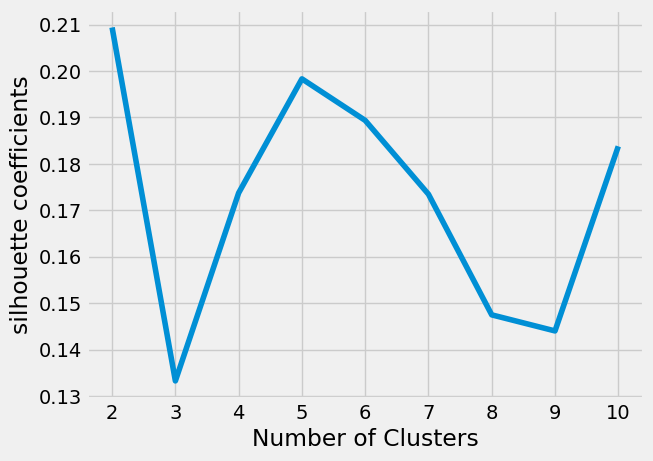

In [147]:
from sklearn.metrics import silhouette_score
silhouette_coefficients = []
for k in range (2,11):
    minibatch = MiniBatchKMeans(n_clusters=k, random_state =42, batch_size=50)
    minibatch.fit(scaled_features)
    score = silhouette_score(scaled_features, minibatch.predict(scaled_features))
    silhouette_coefficients.append(score)
plt.style.use("fivethirtyeight")
plt.plot(range(2,11), silhouette_coefficients)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show()

In [148]:
max(silhouette_coefficients)

0.2093768793881529

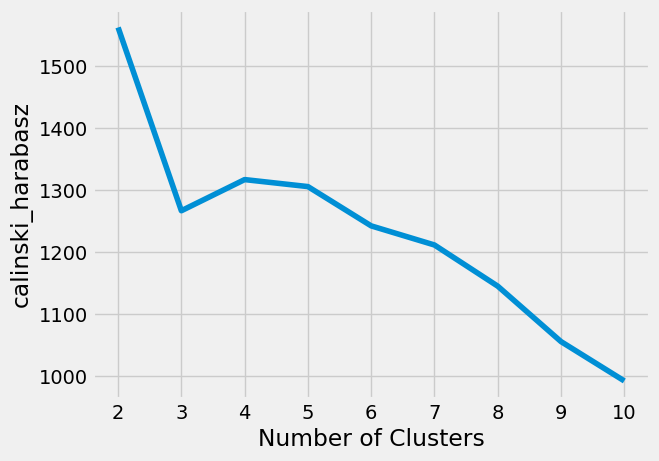

In [149]:
from sklearn import metrics
from sklearn.metrics import calinski_harabasz_score
calinski_harabaz = []
for k in range (2,11):
    minibatch = MiniBatchKMeans(n_clusters=k, init='random' , random_state =42, batch_size=50)
    minibatch.fit(scaled_features)
    score = metrics.calinski_harabasz_score(scaled_features, minibatch.labels_)
    calinski_harabaz.append(score)
plt.style.use("fivethirtyeight")
plt.plot(range(2,11), calinski_harabaz)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("calinski_harabasz")
plt.show()

In [150]:
max(calinski_harabaz)

1562.4996268588484

In [151]:
#So 3 cluster with silhouette score =0.28791103092641435, is the best for mini batch k-mean modeling

In [152]:
# view cluster centers (scaled centers)
from sklearn.cluster import MiniBatchKMeans
minibatch = MiniBatchKMeans(n_clusters=3, random_state =42, batch_size=50)
minibatch.fit(scaled_features)
labels = minibatch.labels_
cluster_centers = pd.DataFrame(data = minibatch.cluster_centers_, columns = [df.columns])
cluster_centers

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.068634,0.268122,-0.295043,-0.246478,-0.244816,0.000890,-0.221989,-0.307322,-0.182342,0.102310,0.094648,-0.310965,-0.302578,-0.208108,-0.046014,-0.219821,-0.058019
1,0.236399,0.404125,0.974490,0.747515,0.929378,0.048223,1.104311,1.222501,0.959325,-0.089805,0.034203,1.335417,0.795143,0.712212,0.208021,0.559677,0.278386
2,-0.692596,-1.751316,-0.346145,-0.256385,-0.346861,-0.340285,-0.680510,-0.430483,-0.583899,-0.459079,-0.370932,-0.440483,-0.201681,-0.262652,-0.291746,0.240964,0.215817


In [153]:
# viewing real centers
cluster_centers = scaler.inverse_transform(cluster_centers)
cluster_centers = pd.DataFrame(data = cluster_centers, columns = [df.columns])
cluster_centers

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,1457.405123,0.950720,386.080392,189.780613,196.299779,996.063740,0.406927,0.113701,0.296236,0.158248,3.968137,7.203431,3414.950980,1178.958918,755.139192,0.094181,11.458333
1,2096.586643,0.978966,3137.135638,1863.873557,1273.262081,1096.473391,0.939104,0.572703,0.750699,0.119483,3.550336,48.657718,7431.543624,3856.760198,1357.820637,0.325110,11.899329
2,149.923619,0.531313,275.342788,173.094519,102.705000,272.317402,0.222946,0.076748,0.136388,0.044971,0.750000,3.942308,3784.134615,1020.256035,172.157821,0.230690,11.817308


In [154]:
#adding cluster column to dataframe
df_cluster_with_minibatch = pd.concat([df, pd.DataFrame({'cluster': labels})], axis = 1)
df_cluster_with_minibatch

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,2
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,0
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6,2
8632,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,0
8633,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,0
8634,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,0


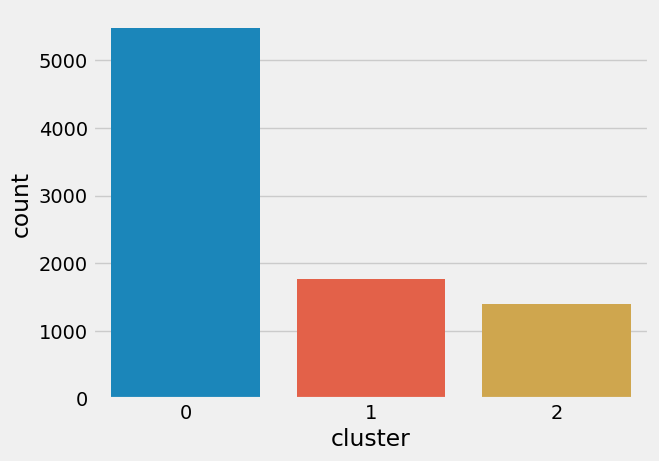

In [155]:
# counting number of clusters
sns.countplot(x=df_cluster_with_minibatch.cluster)
plt.show()

#people in class 0 are much more than class 1, and people in class 1 are more than class 2

In [156]:
cluster_report(df,df_cluster_with_minibatch.cluster,min_samples_leaf=20,pruning_level=0.05)

,class_name,instance_count,rule_list
0,0,5476,[0.940805804850105] (BALANCE_FREQUENCY > 0.7386364936828613) and (PURCHASES <= 1218.5800170898438)
1,1,1768,[0.7763779527559055] (BALANCE_FREQUENCY > 0.7386364936828613) and (PURCHASES > 1218.5800170898438)
2,2,1392,[0.8842034805890228] (BALANCE_FREQUENCY <= 0.7386364936828613)


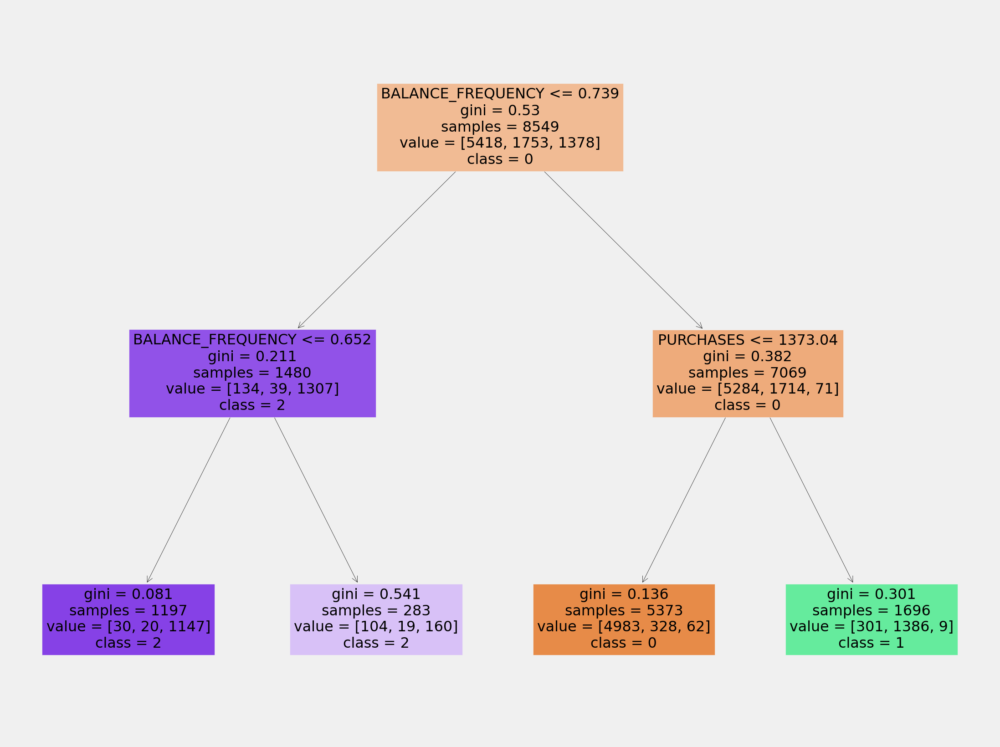

In [157]:
##visualization desision tree to find features to interpret classes
from sklearn import tree
from sklearn.model_selection  import train_test_split
X = df_cluster_with_minibatch. drop('cluster', axis =1)
y = df_cluster_with_minibatch['cluster']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.01,random_state=1)
clf = DecisionTreeClassifier(max_depth=2)
clf = clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
feature_names = ['BALANCE','BALANCE_FREQUENCY','PURCHASES','ONEOFF_PURCHASES','INSTALLMENTS_PURCHASES','CASH_ADVANCE','PURCHASES_FREQUENCY',
                'ONEOFF_PURCHASES_FREQUENCY','PURCHASES_INSTALLMENTS_FREQUENCY','CASH_ADVANCE_FREQUENCY','CASH_ADVANCE_TRX','PURCHASES_TRX',
                'CREDIT_LIMIT','PAYMENTS','MINIMUM_PAYMENTS','PRC_FULL_PAYMENT','TENURE']
target_names =['0','1','2']
fig = plt.figure(figsize=(25,20))
plot = tree.plot_tree(clf,
                     feature_names = feature_names,
                     class_names = target_names,
                     filled = True)


### visualizing by inversing normalize data

[[1.45740512e+03 9.50719931e-01 3.86080392e+02 1.89780613e+02
  1.96299779e+02 9.96063740e+02 4.06926922e-01 1.13701152e-01
  2.96235654e-01 1.58248343e-01 3.96813725e+00 7.20343137e+00
  3.41495098e+03 1.17895892e+03 7.55139192e+02 9.41809387e-02
  1.14583333e+01]
 [2.09658664e+03 9.78965839e-01 3.13713564e+03 1.86387356e+03
  1.27326208e+03 1.09647339e+03 9.39104148e-01 5.72703309e-01
  7.50698745e-01 1.19483416e-01 3.55033557e+00 4.86577181e+01
  7.43154362e+03 3.85676020e+03 1.35782064e+03 3.25109919e-01
  1.18993289e+01]
 [1.49923619e+02 5.31313221e-01 2.75342788e+02 1.73094519e+02
  1.02705000e+02 2.72317402e+02 2.22945760e-01 7.67482019e-02
  1.36387904e-01 4.49713077e-02 7.50000000e-01 3.94230769e+00
  3.78413462e+03 1.02025604e+03 1.72157821e+02 2.30690173e-01
  1.18173077e+01]]


Text(50.44508101851852, 0.5, 'PURCHASES_TRX')

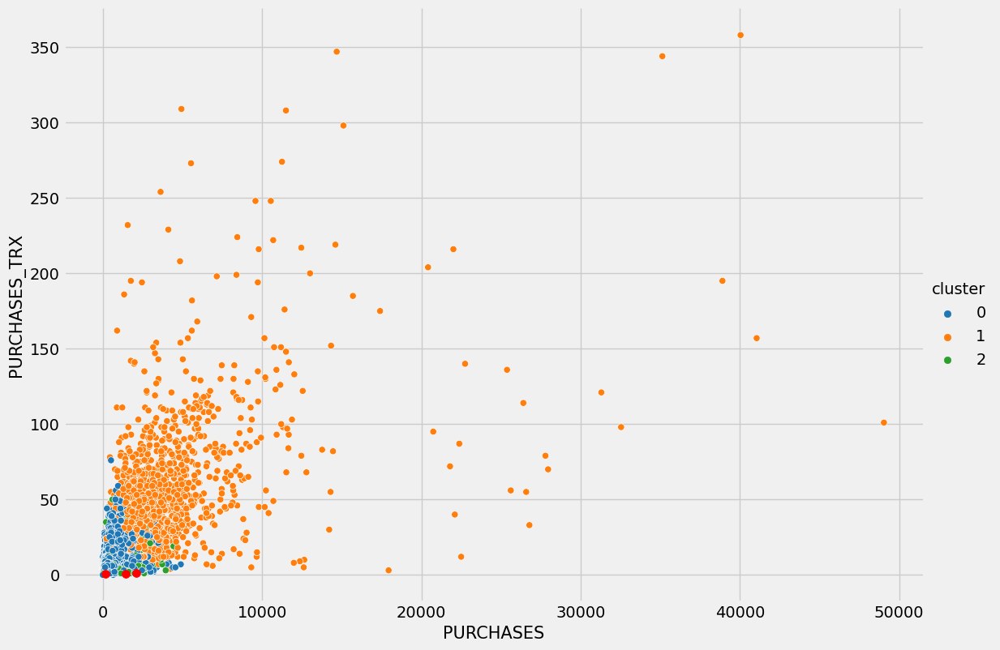

In [158]:
centroids = minibatch.cluster_centers_
centroids = scaler.inverse_transform(centroids)
print(centroids)


sns.relplot(data = df_cluster_with_minibatch ,x='PURCHASES' , y  ='PURCHASES_TRX', hue='cluster', palette='tab10' ,kind='scatter', height=8.27, aspect = 11.7/8.27)
plt.scatter(centroids[:, 0], centroids[:,1], c='red', s=50)
plt.xlabel("PURCHASES",fontsize=15)
plt.ylabel("PURCHASES_TRX",fontsize=15)

Text(52.1524261039886, 0.5, 'CASH_ADVANCE')

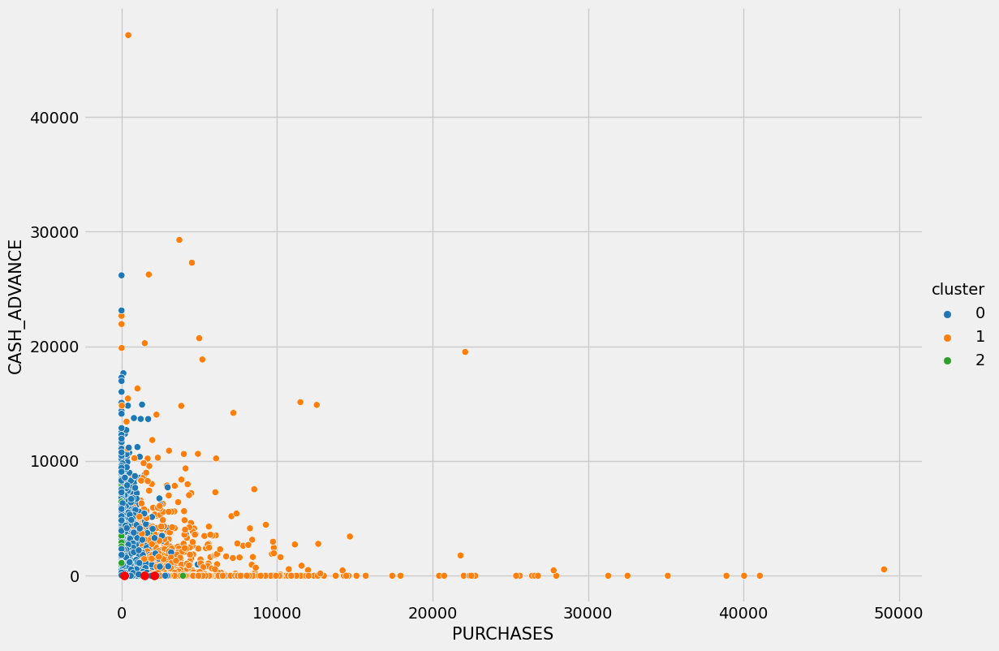

In [159]:
sns.relplot(data = df_cluster_with_minibatch ,x='PURCHASES' , y  ='CASH_ADVANCE', hue='cluster', palette='tab10' ,kind='scatter', height=8.27, aspect = 11.7/8.27)
plt.scatter(centroids[:, 0], centroids[:,1], c='red', s=50)
plt.xlabel("PURCHASES",fontsize=15)
plt.ylabel("CASH_ADVANCE",fontsize=15)

### visualizing by original data

[[9.18600827e+02 8.84867750e-01 6.25560463e+02 3.24550688e+02
  3.01128048e+02 5.68978110e+02 4.64479989e-01 1.59457279e-01
  3.48874596e-01 1.10303350e-01 2.43053817e+00 1.16708385e+01
  2.74080100e+03 1.04650401e+03 6.76900015e+02 1.64526304e-01
  1.14931164e+01]
 [4.16318921e+03 9.28977281e-01 5.36414937e+03 3.54112406e+03
  1.82302531e+03 6.01442767e+03 5.96117406e-01 4.34287094e-01
  4.73755437e-01 3.11553063e-01 1.06562500e+01 4.22500000e+01
  1.04906250e+04 1.32565624e+04 1.60065263e+03 3.18127656e-01
  1.18125000e+01]
 [3.06402213e+03 9.12662005e-01 1.43895566e+03 8.66509361e+02
  5.72446301e+02 1.85119161e+03 5.55493279e-01 3.22835648e-01
  4.07128365e-01 2.06531041e-01 5.50684932e+00 2.30000000e+01
  9.60936073e+03 2.66075647e+03 1.26056541e+03 1.81823941e-01
  1.17351598e+01]]


Text(50.44508101851852, 0.5, 'PURCHASES_TRX')

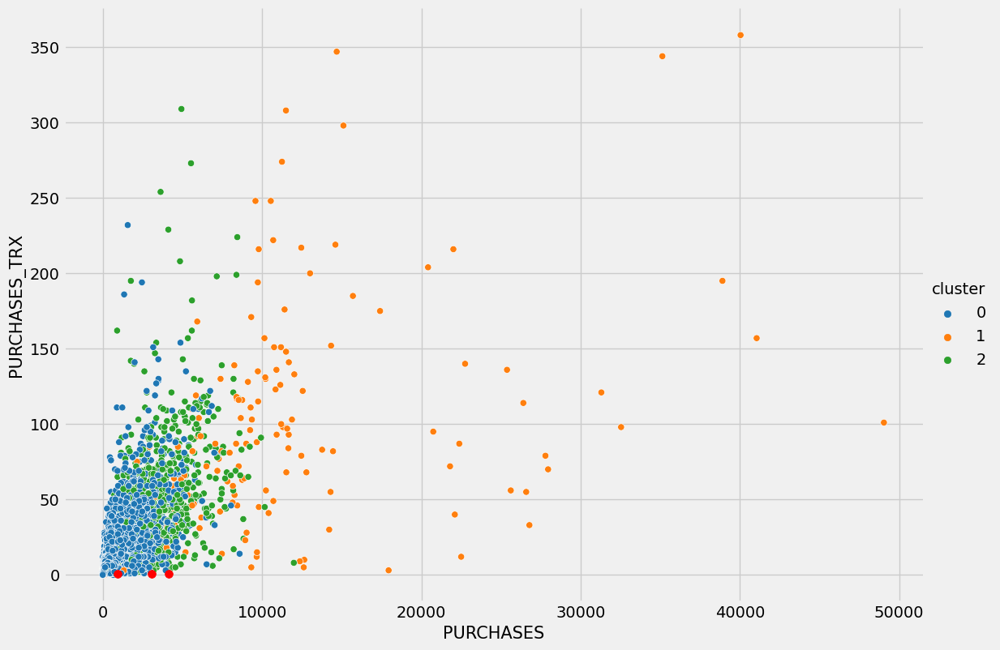

In [160]:
minibatch_df = minibatch.fit(df)
centroids = minibatch_df.cluster_centers_
print(centroids)

df_minibatch = df.copy()
df_minibatch['cluster'] = minibatch_df.labels_

sns.relplot(data = df_minibatch ,x='PURCHASES' , y  ='PURCHASES_TRX', hue='cluster', palette='tab10' ,kind='scatter', height=8.27, aspect = 11.7/8.27)
plt.scatter(centroids[:, 0], centroids[:,1], c='red', s=50)
plt.xlabel("PURCHASES",fontsize=15)
plt.ylabel("PURCHASES_TRX",fontsize=15)

Text(52.1524261039886, 0.5, 'CASH_ADVANCE')

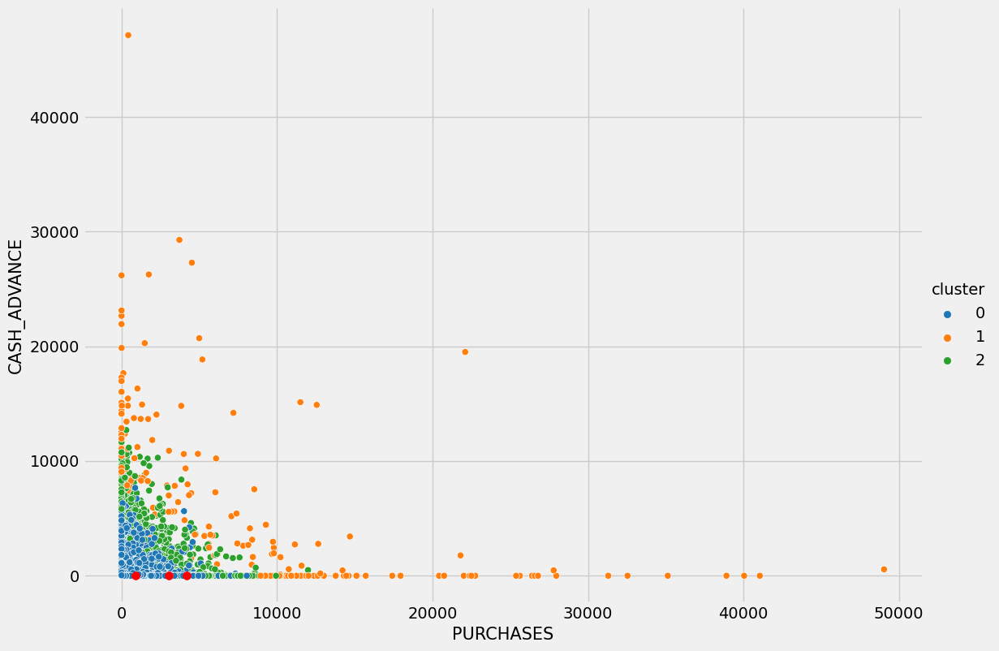

In [161]:
sns.relplot(data = df_minibatch ,x='PURCHASES' , y  ='CASH_ADVANCE', hue='cluster', palette='tab10' ,kind='scatter', height=8.27, aspect = 11.7/8.27)
plt.scatter(centroids[:, 0], centroids[:,1], c='red', s=50)
plt.xlabel("PURCHASES",fontsize=15)
plt.ylabel("CASH_ADVANCE",fontsize=15)

# Mean Shift

#هدف خوشه بندی مین_شیفت کشف حبابها در تراکم صاف نمونه ها است

#این یک الگوریتم مبتنی بر مرکز است که با به روز رسانی کاندیدهای مرکز به عنوان میانگین نقاط در یک منطقه خاص کار می کند

#این کاندیدها سپس در مرحله پس از پردازش فیلتر می شوند تا تقریباً تکراری ها حذف شوند تا مجموعه نهایی مرکزها را تشکیل دهند

#الگوریتم به جای تکیه بر پهنای باند پارامتر، که اندازه منطقه را برای جستجو تعیین میکند، بطور خودکار تعداد خوشه ها را تنظیم مکند

#می توان آن را با استفاده از تابع برآورد_ پهنای باند ارائه شده تخمین زد، که در صورت تنظیم نشدن پهنای باند فراخوانی می شود

#این الگوریتم بسیار مقیاس پذیر نیست، زیرا در طول اجرای الگوریتم به چندین جستجوی نزدیکترین همسایه نیاز دارد

#الگوریتم تضمین شده است که همگرا شود، با این حال، زمانی که تغییر در مرکزها کم باشد، الگوریتم تکرار نخواهد شد

#برچسب گذاری یک نمونه جدید با یافتن نزدیکترین مرکز برای یک نمونه مشخص انجام می شود

In [162]:
from sklearn.cluster import MeanShift
meanshift = MeanShift(bandwidth= 12)
meanshift.fit(scaled_features)
cluster_centers = meanshift.cluster_centers_
labels = meanshift.labels_
np.unique(labels)

array([0, 1, 2, 3, 4])

In [163]:
score = silhouette_score(scaled_features, meanshift.labels_)
score

0.7462887740163403

In [164]:
#adding cluster column to dataframe
df_cluster_with_meanshift = pd.concat([df, pd.DataFrame({'cluster': labels})], axis = 1)
df_cluster_with_meanshift

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,0
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6,0
8632,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,0
8633,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,0
8634,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,0


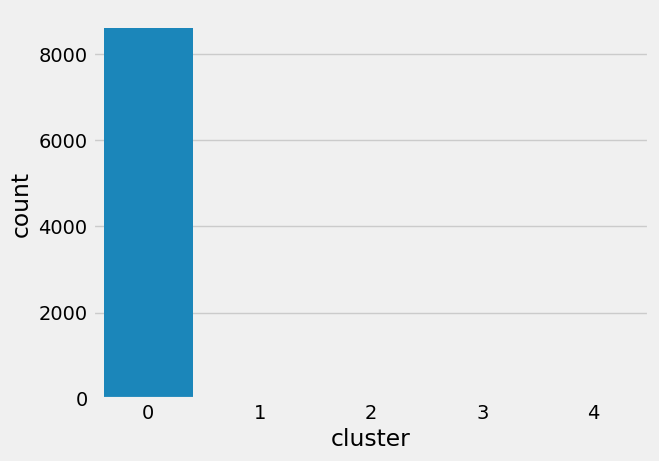

In [165]:
# counting number of clusters
sns.countplot(x=df_cluster_with_meanshift.cluster)
plt.show()

من اندازه های مختلف باند را برای این الگوریتم آزمایش کردم تعداد کلاسترهای ایجاد شده و نحوه پر شدن آنها در هر حالت را در زیر مشاهده می کنید:

bandwidth = 6

silhouette_score = 0.4995750822656693

![image-6.png](attachment:image-6.png)
-----------------------------------------------------------------------------------------------------------------------

bandwidth= 8

silhouette_score = 0.6250768730821703

![image-2.png](attachment:image-2.png)
----------------------------------------------------------------------------------------------------------------------------------------
bandwidth= 10

silhouette_score = 0.7261554913637849
![image-3.png](attachment:image-3.png)

-----------------------------------------------------------------------------------------------------------------------
bandwidth= 12

silhouette_score = 0.7462887740163403
![image.png](attachment:image.png)
----------------------------------------------------------------------------------------------------------------------------------------
bandwidth= 13

silhouette_score = 0.7729757576942968
![image-4.png](attachment:image-4.png)

----------------------------------------------------------------------------------------------------------------------
bandwidth= 14

silhouette_score = 0.7729757576942968
![image-4.png](attachment:image-4.png)
-----------------------------------------------------------------------------------------------------------------------
bandwidth = 15

silhouette_score = Number of labels is 1 , Invalid for silhouette_score

![image-5.png](attachment:image-5.png)

نتایج نشان می دهد که در تمام حالتها ،این الگوریتم تمام داده ها را فقط در کلاس صفر قرار می دهد و بقیه را خالی می گذارد. این نشان می دهد که این الگوریتم برای کلاستر بندی این دیتا مناسب نمی باشد.و بیشتر برای کارهایی مثل پردازش تصویر مناسب است.

# Affinity Propagation

#با ارسال پیام بین جفت نمونه ها تا زمان همگرایی، خوشه ها را ایجاد می کند

#سپس یک مجموعه داده با استفاده از تعداد کمی از نمونه ها توصیف می شود، که به عنوان نمونه هایی از نمونه های دیگر شناسایی می شوند

#پیام های ارسال شده بین جفت ها نشان دهنده مناسب بودن یک نمونه به عنوان نمونه دیگری است که در پاسخ به مقادیر جفتهای دیگر به روزرسانی می شود

#این به روز رسانی به صورت مکرر تا زمان همگرایی انجام می شود

#در این مرحله نمونه های نهایی انتخاب می شوند و از این رو خوشه بندی نهایی داده می شود

#این الگوریتم دارای پیچیدگی زمانی مرتبه است که تعداد نمونه ها و تعداد تکرارها تا زمان همگرایی است

#برای مجموعه داده های کوچک تا متوسط مناسب باشد

In [166]:
from sklearn.cluster import AffinityPropagation
Affinity = AffinityPropagation(random_state=5)
Affinity.fit(scaled_features)
labels = Affinity.labels_
np.unique(labels)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [167]:
from sklearn.cluster import AffinityPropagation
Affinity = AffinityPropagation(damping= 0.9)
Affinity.fit(scaled_features)
labels = Affinity.labels_
np.unique(labels)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [168]:
from sklearn.cluster import AffinityPropagation
Affinity = AffinityPropagation(damping= 0.5)
Affinity.fit(scaled_features)
labels = Affinity.labels_
np.unique(labels)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

### results:
#### I triyed affinity algorithm with different damping factors
#### Damping factor is varing in the range [0.5, 1.0)
#### Damping factor=0.5 ----> 356 cluster
#### Damping factor=0.5  -----> 342 cluster
#### so high number of clusters shows that this algorithm is not suitable for this data

# DBSCAN

#این الگوریتم خوشه ها را به عنوان مناطقی با چگالی بالا می بیند که توسط مناطق با چگالی کم از هم جدا شده اند

#جزء اصلی آن مفهوم نمونه های هسته است که نمونه هایی هستند که در مناطق با تراکم بالا قرار دارند

#بنابراین یک خوشه مجموعه ای از نمونه های اصلی است که هر کدام به یکدیگر نزدیک هستند (با اندازه گیری فاصله اندازه گیری میشوند)

#مجموعه ای از نمونه های غیر هسته ای که نزدیک به یک نمونه هسته هستند (اما خود نمونه های اصلی نیستند)

#دو پارامتر الگوریتم مین_سمپل های بالاتر یا ای_پی_اس کمتر نشان دهنده چگالی بالاتر لازم برای تشکیل یک خوشه است

In [169]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
min_samples = np.arange(5,20,1)

Eps=[]
Min_samples=[]
num_clusters = []
silhouette_coefficients = []
best_n_clusters = 2
max_sil = 0
for i in  range(2,21):
    for j in  range(1,5):
        model_db = DBSCAN(eps=j, min_samples = i, metric='euclidean')
        model_db.fit(scaled_features)
        labels = model_db.labels_
        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)#cluster (-1), is not exactly part of a cluster. They are simply points that do not belong to any clusters and can be "ignored" to some extent.
        num_clusters.append(n_clusters_)
        Min_samples.append(i)
        Eps.append(j)

        score = silhouette_score(scaled_features,  model_db.labels_)
        silhouette_coefficients.append(score)
        if (score > max_sil) and (n_clusters_>=2):
            max_sil = score
            best_n_clusters = n_clusters_
            min_sample = i
            ep = j


In [170]:
print("maximum of silhouette:",max_sil)
print('best_n_clusters:',best_n_clusters)
print('min_samples:',min_sample)
print('best eps:',ep)

maximum of silhouette: 0.6999788161580581
best_n_clusters: 2
min_samples: 4
best eps: 4


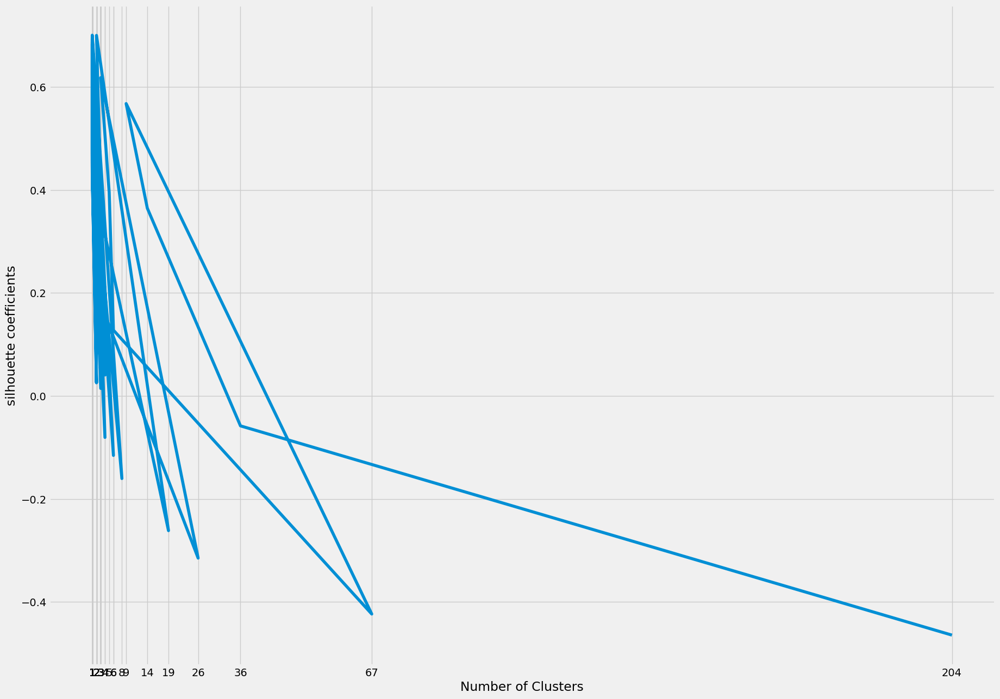

In [171]:
plt.subplots(figsize=(20,15))
plt.style.use("fivethirtyeight")
plt.plot(num_clusters, silhouette_coefficients)
plt.xticks(num_clusters)
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show()

In [172]:
dbscan_data = pd.DataFrame({'num_clusters': num_clusters,'silhouette_coefficients':silhouette_coefficients,'eps':Eps,'min_samples':Min_samples})
dbscan_data.sort_values(by='silhouette_coefficients',inplace=True,ascending=False)
dbscan_data

,num_clusters,silhouette_coefficients,eps,min_samples
15,1,0.700390,4,5
11,2,0.699979,4,4
19,1,0.697745,4,6
23,1,0.697139,4,7
27,1,0.695743,4,8
...,...,...,...,...
16,8,-0.160242,1,6
12,19,-0.261413,1,5
8,26,-0.314724,1,4
4,67,-0.423325,1,3


In [173]:
# one cluster is not suitable so i drop them
dbscan_data = dbscan_data[dbscan_data['num_clusters']>= 2]
dbscan_data

,num_clusters,silhouette_coefficients,eps,min_samples
11,2,0.699979,4,4
7,3,0.618033,4,3
3,9,0.567653,4,2
10,3,0.395873,3,4
6,5,0.395054,3,3
13,2,0.389836,2,5
2,14,0.364590,3,2
9,3,0.179031,2,4
5,6,0.127814,2,3
44,2,0.092436,1,13


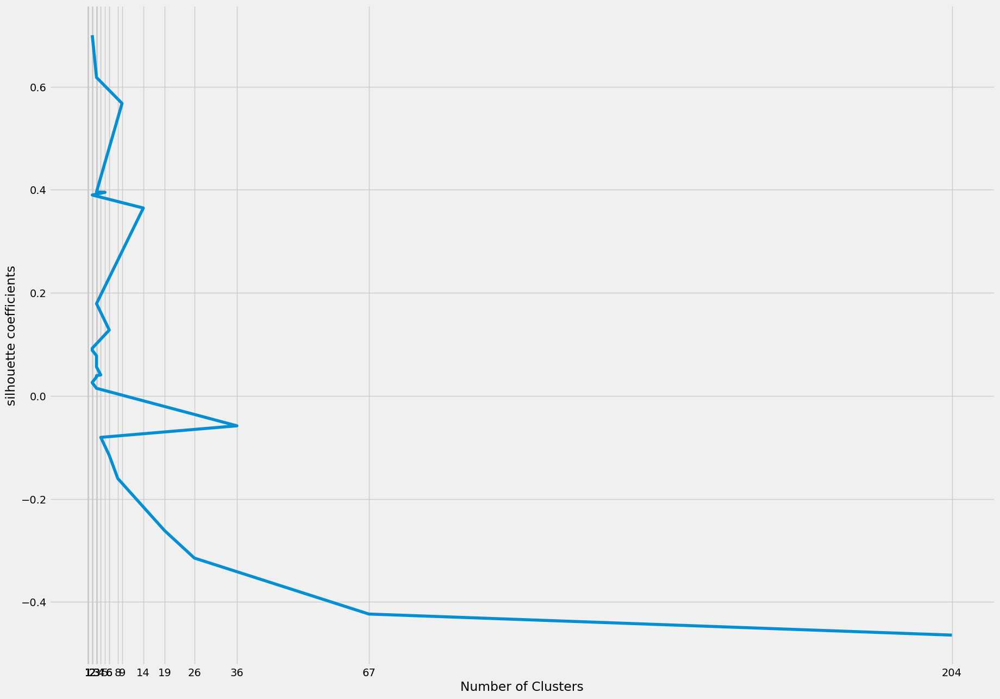

In [174]:
plt.subplots(figsize=(20,15))
plt.style.use("fivethirtyeight")
plt.plot(dbscan_data['num_clusters'], dbscan_data['silhouette_coefficients'])
plt.xticks(num_clusters)
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show()

In [175]:
model_db = DBSCAN(eps=4, min_samples=4, metric='euclidean')
model_db.fit(scaled_features)
labels = model_db.labels_
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
outlier = list(labels).count(-1)
score = silhouette_score(scaled_features,  model_db.labels_)
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of outlier points: %d' % outlier)
print("silhouette_score:",score)

Estimated number of clusters: 2
Estimated number of outlier points: 89
silhouette_score: 0.6999788161580581


In [176]:
#adding cluster column to dataframe
df_cluster_with_dbscan = pd.concat([df, pd.DataFrame({'cluster': labels})], axis = 1)
df_cluster_with_dbscan

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,0
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6,0
8632,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,0
8633,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,0
8634,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,0


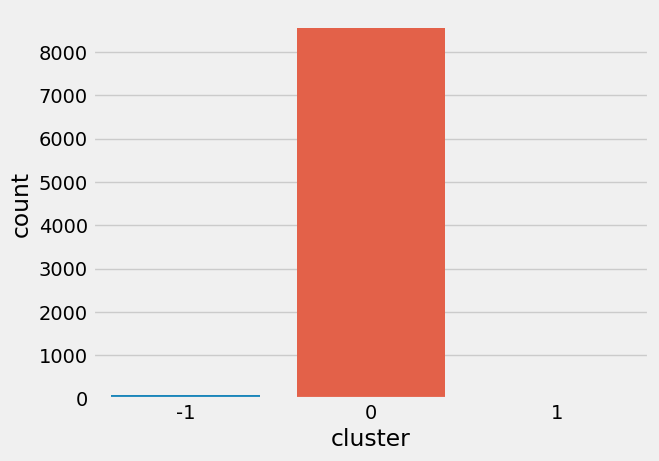

In [177]:
# counting number of clusters
sns.countplot(x=df_cluster_with_dbscan.cluster)
plt.show()

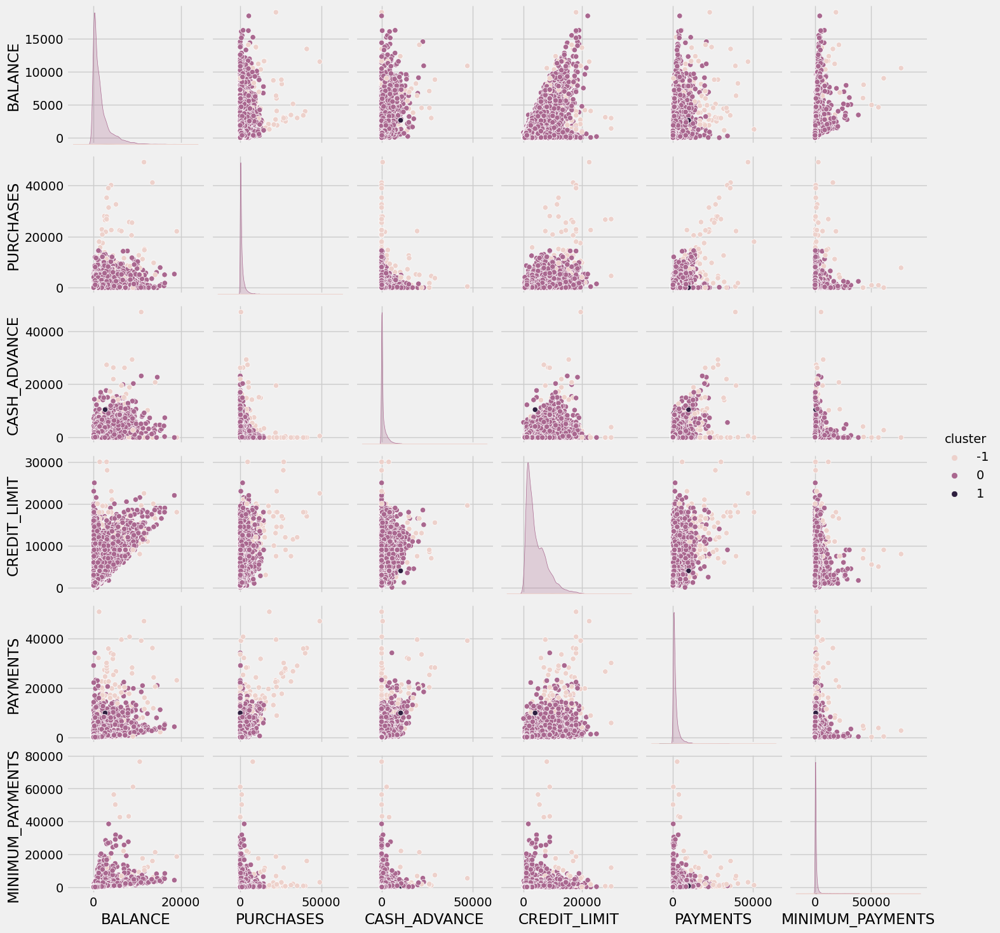

In [178]:
best_cols = ["BALANCE", "PURCHASES", "CASH_ADVANCE","CREDIT_LIMIT", "PAYMENTS", "MINIMUM_PAYMENTS","cluster"]
sns.pairplot( df_cluster_with_dbscan[ best_cols ], hue="cluster")

#
### comparing models with outliers

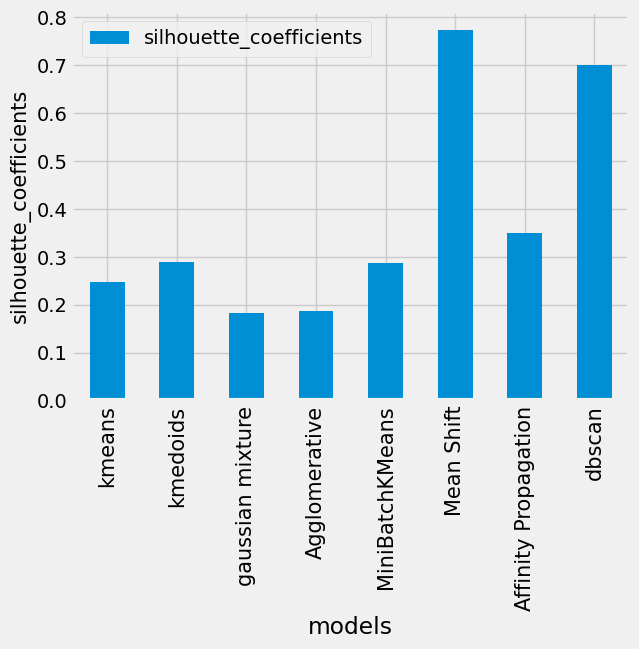

In [179]:
df12 = pd.DataFrame({'models':['kmeans','kmedoids','gaussian mixture','Agglomerative','MiniBatchKMeans' ,'Mean Shift', 'Affinity Propagation', 'dbscan'], 'silhouette_coefficients':[0.24771296656343036,0.2886451888261335,0.18353676992495227,0.1865256797594413,0.28791103092641435, 0.7729757576942968, 0.3497053045186641, 0.6999788161580581]})
ax = df12.plot.bar(x='models', y='silhouette_coefficients', rot=90)
plt.xticks(fontsize=15)
plt.ylabel("silhouette_coefficients",fontsize=15)
plt.show()

تحلیل و گزارش نمودار بالا:

#پنج الگوریتم اول گرچه امتیاز کمتری نسبت به سه تای آخر کسب کرده اند اما تصاویر کلاس بندیها نشان دادند که جداسازی دقیقتری انجام داده اند

#از بین پنج تای اول بهترین امتیاز توسط کی-مدوید کسب شده است

#زیرا این الگوریتم همانطور که بیان شد به نقاط پرت حساس نمی باشد

#سه الگوریتم آخر گرچه امتیاز بالایی گرفته اند اما کلاس بندی آنها درست نبود به صورتی که تمام دیتا را در یک کلاس ریخته و در واقع هیچ کلاستربندی انجام نمی دادند

# outliers analisys

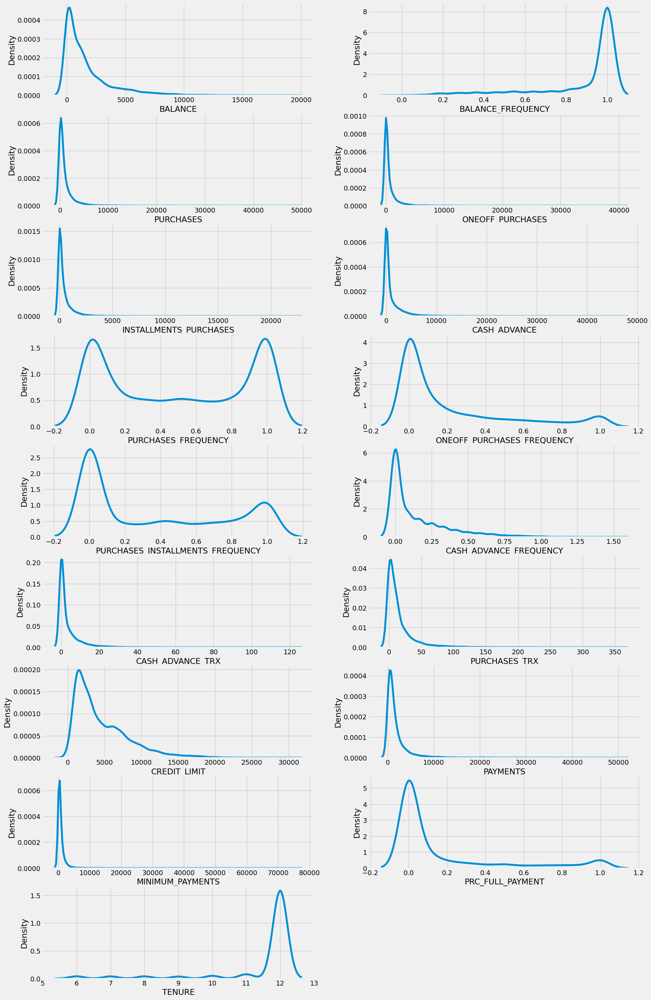

In [180]:
plt.figure(figsize=(20,35))
for i, col in enumerate(df.columns):
    ax = plt.subplot(9, 2, i+1)
    sns.kdeplot(df[col])
    plt.xlabel(col)

plt.show()

#lots of skewness shows lots of outliers. this outliers are Distribution-based : Outliers are the data points that occupy the tail ends of the distribution curve.

#نقاط پرت نقاط داده ای هستند که انتهای انتهای منحنی توزیع را اشغال می کنند

#handling outliers(رسیدگی به موارد پرت)

#detecting  and deleting(تشخیص و حذف)

In [181]:
#zscore is availabe in scipy.stats
from scipy import stats
z = np.abs(stats.zscore(df))
print(z)

       BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  \
0     0.744625           0.370047   0.429184          0.359160   
1     0.764152           0.067679   0.473208          0.359160   
2     0.426602           0.505405   0.116413          0.099909   
3     0.373910           0.505405   0.465825          0.349660   
4     0.099551           0.505405   0.142062          0.359160   
...        ...                ...        ...               ...   
8631  0.761342           1.902089   0.463563          0.346751   
8632  0.750546           0.505405   0.338865          0.359160   
8633  0.752977           0.297095   0.406572          0.359160   
8634  0.757721           0.297095   0.473208          0.359160   
8635  0.586278           1.099590   0.031295          0.289957   

      INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  \
0                   0.354826      0.468655             0.820769   
1                   0.458839      2.568556             1.236139   
2     

In [182]:
z.shape

(8636, 17)

In [183]:
#you can define the threshold value for the z score to classify a point as an outlier or not
threshold = 3
print(np.where(z > 3))

(array([   5,   18,   19, ..., 8633, 8634, 8635]), array([ 3, 14, 14, ..., 16, 16, 16]))


In [184]:
#deleting outliers and put them in df1
df1 = df[(z < 3).all(axis=1)]
df1.shape

(7190, 17)

In [185]:
df1

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000,0,1,1200.0,678.334763,244.791237,0.000000,12
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8567,121.294493,0.750000,385.26,385.26,0.00,169.554775,0.500000,0.500000,0.000000,0.125,3,7,500.0,98.225317,113.944625,0.000000,8
8568,55.147722,0.875000,163.31,0.00,163.31,0.000000,0.875000,0.000000,0.750000,0.000,0,7,1000.0,62.619008,109.580539,0.000000,8
8569,869.328293,0.750000,0.00,0.00,0.00,1153.925205,0.000000,0.000000,0.000000,0.125,3,0,1200.0,150.755024,337.986933,0.000000,8
8570,137.744895,1.000000,441.00,0.00,441.00,0.000000,0.750000,0.000000,0.625000,0.000,0,6,1000.0,169.249683,124.639905,0.000000,8


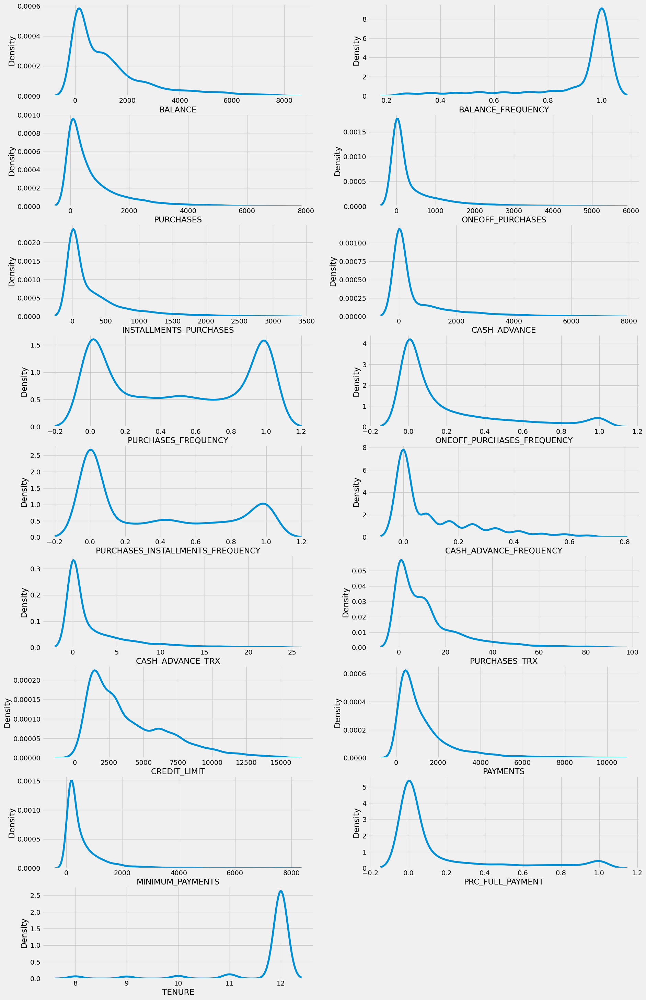

In [186]:
plt.figure(figsize=(20,35))
for i, col in enumerate(df1.columns):
    ax = plt.subplot(9, 2, i+1)
    sns.kdeplot(df1[col])
    plt.xlabel(col)

plt.show()

if you compare with previous picture this one has less outliers

## making model without outlier

In [187]:
scaler = StandardScaler()
X = scaler.fit_transform(df1)

## kmeans without outlier

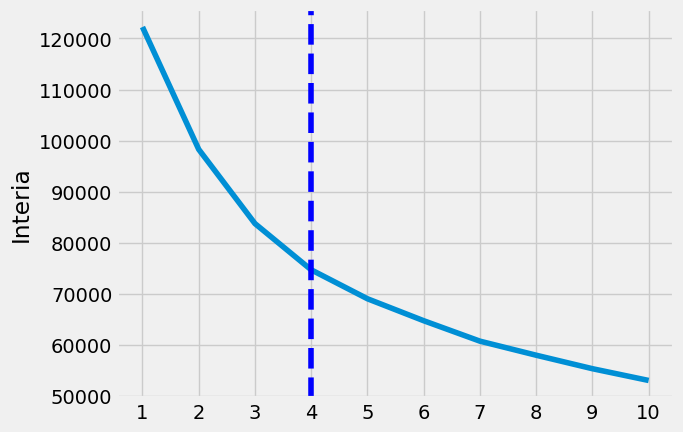

In [188]:
List = []
for k in range(1,11):#this range is optional
    kmeans = KMeans(n_clusters=k, init= "random",max_iter = 300, random_state = 1, n_init = 10)
    kmeans.fit(X)
    List.append(kmeans.inertia_)
from kneed import KneeLocator
kl = KneeLocator(range(1,11), List, curve='convex', direction='decreasing')
kl.elbow
plt.style.use("fivethirtyeight")
plt.plot(range(1,11),List)
plt.xticks(range(1,11))
plt.ylabel("Interia")
plt.axvline(x=kl.elbow, color='b', label='axvline - full height', ls='--')
plt.show()

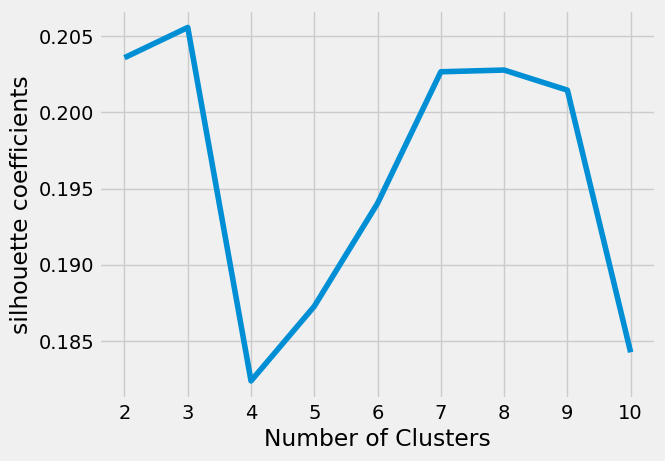

maxs silhouette 0.20557066262620494


In [189]:
from sklearn.metrics import silhouette_score
silhouette_coefficients = []
for k in range (2,11):
    kmeans = KMeans(n_clusters=k,init= "random", random_state = 1)
    kmeans.fit(X)
    score = silhouette_score(X, kmeans.labels_)
    silhouette_coefficients.append(score)
plt.style.use("fivethirtyeight")
plt.plot(range(2,11), silhouette_coefficients)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show()
print('maxs silhouette',max(silhouette_coefficients))

#
## kmedoids without outlier

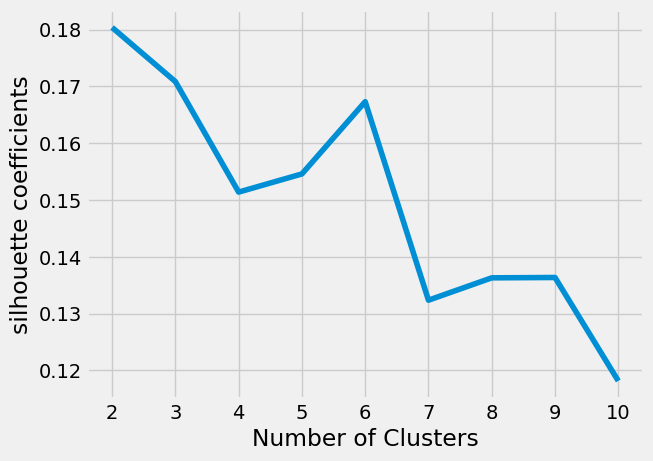

maxs silhouette 0.1803966960952361


In [190]:
from sklearn_extra.cluster import KMedoids
silhouette_coefficients = []
for k in range (2,11):
    kmedoids = KMedoids(n_clusters=k,init= "random", random_state = 5)
    kmedoids.fit(X)
    score = silhouette_score(X, kmedoids.labels_)
    silhouette_coefficients.append(score)

plt.style.use("fivethirtyeight")
plt.plot(range(2,11), silhouette_coefficients)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show()
print('maxs silhouette',max(silhouette_coefficients))

#
## GaussianMixture without outlier

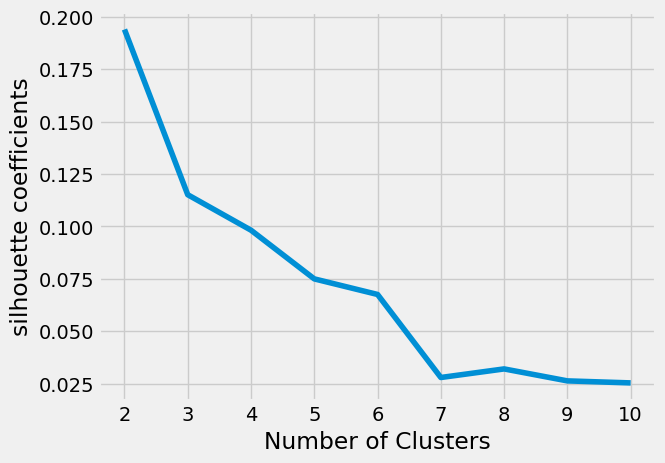

maxs silhouette 0.19396703417813158


In [191]:
from sklearn.mixture import GaussianMixture
sil_gmm = []
for k in range(2,11):#this range is optional
    gmm = GaussianMixture(n_components=k, random_state=1 )#each gaussian in your mixture is one component
    gmm.fit(scaled_features)
    score = silhouette_score(scaled_features, gmm.predict(scaled_features),metric='euclidean',random_state=5)
    sil_gmm.append(score)
plt.style.use("fivethirtyeight")
plt.plot(range(2,11), sil_gmm)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show()
print('maxs silhouette',max(sil_gmm ))

## AgglomerativeClustering

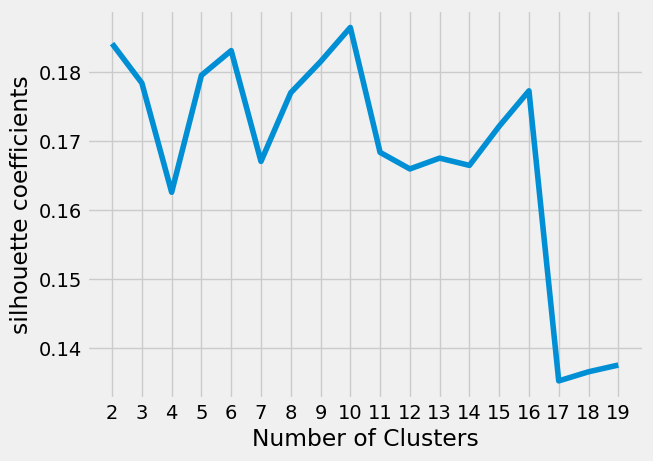

maxs silhouette 0.1865256797594413


In [192]:
from sklearn.cluster import AgglomerativeClustering
sil_Hierarch = []
for k in range(2,20):#this range is optional
    Hierarch = AgglomerativeClustering(n_clusters = k,linkage='ward')#linkage determines which distance to use between sets of observstion.alghorithm minimize this distance
    score = silhouette_score(scaled_features, Hierarch.fit_predict(scaled_features),metric='euclidean')
    sil_Hierarch.append(score)
plt.style.use("fivethirtyeight")
plt.plot(range(2,20), sil_Hierarch)
plt.xticks(range(2,20))
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show()
print('maxs silhouette',max(sil_Hierarch))

## MiniBatchKMeans

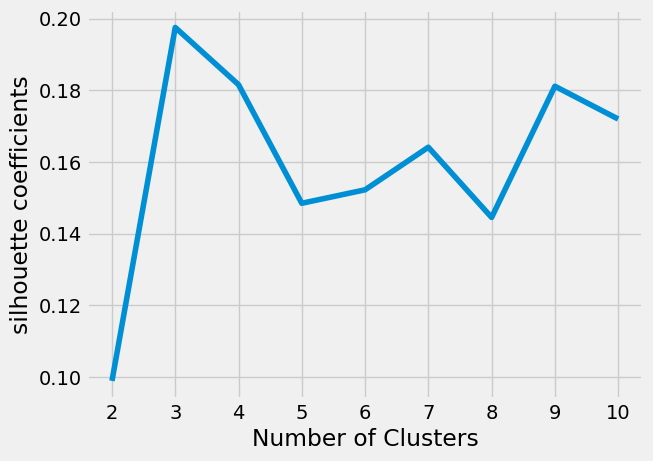

maxs silhouette 0.19757328681771696


In [193]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score
silhouette_coefficients = []
for k in range (2,11):
    minibatch = MiniBatchKMeans(n_clusters=k, random_state =42, batch_size=50)
    minibatch.fit(X)
    score = silhouette_score(X, minibatch.predict(X))
    silhouette_coefficients.append(score)
plt.style.use("fivethirtyeight")
plt.plot(range(2,11), silhouette_coefficients)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show()
print('maxs silhouette',max(silhouette_coefficients))

### results without outliers

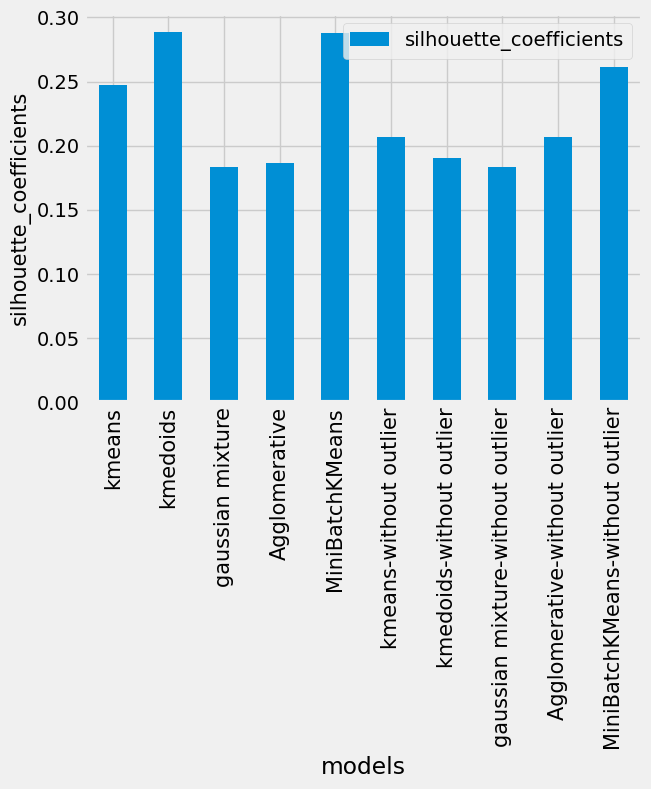

In [194]:
df13 = pd.DataFrame({'models':['kmeans','kmedoids','gaussian mixture','Agglomerative','MiniBatchKMeans' ,'kmeans-without outlier','kmedoids-without outlier', 'gaussian mixture-without outlier', 'Agglomerative-without outlier','MiniBatchKMeans-without outlier'], 'silhouette_coefficients':[0.24771296656343036,0.2886451888261335,0.18353676992495227,0.1865256797594413,0.28791103092641435,0.2069411643983203, 0.19029020866341254, 0.18353676992495227,0.2069411643983203,0.2615206109661179]})
ax = df13.plot.bar(x='models', y='silhouette_coefficients', rot=90)
plt.xticks(fontsize=15)
plt.ylabel("silhouette_coefficients",fontsize=15)
plt.show()

# All results

In [195]:
df13.sort_values(by='silhouette_coefficients',inplace=True,ascending=False)
df13['number of clusters'] = [2,3,2,3,3,10,8,2,2,2]
df13.reset_index( inplace = True)
df13.drop('index',axis=1,inplace = True)
df13

,models,silhouette_coefficients,number of clusters
0,kmedoids,0.288645,2
1,MiniBatchKMeans,0.287911,3
2,MiniBatchKMeans-without outlier,0.261521,2
3,kmeans,0.247713,3
4,kmeans-without outlier,0.206941,3
5,Agglomerative-without outlier,0.206941,10
6,kmedoids-without outlier,0.190290,8
7,Agglomerative,0.186526,2
8,gaussian mixture,0.183537,2
9,gaussian mixture-without outlier,0.183537,2


## final data with clustering of kmedoids algorithm

In [196]:
df_cluster_with_kmediods

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,1
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6,1
8632,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,1
8633,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,1
8634,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,1


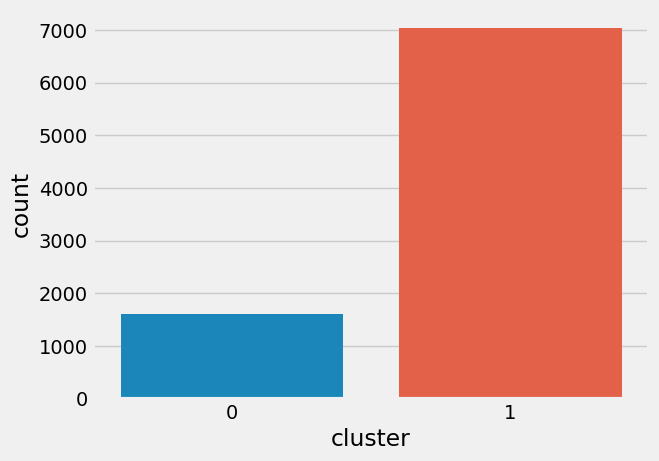

In [197]:
sns.countplot(x=df_cluster_with_kmediods.cluster)
plt.show()

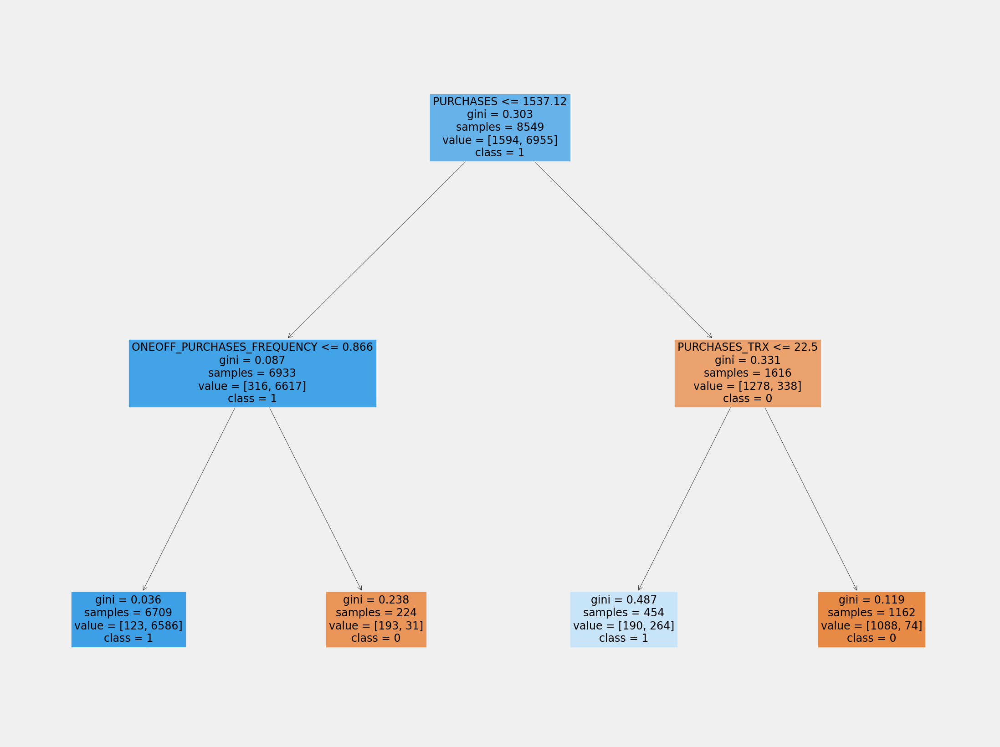

In [198]:
##visualization desision tree to find features that efect on decision
from sklearn import tree
from sklearn.model_selection  import train_test_split
X = df_cluster_with_kmediods. drop('cluster', axis =1)
y = df_cluster_with_kmediods['cluster']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.01,random_state=1)
clf = DecisionTreeClassifier(max_depth=2)
clf = clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
feature_names = ['BALANCE','BALANCE_FREQUENCY','PURCHASES','ONEOFF_PURCHASES','INSTALLMENTS_PURCHASES','CASH_ADVANCE','PURCHASES_FREQUENCY',
                'ONEOFF_PURCHASES_FREQUENCY','PURCHASES_INSTALLMENTS_FREQUENCY','CASH_ADVANCE_FREQUENCY','CASH_ADVANCE_TRX','PURCHASES_TRX',
                'CREDIT_LIMIT','PAYMENTS','MINIMUM_PAYMENTS','PRC_FULL_PAYMENT','TENURE']
target_names =['0','1']
fig = plt.figure(figsize=(25,20))
plot = tree.plot_tree(clf,
                     feature_names = feature_names,
                     class_names = target_names,
                     filled = True)
fig.savefig("Tree1.png")

### تفسیر کلاسها با توجه به درخت تصمیم
افراد بیشتر در کلاس دو طبقه بندی می شوند

class 0:ONEOFF_PURCHASES_FREQUENCY <= 0.866 and PURCHASES <= 1537

کلاس صفر شامل 7029 نفر است که این افراد مقدار خریدهای انجام شده از حساب کمتر از 1537  است و تعداد دفعات خرید یکباره
 از 0.866 کمتر است

class 1:(PURCHASES_TRX <= 22.5) and (PURCHASES > 1537)

کلاس یک شامل 1607 نفر است که این افراد مقدار خریدهای انجام شده از حساب بیشتر از1664 است و همچنین تعداد تراکنشهای خرید کمتر از 22.5 است


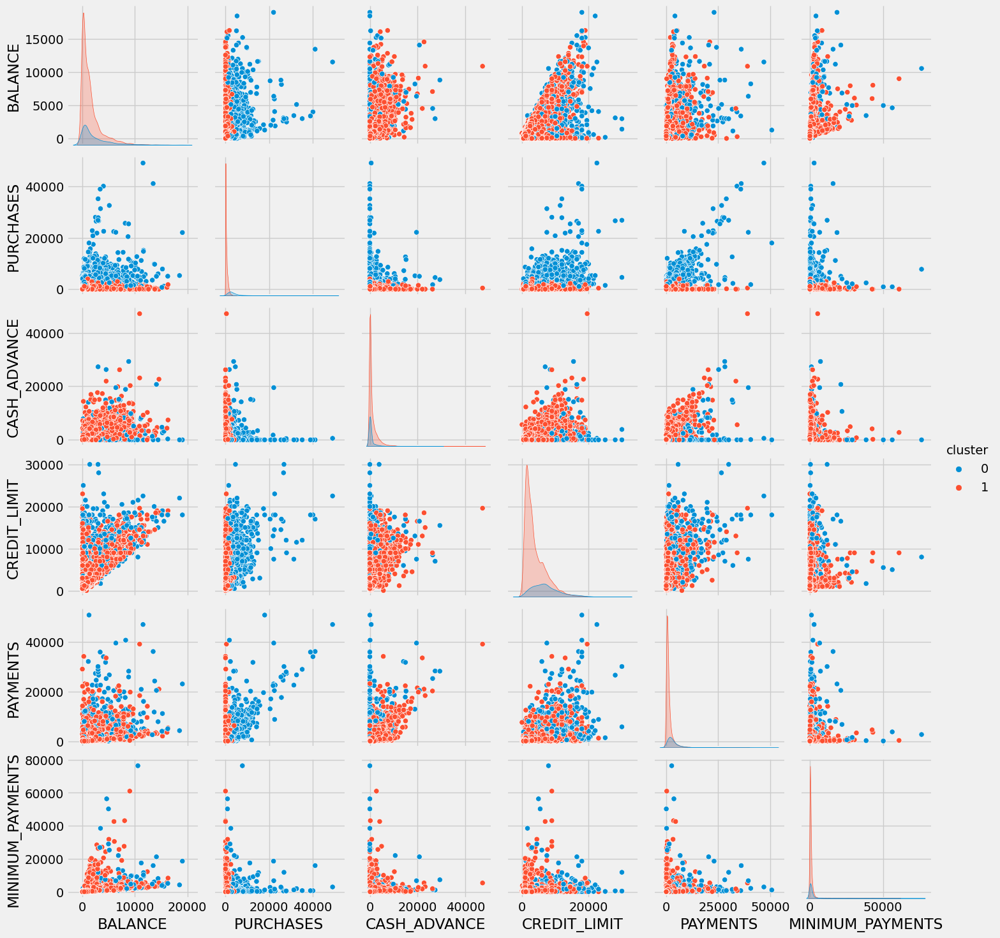

In [199]:
#در این قسمت چندین فیجر که پیوسته هستند را انتخاب می کنم تا نحوه ی کلاستربندی آنها را نیز مشاهده کنم
best_cols = ["BALANCE", "PURCHASES", "CASH_ADVANCE","CREDIT_LIMIT", "PAYMENTS", "MINIMUM_PAYMENTS","cluster"]
sns.pairplot( df_cluster_with_kmediods[ best_cols ], hue="cluster")